In [1]:
# Ocean Heat Budget Analyses in the Antarctica continental shelf (WAOM)

# Fabio B Dias - 20 August 2024

# using mask of longitudinal(+latitudinal in the Ant.Penins)-bins created by 
# - WAOM10(4/4_notides/2)extend_shflim_S_0.25Q_OHB_shelf_budget_closure.ipynb
# to integrated over regions.
# Using mask for cont. shelf, land and ice shelf cavities, we
# can separate the heat tendency in each region due to individual
# processes (e.g. advection, diffusion, sfc fluxes)

## loading saved netcdf with each component of RHS heat budget eqn., 
# integrated horizontally & vertically.
# 
#waom_notebook/OHB_shelf/OHB_closure/WAOM10_OHB_[hadv/vadv/hdiff/vdiff]_regional_using_lonlat_masks[].py_iceshelf
# _iceshelf refers to only int. within ice shelf cavities of each subsector


In [2]:
# read nc output from WAOM 10km run

import xarray as xr
# import pandas as p
import numpy as np
import numpy.ma as ma
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib as mpl
# mpl.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.dates as dates
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps

import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from datetime import datetime, timedelta

from netCDF4 import Dataset
from netCDF4 import num2date, date2num
from matplotlib.ticker import NullFormatter
from matplotlib.colors import LinearSegmentedColormap   # for custom colormaps

import gsw
import cmocean

import pyresample

from dask.distributed import Client
import logging
import warnings
warnings.filterwarnings('ignore')

In [3]:
client = Client(threads_per_worker=1, memory_limit=0, silence_logs=logging.ERROR)
print(client)

<Client: 'tcp://127.0.0.1:37333' processes=28 threads=28>


In [4]:
fig_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/'

In [5]:
%%time
    
    # using xr.open_mfdataset
    
    vars2drop = ["ubar","vbar","w","Hsbl","Hbbl","swrad"]
    
    ds = xr.open_mfdataset(paths="/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom10extend_shflim_S_0.25Q/output_20yr_diag_daily/ocean_avg_00*.nc" , chunks={'eta_rho': '200MB'}, parallel=bool, drop_variables=vars2drop, decode_times=False) # , concat_dim="ocean_time"
    
    m = ds.variables["m"]
    time_avg = ds.variables["ocean_time"] 
    ice_draft = ds.variables["zice"]
    
    mask_zice = ma.masked_where(ice_draft < 0, np.ones(ice_draft.shape))
    mask_outice = ma.masked_where(ice_draft >= 0, np.ones(ice_draft.shape))
    
    print("Vtransform=2")
    #  New formulation (Vtransform(ng) = 2):
    #
    #         z_w(x,y,s,t) = zeta(x,y,t) + [zeta(x,y,t)+ h(x,y)] * Zo_w
    #                 Zo_w = [hc * s(k) + C(k) * h(x,y)] / [hc + h(x,y)]
    # hwater = ds.h- abs(ds.zice) # replace ds.h for hwater below
    # Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * hwater) / (ds.hc + hwater)
    # z_rho = ds.zeta + (ds.zeta + hwater) * Zo_rho 
    
    # Zo_w = (ds.hc * ds.s_w + ds.Cs_w * hwater) / (ds.hc + hwater)
    # z_w = ds.zeta + (ds.zeta + hwater) * Zo_w 
    
    dg = xr.open_dataset("/g/data/hh5/tmp/access-om/fbd581/ROMS/waom10_frc/waom10extend_grd.nc")
    
    lat_rho = dg.variables["lat_rho"]
    lon_rho = dg.variables["lon_rho"]
    lat_u = dg.variables["lat_u"]
    lon_u = dg.variables["lon_u"]
    lat_v = dg.variables["lat_v"]
    lon_v = dg.variables["lon_v"]
    pm = dg.variables["pm"]
    pn = dg.variables["pn"]
    h = dg.variables["h"]
    zice = dg.variables["zice"]
    
    ds.coords['lat_rho']=lat_rho.transpose() # put lat_rho into ds dataset
    ds.coords['lon_rho']=lon_rho.transpose() # put lon_rho into ds dataset
    ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
    
    ds.close()
    dg.close()
    
    # calculate surface sigma_theta (potential density)
    # sigma_t_sfc = gsw.rho(salt[:,-1,:,:],temp[:,-1,:,:],0) - 1000
    area=np.divide(1,pm*pn)

    # Z_w = z_w.transpose('ocean_time','s_w','eta_rho','xi_rho')
    # print(z_w.shape, Z_w.shape)
    # dz = np.diff(Z_w,axis=1)

Vtransform=2
CPU times: user 24.7 s, sys: 4.7 s, total: 29.4 s
Wall time: 52.4 s


In [6]:
# %%time
# # load horizontal diffusion of heat calculated online:
# 	# float temp_hdiff(ocean_time, s_rho, eta_rho, xi_rho) ;
    
#     ds = xr.open_mfdataset(paths="/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom10extend_shflim_S_0.25Q/output_20yr_diag_daily/ocean_dia_00*.nc" , chunks={'eta_rho': '200MB'}, parallel=bool, drop_variables=vars2drop, decode_times=False)
#     temp_hdiff = ds.temp_hdiff
#     temp_vdiff = ds.temp_vdiff
#     temp_hadv = ds.temp_hadv
#     temp_vadv = ds.temp_vadv
#     ds.close()

In [7]:
    # ds = xr.open_mfdataset(paths="/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_yr10_diag_daily/ocean_dia_00*.nc" , chunks={'eta_rho': '200MB'}, parallel=bool, drop_variables=vars2drop, decode_times=False)
    # temp_hdiff_4km = ds.temp_hdiff
    # ds.close()

In [8]:
# print(temp_hdiff_4km.shape)#, dz_5d.shape)

In [9]:
    # # convert dz to xarray:
    # months=np.arange(0,365)*(1/30.41667)
    # # save to netcdf file:
    # coordinatesC=dict(ocean_time=months, s_rho=(['s_rho'], np.arange(0,31)), eta_rho=(['eta_rho'], np.arange(0,560)), xi_rho=(['xi_rho'], np.arange(0,630)))
    
    # dz_xr = xr.DataArray(dz, coords = coordinatesC, dims = ['ocean_time','s_rho','eta_rho','xi_rho'])

In [10]:
du = xr.open_mfdataset(paths="/g/data/hh5/tmp/access-om/fbd581/ROMS/waom4_frc/waom4extend_sustr.nc" , chunks={'eta_rho': '200MB'}, parallel=bool, drop_variables=vars2drop, decode_times=False)
sustr = du.sustr
du.close()

dv = xr.open_mfdataset(paths="/g/data/hh5/tmp/access-om/fbd581/ROMS/waom4_frc/waom4extend_svstr.nc" , chunks={'eta_rho': '200MB'}, parallel=bool, drop_variables=vars2drop, decode_times=False)
svstr = dv.svstr
dv.close()

In [11]:
%%time

# load waom4 3D temp field to plot some maps
# path_ECCO2_4km = '/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_00*.nc'

# ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_yr10_diag_daily/ocean_avg_00*.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
# ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_00*.nc~')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
ds = xr.open_mfdataset(paths='/g/data/hh5/tmp/access-om/fbd581/ROMS/OUTPUT/waom4extend_shflim_S_0.25Q/output_01-20yr/ocean_avg_0010.nc')#, chunks={'eta_rho': '200MB'}, parallel=True, decode_times=False)
salt3d_4km= ds.salt
temp3d_4km= ds.temp
u3d_4km= ds.variables["u"]
v3d_4km= ds.variables["v"]
melt_4km= ds.m
shflux_4km= ds.shflux

ds = ds.set_coords(['Cs_r', 'Cs_w', 'hc', 'h', 'Vtransform'])
# calc dz:
hwater = ds.h -abs(ds.zice) # replace ds.h for hwater below
Zo_rho = (ds.hc * ds.s_rho + ds.Cs_r * hwater) / (ds.hc + hwater)
z_rho3d_4km = ds.zeta + (ds.zeta + hwater) * Zo_rho -abs(ds.zice)
del Zo_rho
ds.close()

 # read grid file for lon/lat coordinates
dg = xr.open_dataset("/g/data3/hh5/tmp/access-om/fbd581/ROMS/waom4_frc/waom4extend_grd.nc")
angle_4km= dg.variables["angle"]
lat_rho_4km= dg.variables["lat_rho"]
lon_rho_4km = dg.variables["lon_rho"]
lat_u_4km= dg.variables["lat_u"]
lon_u_4km = dg.variables["lon_u"]
lat_v_4km= dg.variables["lat_v"]
lon_v_4km = dg.variables["lon_v"]
pm_4km = dg.variables["pm"]
pn_4km = dg.variables["pn"]
zice_4km = dg.variables["zice"]
h_4km = dg.variables["h"]
dg.close()
print('Print lon/lat_rho shapes',lon_rho_4km.shape, lat_rho_4km.shape)
print('Print lon/lat_rho shapes',lon_rho_4km[0:-1,0:-1].shape, lat_rho_4km[0:-1,0:-1].shape)

# load along 1500m and CF WAOM4 variables:
tmp_files_dir = '/g/data3/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'

expt = 'WAOM4'

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_1500m_daily_v3')
temp_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_1500m_daily_v3')
salt_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_1500m_daily_v4') 
z_rho_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_1500m_v3')
dist_along_4km = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_1500m_v3')
lon_along_4km = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_1500m_v3')
lat_along_4km = ds.variables["two"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_temp_CF_daily_v3')
temp_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_salt_CF_daily_v3')
salt_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_z_rho_CF_daily_v4') 
z_rho_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_dist_along_CF_v3')
dist_along_4km_CF = ds.variables["__xarray_dataarray_variable__"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lon_along_CF_v3')
lon_along_4km_CF = ds.variables["one"]
ds.close()

ds = xr.open_dataset(tmp_files_dir + expt + '_lat_along_CF_v3')
lat_along_4km_CF = ds.variables["two"]
ds.close()

# define along_contour axis with same length for both resolutions:
[dist_along_axis_4km, Zaxis_4km] = np.meshgrid(dist_along_4km, np.arange(0,31))

[dist_along_axis_4km_CF, Zaxis_4km_CF] = np.meshgrid(dist_along_4km_CF, np.arange(0,31))

## load contours for plotting on top of Maps:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
contour_masked_above_4km = np.load(files_path + 'WAOM4_contour_masked_above_1500m', allow_pickle=True)
contour_masked_above_CF_4km = np.load(files_path + 'WAOM4_contour_masked_above_CF_v3', allow_pickle=True)

# 2) calculate OHC depth-integrated:
Tf = -3.534879684448242
rho0 = 1035 # kg. m-3
Cp = 3992.1 # J.kg-1.degC-1
temp3d_4km.load()
temp3d_4km_K = temp3d_4km-Tf
temp3d_vint_4km_annual = temp3d_4km_K.sum('s_rho').mean('ocean_time')*rho0*Cp
print(temp3d_vint_4km_annual.shape)

# 3) melt fields
melt_4km.load()

Print lon/lat_rho shapes (1400, 1575) (1400, 1575)
Print lon/lat_rho shapes (1399, 1574) (1399, 1574)
(1400, 1575)
CPU times: user 11.5 s, sys: 9.49 s, total: 20.9 s
Wall time: 34.7 s


<xarray.DataArray 'm' (ocean_time: 12, eta_rho: 1400, xi_rho: 1575)>
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
...
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)
Coordinates:
    x_rho       (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    y_rho       (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
  * ocean_time  (ocean_time) datetime64[ns] 2016-01-14T05:00:00 ... 2016-12-1...
Dimensions without coordinates: eta_rho, xi_rho
Attributes:
    long_name:  time-averaged ice shelf melt rate
    units:      meter second-1
    time:       ocean_time
    field:      melt_rate, scalar, series

In [12]:
contour_masked_above = np.load(files_path + 'WAOM10_contour_masked_above_1500m_v3', allow_pickle=True)
contour_masked_above_CF = np.load(files_path + 'WAOM10_contour_masked_above_CF_v3', allow_pickle=True)

mask_shelf = ma.masked_where(contour_masked_above==-1000, np.ones(h.shape))
mask_iceshelf = ma.masked_where(contour_masked_above_CF!=-1000, np.ones(h.shape))
mask_outiceshelf = ma.masked_where(contour_masked_above_CF==-1000, np.ones(h.shape))

mask_land = ma.masked_where(h_4km<=40, np.ones(h_4km.shape))
mask_zice = ma.masked_where(zice_4km < 0, np.ones(zice_4km.shape))
mask_outice = ma.masked_where(zice_4km >= 0, np.ones(zice_4km.shape))


In [13]:
# define masks for cavities less_equal than 500m & more than 500m ice draft depth (to separate modes into shallow and deep):

msk_ice_shallow = ma.masked_where(zice_4km<-500, np.ones(zice_4km.shape))
msk_ice_deep = ma.masked_where(zice_4km>=-500, np.ones(zice_4km.shape))


In [14]:
w4_mask_shelf = ma.masked_where(contour_masked_above_4km==-1000, np.ones(h_4km.shape))
w4_mask_iceshelf = ma.masked_where(contour_masked_above_CF_4km!=-1000, np.ones(h_4km.shape))
w4_mask_outiceshelf = ma.masked_where(contour_masked_above_CF_4km==-1000, np.ones(h_4km.shape))

w4_mask_land = ma.masked_where(h_4km<=40, np.ones(h_4km.shape))
w4_mask_zice = ma.masked_where(zice_4km < 0, np.ones(zice_4km.shape))

### plot Basal melting divided into shallower x deeper of 500m:

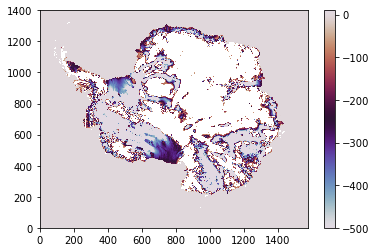

In [43]:
plt.pcolormesh(zice_4km*w4_mask_land, cmap='twilight')#*mask_land)
# plt.pcolormesh(msk_ice_shallow*mask_land)
# plt.pcolormesh(mask_zice)
plt.clim(-500,10)
plt.colorbar()


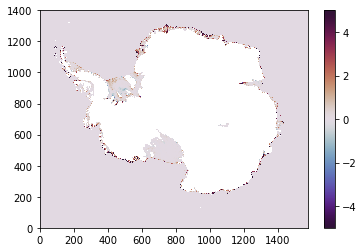

In [44]:
plt.pcolormesh(melt_4km[0,:]*86400*365.25, cmap='twilight_shifted')
plt.clim(-5,5)
plt.colorbar()

In [17]:
# for ll in range(50,55):
for ll in range(30,55):
    # plt.pcolormesh(zice_4km*w4_mask_land*w4_mask_shelf*mask_LonBins_4km[ll,:], cmap='twilight')#*mask_land
    plt.pcolormesh(melt_4km[0,:]*86400*365*mask_LonBins_4km[ll,:], cmap='twilight_shifted', vmin=-5, vmax=5)#*mask_land
plt.clim(-5,5)

# plt.clim(-2000,-400)
plt.colorbar()

NameError: name 'mask_LonBins_4km' is not defined

In [ ]:
fig = plt.figure(figsize=(12,8))

# plt.pcolormesh(zice*mask_land)
plt.pcolormesh(msk_ice_shallow*melt_4km[0,:]*(86400*365.25), cmap='twilight_shifted')
plt.clim(-5,5)
plt.colorbar()

In [ ]:
fig = plt.figure(figsize=(12,8))

# plt.pcolormesh(zice*mask_land)
plt.pcolormesh(msk_ice_deep*melt_4km[0,:]*(86400*365.25), cmap='twilight_shifted')
plt.clim(-5,5)
plt.colorbar()

In [ ]:
fig = plt.figure(figsize=(12,8))

# plt.pcolormesh(zice*mask_land)
plt.pcolormesh(mask_outice*melt_4km[0,:]*(86400*365.25), cmap='twilight_shifted')
plt.clim(-5,5)
plt.colorbar()

### Load masks lon/lat bins:

In [15]:
area_sum = area.sum('eta_rho').sum('xi_rho')

In [16]:
# define constants:
rho0=1035
Cp=3992.1
# Tf = -1.95 # degC
Tf =  -3.534879684448242

In [17]:
# load mask lon-lat bins:
dm = xr.open_dataset('/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/WAOM10_masked_lonlatBins_v2.nc')
mask_LonBins = dm.variables['__xarray_dataarray_variable__']
dm.close()

dm = xr.open_dataset('/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/WAOM4_masked_lonlatBins_v2.nc')
mask_LonBins_4km = dm.variables['__xarray_dataarray_variable__']
dm.close()

dm = xr.open_dataset('/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/WAOM2_masked_lonlatBins.nc')
mask_LonBins_2km = dm.variables['__xarray_dataarray_variable__']
dm.close()


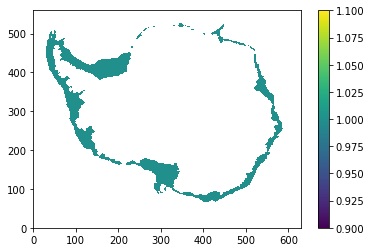

In [18]:
plt.pcolormesh(mask_shelf*mask_iceshelf)
plt.colorbar()

### load pre-saved heat budget components

In [19]:
file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_hadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
hadv = ds.variables['__xarray_dataarray_variable__']
ocean_time = ds.ocean_time
lon_bins = ds.lon_bins
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_hdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
hdiff = ds.variables['__xarray_dataarray_variable__']
ocean_time = ds.ocean_time

lon_bins = ds.lon_bins
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_vadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
vadv = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_vdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
vdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

In [20]:
file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_hadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
hadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_hdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
hdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_vadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
vadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM10_OHB_lonlatbins-v2_temp_vdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
vdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

#### waom4

In [21]:
print(files_path+ "WAOM4_OHB_lonlatbins_temp_hadv_vint_daily.nc")

/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/WAOM4_OHB_lonlatbins_temp_hadv_vint_daily.nc


In [22]:
file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_hadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_hadv = ds.variables['__xarray_dataarray_variable__']
w4_ocean_time = ds.ocean_time
w4_lon_bins = ds.lon_bins
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_hdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_hdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_vadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_vadv = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_vdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_vdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_hadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_hadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_hdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_hdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_vadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_vadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_temp_vdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_vdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

In [23]:
w4_hdiff_is

<xarray.Variable (lon_bins: 141, ocean_time: 365)>
dask.array<open_dataset-122b7670fbb07cd14ee28537971b7352__xarray_dataarray_variable__, shape=(141, 365), dtype=float64, chunksize=(141, 365), chunktype=numpy.ndarray>

In [24]:
file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_hadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_hadv = ds.variables['__xarray_dataarray_variable__']
w4nt_ocean_time = ds.ocean_time
w4nt_lon_bins = ds.lon_bins
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_hdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_hdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_vadv_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_vadv = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_vdiff_vint_daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_vdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_hadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_hadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_hdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_hdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_vadv_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_vadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_temp_vdiff_vint_daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_vdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

### waom2

In [25]:
file = files_path + "WAOM2_OHB_lonlatbins_temp_hadv_vint_5daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_hadv = ds.variables['__xarray_dataarray_variable__']
w2_ocean_time = ds.ocean_time
w2_lon_bins = ds.lon_bins
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_hdiff_vint_5daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_hdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_vadv_vint_5daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_vadv = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_vdiff_vint_5daily.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_vdiff = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_hadv_vint_5daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_hadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_hdiff_vint_5daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_hdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_vadv_vint_5daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_vadv_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_temp_vdiff_vint_5daily_iceshelf.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_vdiff_is = ds.variables['__xarray_dataarray_variable__']
ds.close()

In [26]:
# load basal melting

# non-v2 version has wrong units (didn't divided by masked area_sum).

file = files_path + "WAOM10_OHB_lonlatbins-v2_melt_daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
bmelt = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_melt_daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_bmelt = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM4_notides_OHB_lonlatbins_melt_daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4nt_bmelt = ds.variables['__xarray_dataarray_variable__']
ds.close()

file = files_path + "WAOM2_OHB_lonlatbins_melt_5daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w2_bmelt = ds.variables['__xarray_dataarray_variable__']
ds.close()

In [27]:
# basal melting divided into shallow vs deep (only done for WAOM4 so far):

file = files_path + "WAOM4_OHB_lonlatbins-v2_melt_shallow_daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_bmelt_shallow = ds.variables['__xarray_dataarray_variable__']
lon_bins = ds.variables['lon_bins']

ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_melt_deep_daily_v2.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_bmelt_deep = ds.variables['__xarray_dataarray_variable__']
ds.close()


In [28]:

file = files_path + "WAOM4_OHB_lonlatbins-v2_melt_shallow_daily_v2_300m.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_bmelt_shallow300 = ds.variables['__xarray_dataarray_variable__']
lon_bins = ds.variables['lon_bins']

ds.close()

file = files_path + "WAOM4_OHB_lonlatbins-v2_melt_deep_daily_v2_300m.nc"
ds = xr.open_mfdataset(paths=file, chunks={'eta_rho': '200MB'}, parallel=bool)
w4_bmelt_deep300 = ds.variables['__xarray_dataarray_variable__']
ds.close()


In [29]:
net = hadv + vadv + hdiff + vdiff
net_is = hadv_is + vadv_is + hdiff_is + vdiff_is

w4_net = w4_hadv + w4_vadv + w4_hdiff + w4_vdiff
w4_net_is = w4_hadv_is + w4_vadv_is + w4_hdiff_is + w4_vdiff_is

w4nt_net = w4nt_hadv + w4nt_vadv + w4nt_hdiff + w4nt_vdiff
w4nt_net_is = w4nt_hadv_is + w4nt_vadv_is + w4nt_hdiff_is + w4nt_vdiff_is

w2_net = w2_hadv + w2_vadv + w2_hdiff + w2_vdiff
w2_net_is = w2_hadv_is + w2_vadv_is + w2_hdiff_is + w2_vdiff_is


#### several simple plots to see what's the data looks like:

Text(0, 0.5, 'time (day)')

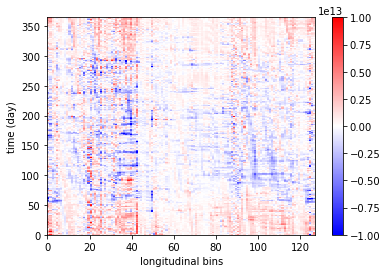

In [29]:
# plt.pcolormesh((net-net_is).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.pcolormesh((net).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.colorbar()
plt.xlabel('longitudinal bins')
plt.ylabel('time (day)')

Text(0, 0.5, 'time (day)')

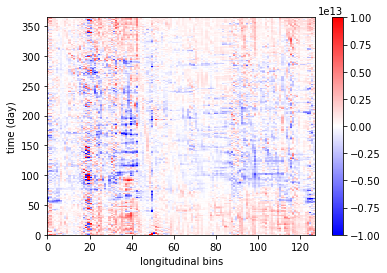

In [30]:
# plt.pcolormesh((w4_net-w4_net_is).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.pcolormesh((w4_net).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.colorbar()
plt.xlabel('longitudinal bins')
plt.ylabel('time (day)')

Text(0, 0.5, 'time (day)')

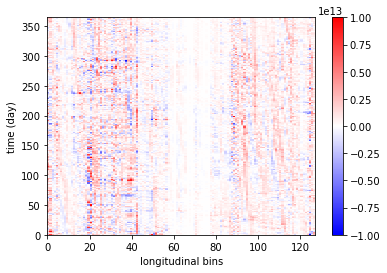

In [31]:
plt.pcolormesh((hadv-hadv_is+hdiff-hdiff_is).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
# plt.pcolormesh((hadv+hdiff).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.colorbar()
plt.xlabel('longitudinal bins')
plt.ylabel('time (day)')

Text(0, 0.5, 'time (day)')

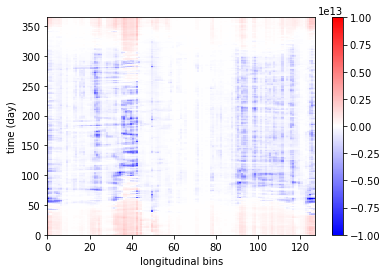

In [32]:
plt.pcolormesh((vadv-vadv_is+vdiff-vdiff_is).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
# plt.pcolormesh((vadv+vdiff).transpose(), vmin=-10e12, vmax=10e12, cmap='bwr')
plt.colorbar()
plt.xlabel('longitudinal bins')
plt.ylabel('time (day)')

Text(0.5, 1.0, 'WAOM10 (daily x 5-daily) OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

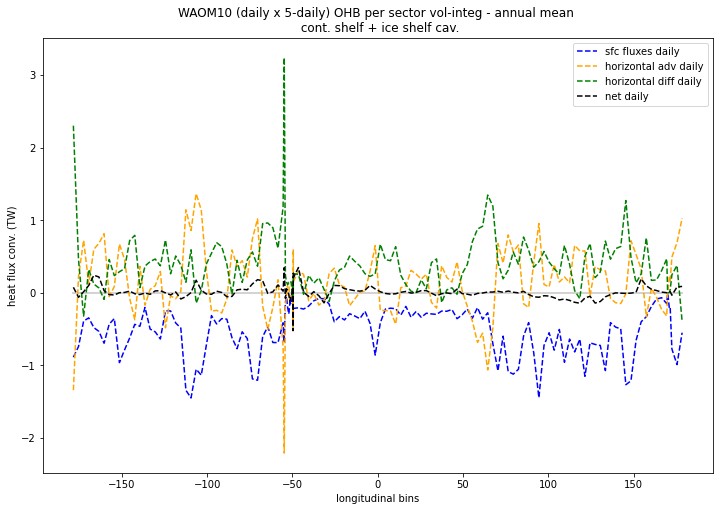

In [102]:
fig = plt.figure(figsize=(12,8))

plt.plot(lon_bins,(net)*0,'-',color='lightgray')
plt.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'--',color='b',
         label='sfc fluxes daily')
plt.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--',color='orange',
         label='horizontal adv daily')
plt.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,'--',color='green',
         label='horizontal diff daily')
plt.plot(lon_bins,(net).mean('ocean_time')*1e-12,'--',color='k',
         label='net daily')

# plt.plot(lon_bins,(vdiff_5d).mean('ocean_time')*1e-12,':',color='b',
#          label='sfc fluxes 5-daily')
# plt.plot(lon_bins,(hadv_5d).mean('ocean_time')*1e-12,':',color='orange',
#          label='horizontal adv 5-daily')
# plt.plot(lon_bins,(hdiff_5d).mean('ocean_time')*1e-12,':',color='green',
#          label='horizontal diff 5-daily')
# plt.plot(lon_bins,(net_5d).mean('ocean_time')*1e-12,':',color='k',
#          label='net 5-daily')

plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM10 (daily x 5-daily) OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

Comparison of the ocean heat budget annual averaged using 5-daily and daily diagnostics 
suggest non-negligible differences. While looking at individual processes, the differences
don't look too substantial, but the net tendency carry some differences at places, in special
the Ross and West Ant. sectors

Text(0.5, 1.0, 'WAOM10x4 OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

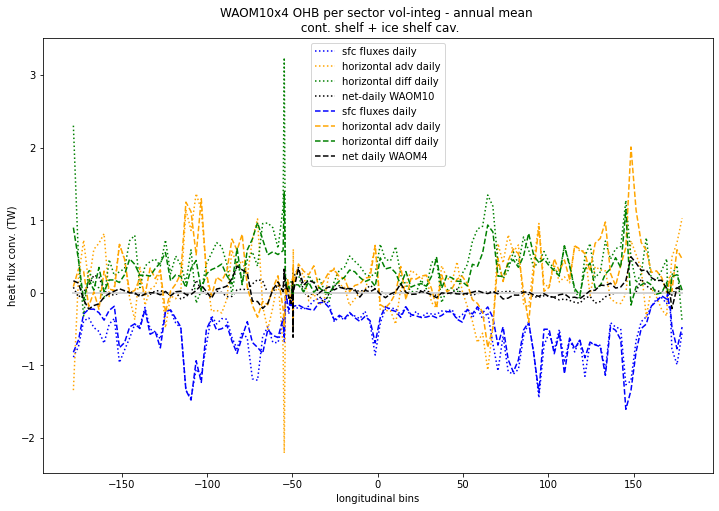

In [36]:
fig = plt.figure(figsize=(12,8))


plt.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,':',color='b',
         label='sfc fluxes daily')
plt.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,':',color='orange',
         label='horizontal adv daily')
plt.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,':',color='green',
         label='horizontal diff daily')
plt.plot(lon_bins,(net).mean('ocean_time')*1e-12,':',color='k',
         label='net-daily WAOM10')

plt.plot(lon_bins,(w4_net)*0,'-',color='lightgray')
plt.plot(lon_bins,(w4_vdiff).mean('ocean_time')*1e-12,'--',color='b',
         label='sfc fluxes daily')
plt.plot(lon_bins,(w4_hadv).mean('ocean_time')*1e-12,'--',color='orange',
         label='horizontal adv daily')
plt.plot(lon_bins,(w4_hdiff).mean('ocean_time')*1e-12,'--',color='green',
         label='horizontal diff daily')
plt.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,'--',color='k',
         label='net daily WAOM4')


plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM10x4 OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

Text(0.5, 1.0, 'WAOM4x4-NOTIDE OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

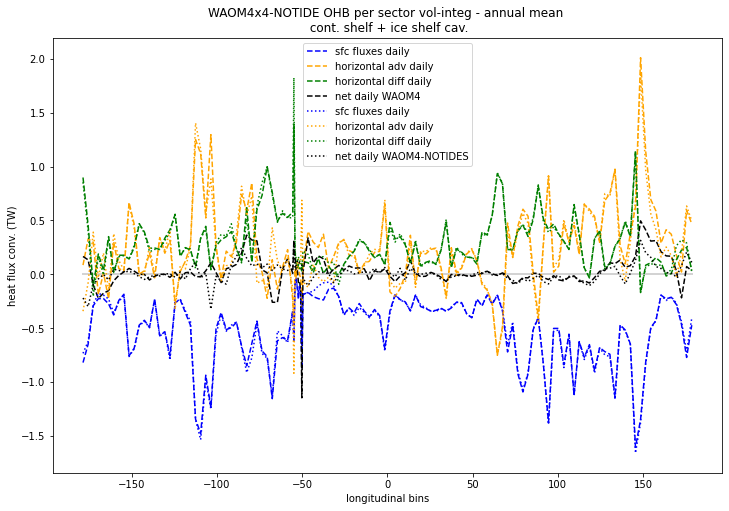

In [35]:
fig = plt.figure(figsize=(12,8))

plt.plot(lon_bins,(w4_net)*0,'-',color='lightgray')
plt.plot(lon_bins,(w4_vdiff).mean('ocean_time')*1e-12,'--',color='b',
         label='sfc fluxes daily')
plt.plot(lon_bins,(w4_hadv).mean('ocean_time')*1e-12,'--',color='orange',
         label='horizontal adv daily')
plt.plot(lon_bins,(w4_hdiff).mean('ocean_time')*1e-12,'--',color='green',
         label='horizontal diff daily')
plt.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,'--',color='k',
         label='net daily WAOM4')

plt.plot(lon_bins,(w4nt_vdiff).mean('ocean_time')*1e-12,':',color='b',
         label='sfc fluxes daily')
plt.plot(lon_bins,(w4nt_hadv).mean('ocean_time')*1e-12,':',color='orange',
         label='horizontal adv daily')
plt.plot(lon_bins,(w4nt_hdiff).mean('ocean_time')*1e-12,':',color='green',
         label='horizontal diff daily')
plt.plot(lon_bins,(w4nt_net).mean('ocean_time')*1e-12,':',color='k',
         label='net daily WAOM4-NOTIDES')

plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM4x4-NOTIDE OHB per sector vol-integ - annual mean \n cont. shelf + ice shelf cav.')

Text(0.5, 1.0, 'WAOM10 OHB per sector vol-integ - annual mean ')

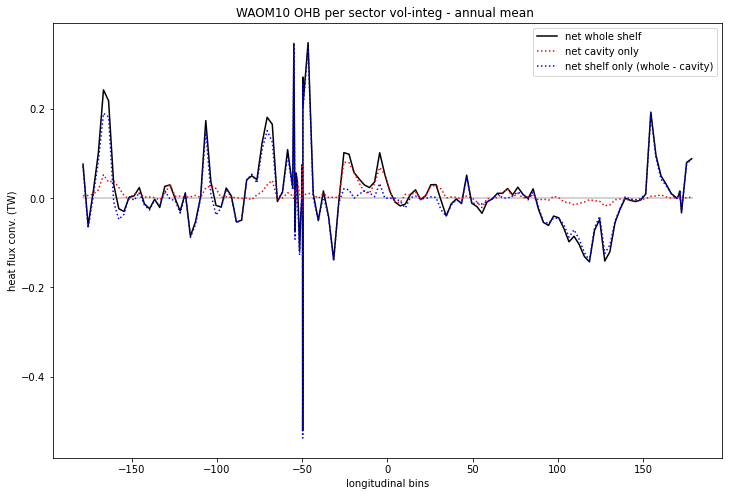

In [39]:
fig = plt.figure(figsize=(12,8))

plt.plot(lon_bins,(net)*0,'-',color='lightgray')
# plt.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'--',color='b',
#          label='sfc fluxes daily')
# plt.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--',color='orange',
#          label='horizontal adv daily')
# plt.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,'--',color='green',
#          label='horizontal diff daily')
plt.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-',color='k',
         label='net whole shelf')

# plt.plot(lon_bins,(vdiff_is).mean('ocean_time')*1e-12,':',color='b',
#          label='sfc fluxes daily')
# plt.plot(lon_bins,(hadv_is).mean('ocean_time')*1e-12,':',color='orange',
#          label='horizontal adv daily')
# plt.plot(lon_bins,(hdiff_is).mean('ocean_time')*1e-12,':',color='green',
#          label='horizontal diff daily')
plt.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,':',color='r',
         label='net cavity only')

plt.plot(lon_bins,(net-net_is).mean('ocean_time')*1e-12,':',color='b',
         label='net shelf only (whole - cavity)')

plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM10 OHB per sector vol-integ - annual mean ')

Text(0.5, 1.0, 'OHB per sector vol-integ - annual mean \n ice shelf cav.')

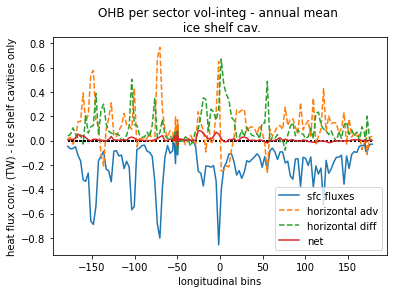

In [40]:
plt.plot(lon_bins,(net_is)*0,':k')
plt.plot(lon_bins,(vdiff_is).mean('ocean_time')*1e-12,label='sfc fluxes')
plt.plot(lon_bins,(hadv_is).mean('ocean_time')*1e-12,'--',label='horizontal adv')
plt.plot(lon_bins,(hdiff_is).mean('ocean_time')*1e-12,'--',label='horizontal diff')
plt.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,label='net')
plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW) - ice shelf cavities only')
plt.title('OHB per sector vol-integ - annual mean \n ice shelf cav.')

Text(0.5, 1.0, 'OHB per sector vol-integ - annual mean \n ice shelf cav.')

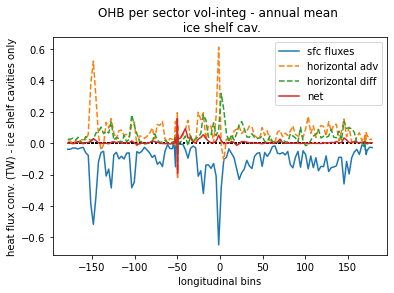

In [41]:
plt.plot(lon_bins,(w4_net_is)*0,':k')
plt.plot(lon_bins,(w4_vdiff_is).mean('ocean_time')*1e-12,label='sfc fluxes')
plt.plot(lon_bins,(w4_hadv_is).mean('ocean_time')*1e-12,'--',label='horizontal adv')
plt.plot(lon_bins,(w4_hdiff_is).mean('ocean_time')*1e-12,'--',label='horizontal diff')
plt.plot(lon_bins,(w4_net_is).mean('ocean_time')*1e-12,label='net')
plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW) - ice shelf cavities only')
plt.title('OHB per sector vol-integ - annual mean \n ice shelf cav.')

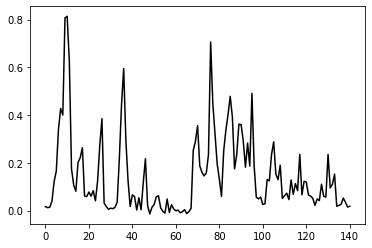

In [42]:
plt.plot(np.nanmean(bmelt, axis=0),'-k')


Text(0.5, 1.0, 'Basal melting (mm/yr)')

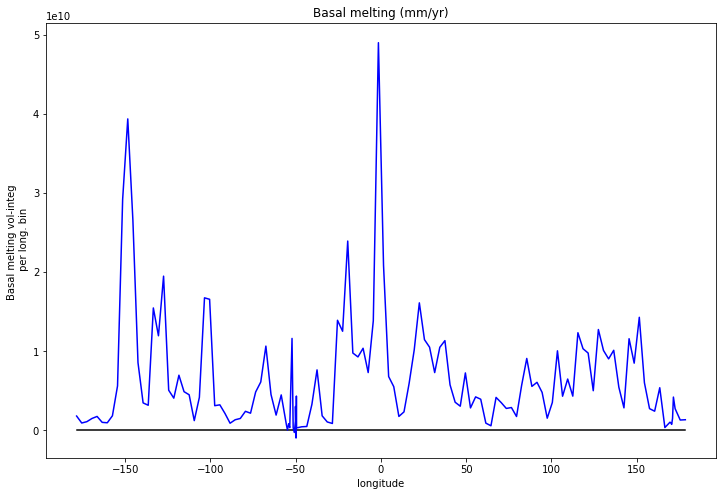

In [44]:
fig = plt.figure(figsize=(12,8))
plt.plot(lon_bins,np.nanmean(bmelt, axis=0),'-k')
plt.plot(lon_bins,np.nanmean(w4_bmelt, axis=0),'-b')
# plt.plot(lon_bins,np.nanmean(w4nt_bmelt, axis=0),'--b')
# plt.plot(lon_bins,np.nanmean(w2_bmelt, axis=0),'-r')
plt.xlabel('longitude')
plt.ylabel('Basal melting vol-integ \n per long. bin')
plt.title('Basal melting (mm/yr)')

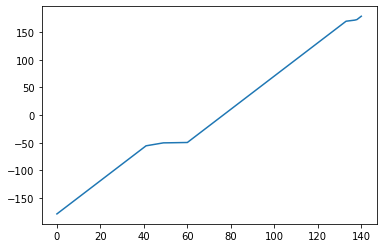

In [147]:
plt.plot(lon_bins)

Text(0.5, 1.0, 'Division at 500m')

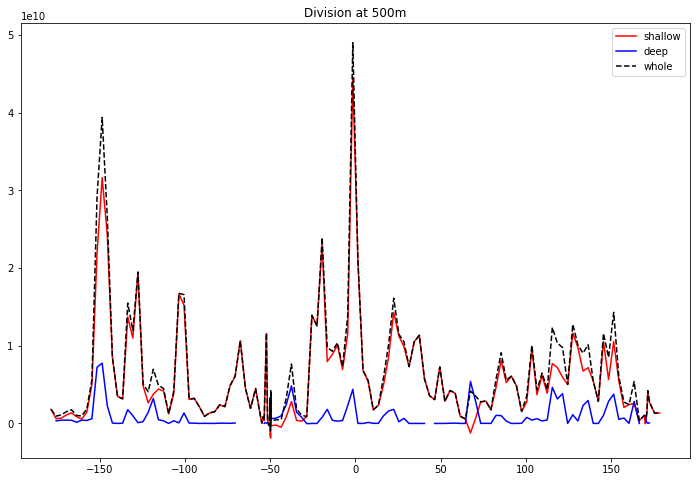

In [148]:
fig = plt.figure(figsize=(12,8))

# plt.plot(lon_bins,np.divide(np.mean(w4nt_bmelt, axis=0),1),'-k',label='whole NT')
# plt.plot(lon_bins,-np.mean(w4_bmelt_deep, axis=0) + np.mean(w4_bmelt_shallow, axis=0),'--g',label='sha+deep')

plt.plot(lon_bins,np.nanmean(w4_bmelt_shallow, axis=0),'-r',label='shallow')
plt.plot(lon_bins,np.nanmean(w4_bmelt_deep, axis=0),'-b',label='deep')
plt.plot(lon_bins,np.nanmean(w4_bmelt, axis=0),'--k',label='whole')
# plt.plot(lon_bins,np.nanmean(w4_bmelt, axis=0) - np.mean(w4_bmelt_shallow, axis=0),'--g',label='total - shallow (deep)')
# plt.plot(lon_bins,np.nanmean(w4_bmelt_deep, axis=0) + np.mean(w4_bmelt_shallow, axis=0),'--g',label='total - shallow (deep)')
# plt.ylim(-.2,1.5)
plt.legend()
plt.title('Division at 500m')


In [154]:
w4_bmelt_shallow.shape

(365, 141)

(-2.0, 3.0)

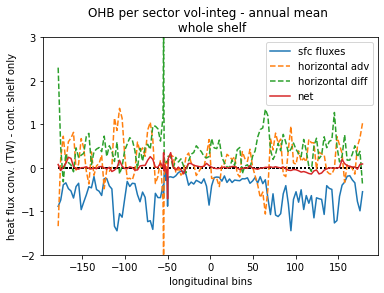

In [39]:
plt.plot(lon_bins,(net)*0,':k')
plt.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,label='sfc fluxes')
plt.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--',label='horizontal adv')
plt.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,'--',label='horizontal diff')
plt.plot(lon_bins,(net).mean('ocean_time')*1e-12,label='net')
plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW) - cont. shelf only')
plt.title('OHB per sector vol-integ - annual mean \n whole shelf')
plt.ylim(-2,3)

Text(0.5, 1.0, 'WAOM10 - OHB per sector vol-integ  and cumsummed \n annual mean')

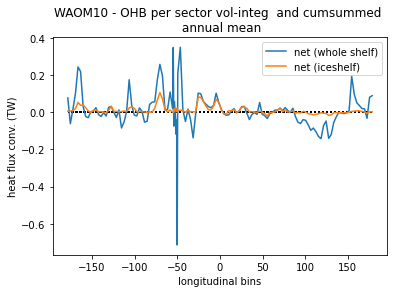

In [40]:
plt.plot(lon_bins,(net)*0,':k')
plt.plot(lon_bins,(net).mean('ocean_time')*1e-12,label='net (whole shelf)')
plt.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,label='net (iceshelf)')
plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM10 - OHB per sector vol-integ  and cumsummed \n annual mean')

Text(0.5, 1.0, 'WAOM4 - OHB per sector vol-integ  and cumsummed \n annual mean')

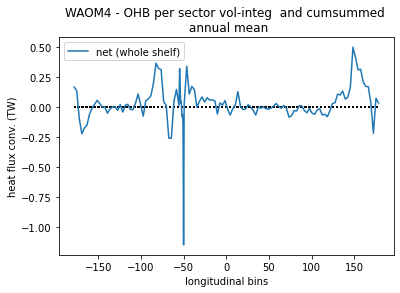

In [41]:
plt.plot(lon_bins,(net)*0,':k')
plt.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,label='net (whole shelf)')
# plt.plot(lon_bins,(w4_net_is).mean('ocean_time')*1e-12,label='net (iceshelf)')
plt.legend()
plt.xlabel('longitudinal bins')
plt.ylabel('heat flux conv. (TW)')
plt.title('WAOM4 - OHB per sector vol-integ  and cumsummed \n annual mean')

#### seasonal plots for each experiment:

In [42]:
## cumsum plot with 4 panels:
# 1. cumsum net (cont shelf), annual + seasons
# 2. cumsum RHS (cont shelf), annual + seasons
# 3. cumsum net (ice shelf), annual + seasons
# 4. cumsum RHS (ice shelf), annual + seasons

In [43]:
# plt.plot(range(0,92),',')
print(len(range(0,92)),
      len(range(92,183)),
      len(range(183,274)),
      len(range(274,365)))


92 91 91 91


In [44]:
# - indexes (daily):

print(np.arange(0,92),np.arange(92,183),np.arange(183,274),np.arange(274,365))
print(np.arange(0,92).shape,np.arange(92,183).shape,np.arange(183,274).shape,np.arange(274,365).shape)

s1i = 0
s1e = 92
s2i = 92
s2e = 183
s3i = 183
s3e = 274
s4i = 274
s4e = 365


[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91] [ 92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163
 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181
 182] [183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200
 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218
 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236
 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254
 255 256 257 258 259 260 261 262 263 264 265 266 267 268

In [45]:
# - indexes (5-daily):

print(np.arange(0,19),np.arange(19,37),np.arange(37,55),np.arange(55,73))
print(np.arange(0,19).shape,np.arange(19,37).shape,np.arange(37,55).shape,np.arange(55,73).shape)

s1i_5d = 0
s1e_5d = 19
s2i_5d = 19
s2e_5d = 37
s3i_5d = 37
s3e_5d = 55
s4i_5d = 55
s4e_5d = 73

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18] [19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36] [37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54] [55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72]
(19,) (18,) (18,) (18,)


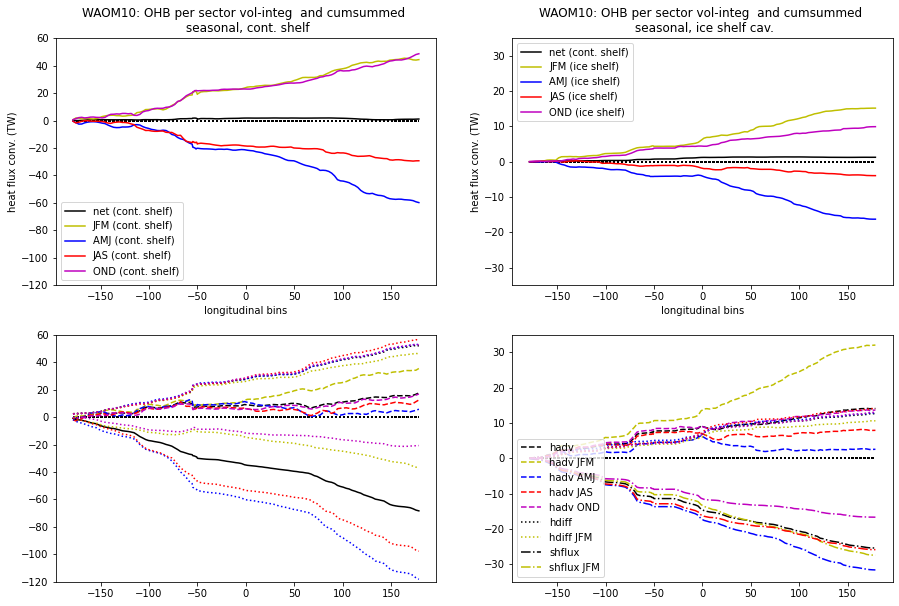

In [46]:
fig = plt.figure(figsize=(15,10))

# Original WAOM10
ax1 = fig.add_subplot(221)# projection=proj)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('heat flux conv. (TW)')
ax1.set_title('WAOM10: OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-120,60)

ax2 = fig.add_subplot(223)# projection=proj)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.plot(lon_bins,(hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax2.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax2.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax2.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax2.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax2.plot(lon_bins,(vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax2.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax2.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax2.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax2.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
# ax2.legend()
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2.set_ylim(-120,60)

ax3 = fig.add_subplot(222)# projection=proj)
ax3.plot(lon_bins,(net)*0,':k')
ax3.plot(lon_bins,(net_is).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('WAOM10: OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-35,35)

ax4 = fig.add_subplot(224)# projection=proj)
ax4.plot(lon_bins,(net)*0,':k')
ax4.plot(lon_bins,(hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax4.plot(lon_bins,(hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
ax4.plot(lon_bins,(vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)

name_fig='waom10_lonbin_regional_OHBcumsum_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

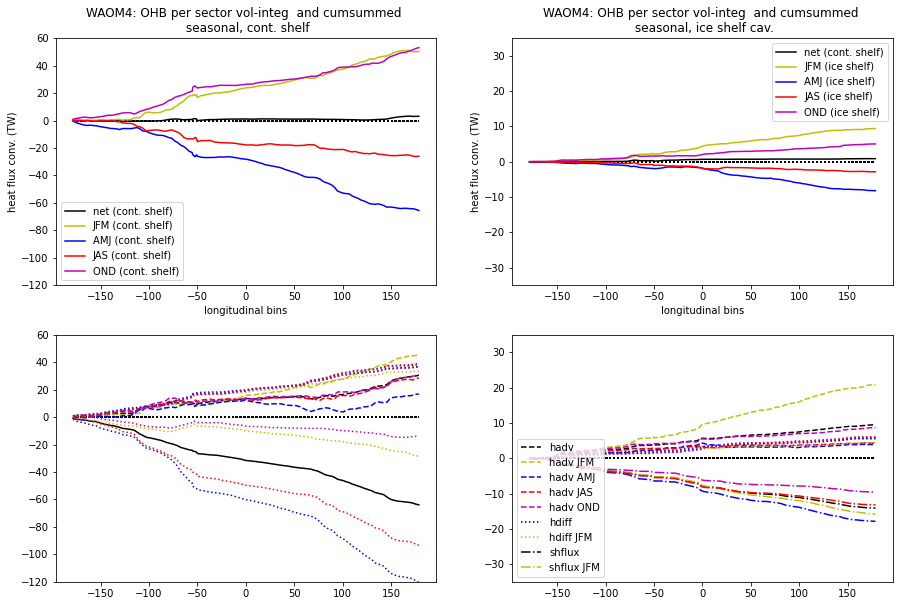

In [47]:
fig = plt.figure(figsize=(15,10))

# Original WAOM4
ax1 = fig.add_subplot(221)# projection=proj)
ax1.plot(lon_bins,(w4_net)*0,':k')
ax1.plot(lon_bins,(w4_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('heat flux conv. (TW)')
ax1.set_title('WAOM4: OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-120,60)

ax2 = fig.add_subplot(223)# projection=proj)
ax2.plot(lon_bins,(w4_net)*0,':k')
ax2.plot(lon_bins,(w4_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.plot(lon_bins,(w4_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax2.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax2.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax2.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax2.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax2.plot(lon_bins,(w4_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax2.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax2.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax2.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax2.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
# ax2.legend()
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2.set_ylim(-120,60)

ax3 = fig.add_subplot(222)# projection=proj)
ax3.plot(lon_bins,(w4_net)*0,':k')
ax3.plot(lon_bins,(w4_net_is).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('WAOM4: OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-35,35)

ax4 = fig.add_subplot(224)# projection=proj)
ax4.plot(lon_bins,(w4_net)*0,':k')
ax4.plot(lon_bins,(w4_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax4.plot(lon_bins,(w4_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
ax4.plot(lon_bins,(w4_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)

name_fig='waom4_lonbin_regional_OHBcumsum_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

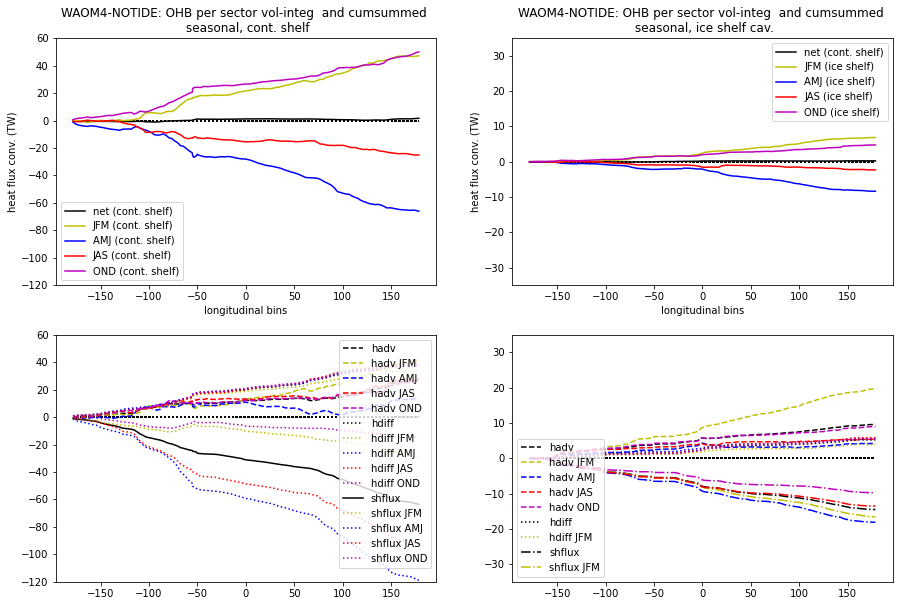

In [48]:
fig = plt.figure(figsize=(15,10))

# WAOM4-NOTIDE
ax1 = fig.add_subplot(221)# projection=proj)
ax1.plot(lon_bins,(w4nt_net)*0,':k')
ax1.plot(lon_bins,(w4nt_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('heat flux conv. (TW)')
ax1.set_title('WAOM4-NOTIDE: OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-120,60)

ax2 = fig.add_subplot(223)# projection=proj)
ax2.plot(lon_bins,(w4nt_net)*0,':k')
ax2.plot(lon_bins,(w4nt_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.plot(lon_bins,(w4nt_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax2.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax2.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax2.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax2.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax2.plot(lon_bins,(w4nt_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax2.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax2.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax2.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax2.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
ax2.legend()
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2.set_ylim(-120,60)

ax3 = fig.add_subplot(222)# projection=proj)
ax3.plot(lon_bins,(w4nt_net)*0,':k')
ax3.plot(lon_bins,(w4nt_net_is).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('WAOM4-NOTIDE: OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-35,35)

ax4 = fig.add_subplot(224)# projection=proj)
ax4.plot(lon_bins,(w4nt_net)*0,':k')
ax4.plot(lon_bins,(w4nt_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax4.plot(lon_bins,(w4nt_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
ax4.plot(lon_bins,(w4nt_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)
name_fig='waom4-notides_lonbin_regional_OHBcumsum_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

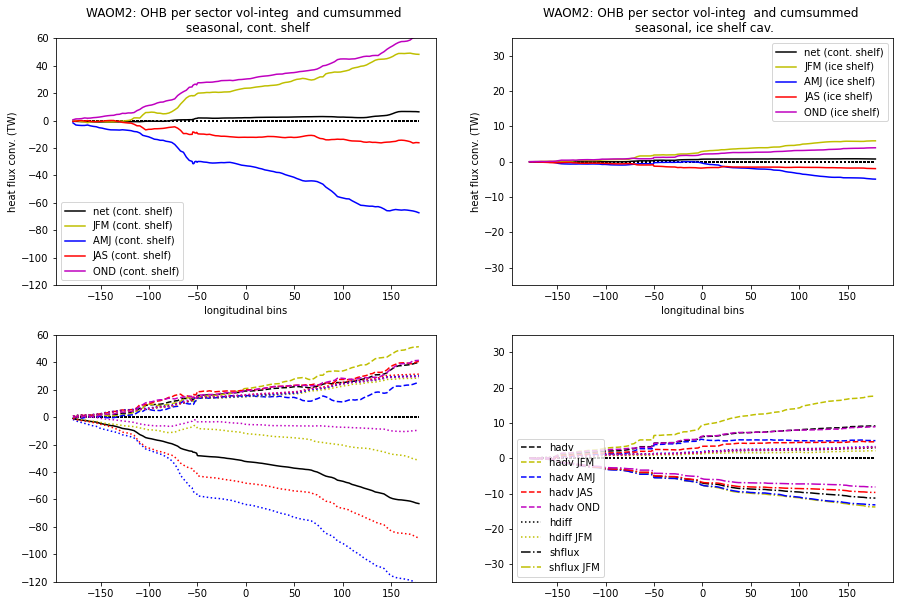

In [49]:
fig = plt.figure(figsize=(15,10))

# Original WAOM2
ax1 = fig.add_subplot(221)# projection=proj)
ax1.plot(lon_bins,(w2_net)*0,':k')
ax1.plot(lon_bins,(w2_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('heat flux conv. (TW)')
ax1.set_title('WAOM2: OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-120,60)

ax2 = fig.add_subplot(223)# projection=proj)
ax2.plot(lon_bins,(w2_net)*0,':k')
ax2.plot(lon_bins,(w2_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.plot(lon_bins,(w2_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax2.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax2.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax2.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax2.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax2.plot(lon_bins,(w2_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax2.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax2.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax2.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax2.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
# ax2.legend()
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2.set_ylim(-120,60)

ax3 = fig.add_subplot(222)# projection=proj)
ax3.plot(lon_bins,(w2_net)*0,':k')
ax3.plot(lon_bins,(w2_net_is).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('WAOM2: OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-35,35)

ax4 = fig.add_subplot(224)# projection=proj)
ax4.plot(lon_bins,(w2_net)*0,':k')
ax4.plot(lon_bins,(w2_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax4.plot(lon_bins,(w2_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
ax4.plot(lon_bins,(w2_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)

name_fig='waom2_lonbin_regional_OHBcumsum_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')


The plots above and their comparison show us that across model horiz resolution, the warming from horiz diffusion decreases with higher resolution, while the warming from horiz advection increases with higher resolution. This is specially evident in East Antarctica. Also west ant. has clear warming signal (seem as positve sloped curves in the cumsum lines in figures above).

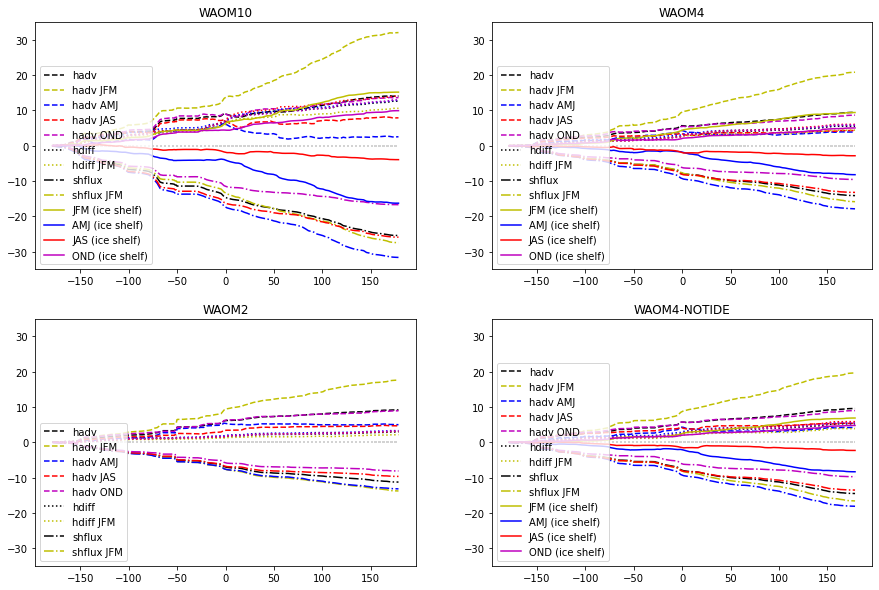

In [50]:
# final seasonal plot: all processes+net cumsum into a sigle subplot (4 subplots, 1each expt)

fig = plt.figure(figsize=(15,10))

# Original WAOM10
ax4 = fig.add_subplot(221)# projection=proj)
ax4.plot(lon_bins,(net)*0,':',color='lightgray')
# hadv
ax4.plot(lon_bins,(hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
# hdiff
ax4.plot(lon_bins,(hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
# sfc flx
ax4.plot(lon_bins,(vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
#net
ax4.plot(lon_bins,(net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-y',label='JFM (ice shelf)')
ax4.plot(lon_bins,(net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-b',label='AMJ (ice shelf)')
ax4.plot(lon_bins,(net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-r',label='JAS (ice shelf)')
ax4.plot(lon_bins,(net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-m',label='OND (ice shelf)')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)
ax4.set_title('WAOM10')

# Original WAOM4
ax4 = fig.add_subplot(222)# projection=proj)
ax4.plot(lon_bins,(net)*0,':',color='lightgray')
# hadv
ax4.plot(lon_bins,(w4_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w4_hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
# hdiff
ax4.plot(lon_bins,(w4_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w4_hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
# sfc flx
ax4.plot(lon_bins,(w4_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w4_vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
#net
ax4.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-y',label='JFM (ice shelf)')
ax4.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-b',label='AMJ (ice shelf)')
ax4.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-r',label='JAS (ice shelf)')
ax4.plot(lon_bins,(w4_net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-m',label='OND (ice shelf)')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)
ax4.set_title('WAOM4')

# Original WAOM2
ax4 = fig.add_subplot(223)# projection=proj)
ax4.plot(lon_bins,(net)*0,':',color='lightgray')
# hadv
ax4.plot(lon_bins,(w2_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w2_hadv_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
# hdiff
ax4.plot(lon_bins,(w2_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w2_hdiff_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
# sfc flx
ax4.plot(lon_bins,(w2_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w2_vdiff_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
#net
# ax4.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'-y',label='JFM (ice shelf)')
# ax4.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'-b',label='AMJ (ice shelf)')
# ax4.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'-r',label='JAS (ice shelf)')
# ax4.plot(lon_bins,(w2_net_is).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'-m',label='OND (ice shelf)')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)
ax4.set_title('WAOM2')

# Original WAOM4
ax4 = fig.add_subplot(224)# projection=proj)
ax4.plot(lon_bins,(net)*0,':',color='lightgray')
# hadv
ax4.plot(lon_bins,(w4nt_hadv_is).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(w4nt_hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
# hdiff
ax4.plot(lon_bins,(w4nt_hdiff_is).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b')#,label='hdiff AMJ')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r')#,label='hdiff JAS')
ax4.plot(lon_bins,(w4nt_hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m')#,label='hdiff OND')
# sfc flx
ax4.plot(lon_bins,(w4nt_vdiff_is).mean('ocean_time').cumsum()*1e-12,'-.k',label='shflux')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-.y',label='shflux JFM')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-.b')#,label='shflux AMJ')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-.r')#,label='shflux JAS')
ax4.plot(lon_bins,(w4nt_vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-.m')#,label='shflux OND')
#net
ax4.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'-y',label='JFM (ice shelf)')
ax4.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'-b',label='AMJ (ice shelf)')
ax4.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'-r',label='JAS (ice shelf)')
ax4.plot(lon_bins,(w4nt_net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'-m',label='OND (ice shelf)')
ax4.legend(loc='lower left')
ax4.set_ylim(-35,35)
ax4.set_title('WAOM4-NOTIDE')

name_fig='waom10x4x4NTx2_lonbin_regional_OHBcumsum_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

#### plot to check matching with whole Antarctica OHB figures:

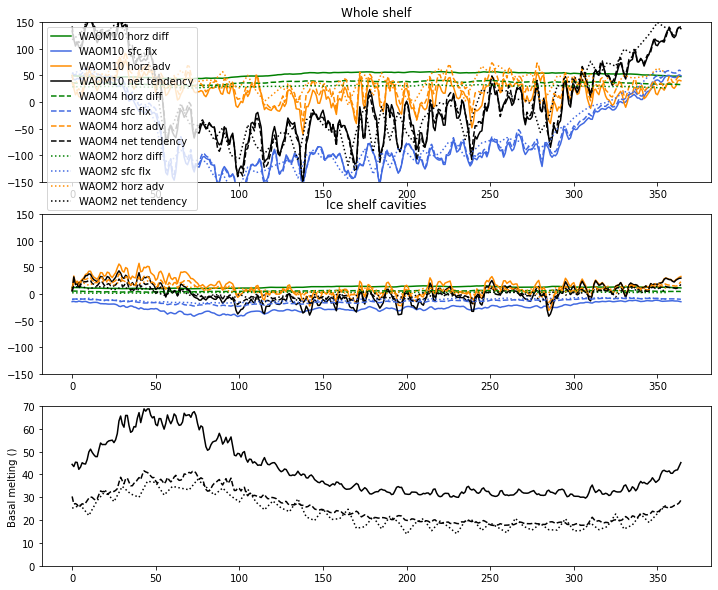

In [51]:
# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf')
ax1.set_ylim(-150,150)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities')
ax2.set_ylim(-150,150)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)


name_fig='waom10x4x2_lonbin_circumpolar-integ_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

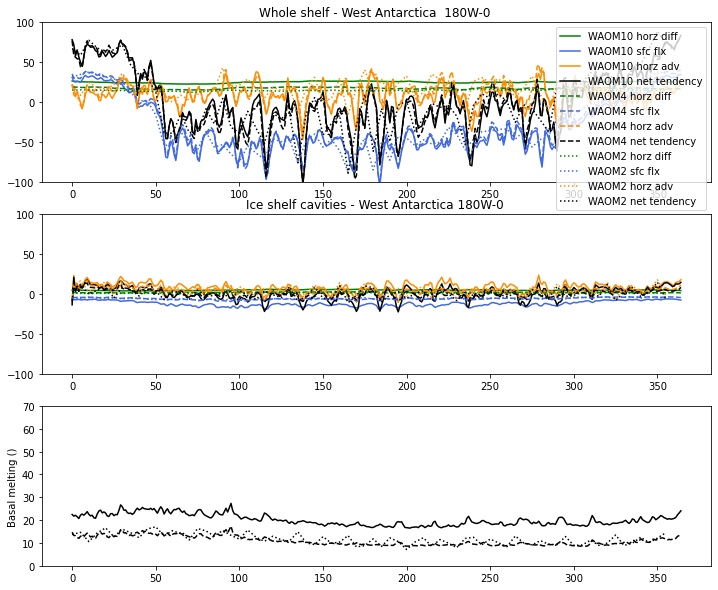

In [52]:
## same as above but splitting in West and East Antarctica:

# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf - West Antarctica  180W-0 ')
ax1.set_ylim(-100,100)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.isel(lon_bins=slice(0,60)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities - West Antarctica 180W-0 ')
ax2.set_ylim(-100,100)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.isel(lon_bins=slice(0,60)).sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.isel(lon_bins=slice(0,60)).sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.isel(lon_bins=slice(0,60)).sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)

name_fig='waom10x4x2_lonbin_180W-0-integ_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

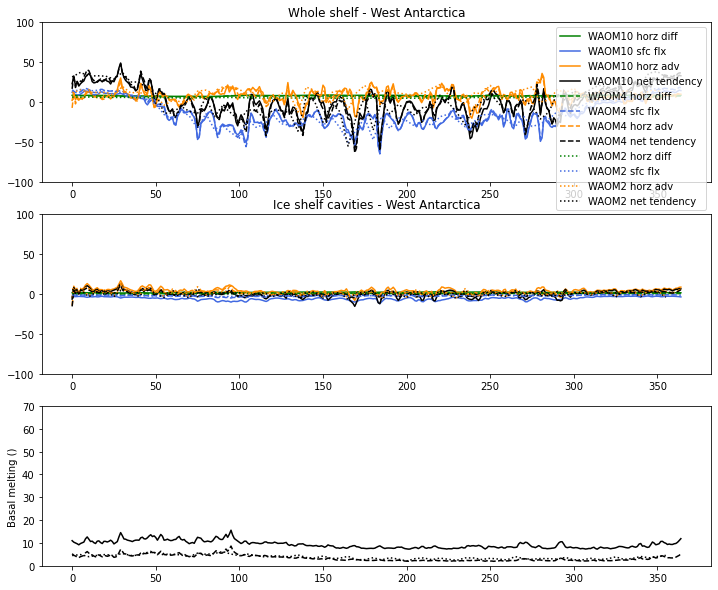

In [53]:
## same as above but splitting in West and East Antarctica:

# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf - West Antarctica')
ax1.set_ylim(-100,100)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.isel(lon_bins=slice(18,38)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities - West Antarctica')
ax2.set_ylim(-100,100)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.isel(lon_bins=slice(18,38)).sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.isel(lon_bins=slice(18,38)).sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.isel(lon_bins=slice(18,38)).sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)


name_fig='waom10x4x2_lonbin_WestAnt_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

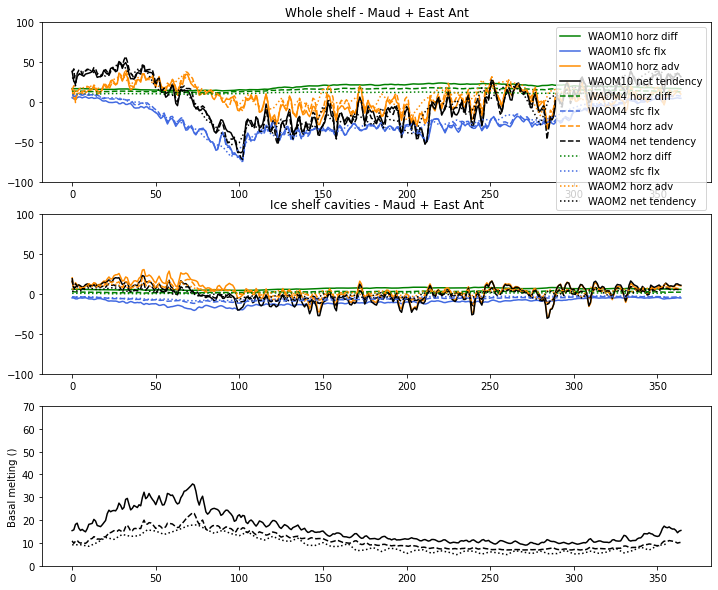

In [54]:
## same as above but splitting in West and East Antarctica:

# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf - Maud + East Ant')
ax1.set_ylim(-100,100)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.isel(lon_bins=slice(55,105)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities - Maud + East Ant')
ax2.set_ylim(-100,100)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.isel(lon_bins=slice(55,105)).sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.isel(lon_bins=slice(55,105)).sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.isel(lon_bins=slice(55,105)).sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)


name_fig='waom10x4x2_lonbin_Maud-EastAnt_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

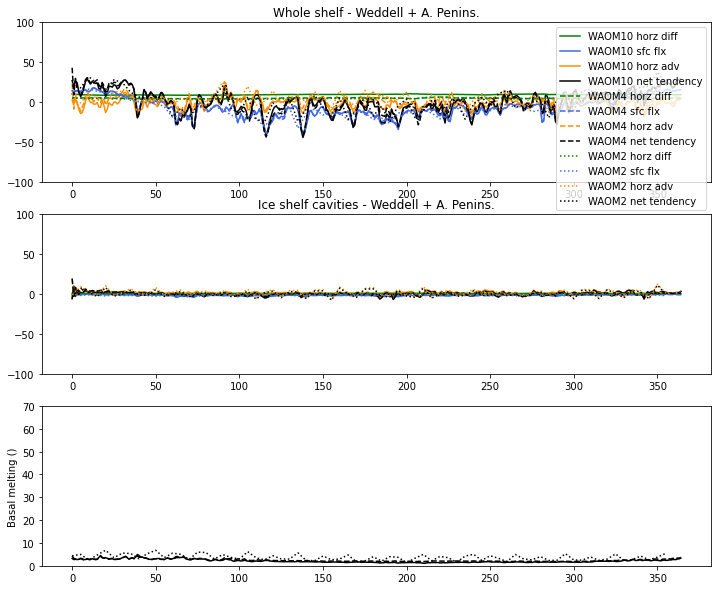

In [55]:
## Weddell + P.A.:
## same as above but splitting in West and East Antarctica:

# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf - Weddell + A. Penins.')
ax1.set_ylim(-100,100)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.isel(lon_bins=slice(38,60)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities - Weddell + A. Penins.')
ax2.set_ylim(-100,100)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.isel(lon_bins=slice(38,60)).sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.isel(lon_bins=slice(38,60)).sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.isel(lon_bins=slice(38,60)).sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)

name_fig='waom10x4x2_lonbin_Weddell-AP_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

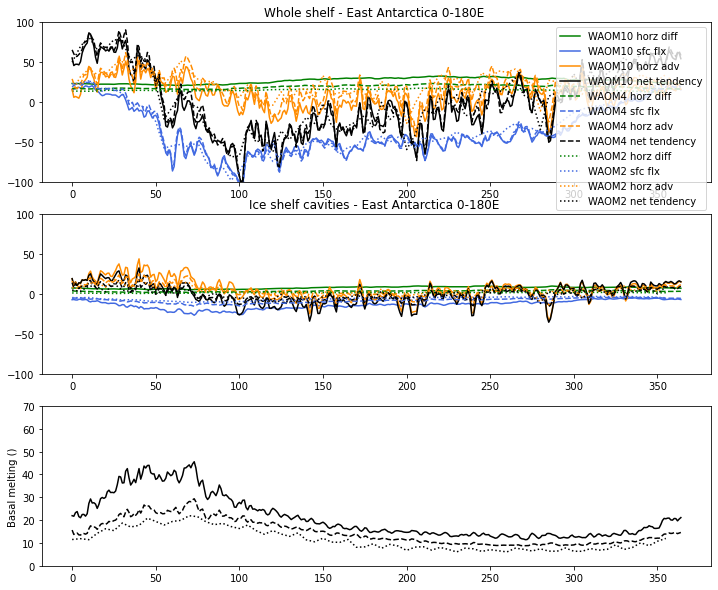

In [56]:
## same as above but splitting in West and East Antarctica:

# now get the last values (=circum-Antarctic integrated value) and plot over time to match with OHB figures:

fig = plt.figure(figsize=(12,10))
ax1 = fig.add_subplot(3,1,1, frameon=True)

ax1.plot(np.arange(0,365,1),hdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(np.arange(0,365,1),vdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(np.arange(0,365,1),hadv.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax1.plot(np.arange(0,365,1),net.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax1.plot(np.arange(0,360,5),w2_hdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(np.arange(0,360,5),w2_vdiff.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(np.arange(0,360,5),w2_hadv.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.plot(np.arange(0,360,5),w2_net.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax1.legend(loc='best')
ax1.set_title('Whole shelf - East Antarctica 0-180E ')
ax1.set_ylim(-100,100)

ax2 = fig.add_subplot(3,1,2, frameon=True)

ax2.plot(np.arange(0,365,1),hdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='green',label='WAOM10 horz diff')
ax2.plot(np.arange(0,365,1),vdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax2.plot(np.arange(0,365,1),hadv_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='darkorange',label='WAOM10 horz adv')
ax2.plot(np.arange(0,365,1),net_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,color='k',label='WAOM10 net tendency')

ax2.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax2.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax2.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')
ax2.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,'--',color='k',label='WAOM4 net tendency')

ax2.plot(np.arange(0,360,5),w2_hdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='green',label='WAOM2 horz diff')
ax2.plot(np.arange(0,360,5),w2_vdiff_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax2.plot(np.arange(0,360,5),w2_hadv_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax2.plot(np.arange(0,360,5),w2_net_is.isel(lon_bins=slice(60,127)).sum('lon_bins')*1e-12,':',color='k',label='WAOM2 net tendency')
ax2.set_title('Ice shelf cavities - East Antarctica 0-180E ')
ax2.set_ylim(-100,100)

ax3 = fig.add_subplot(3,1,3, frameon=True)

ax3.plot(np.arange(0,365,1),np.divide(bmelt.isel(lon_bins=slice(60,127)).sum('lon_bins'),area_sum.values)*1000,color='k',label='WAOM10')

ax3.plot(np.arange(0,365,1),np.divide(w4_bmelt.isel(lon_bins=slice(60,127)).sum('lon_bins'),area_sum.values)*1000,'--',color='k',label='WAOM4 ')

ax3.plot(np.arange(0,360,5),np.divide(w2_bmelt.isel(lon_bins=slice(60,127)).sum('lon_bins'),area_sum.values)*1000,':',color='k',label='WAOM2')
ax3.set_ylabel('Basal melting ()')
ax3.set_ylim(0,70)

name_fig='waom10x4x2_lonbin_0-180E-integ_OHB_daily.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight', facecolor='white')

In [57]:
# print integrated values:

print('Whole shelf')

print('--- WAOM10 ---')
print('hdiff = ',hdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',vdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',hadv.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',net.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM4 ---')
print('hdiff = ',w4_hdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w4_vdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w4_hadv.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w4_net.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM2 ---')
print('hdiff = ',w2_hdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w2_vdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w2_hadv.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w2_net.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM4-NOTIDE ---')
print('hdiff = ',w4nt_hdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w4nt_vdiff.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w4nt_hadv.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w4nt_net.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')




Whole shelf
--- WAOM10 ---
hdiff =  51.80647422559538 TW
vdiff =  -68.32516258500748 TW
hadv =  17.642937007074256 TW
net =  1.1242486532436968 TW
--- WAOM4 ---
hdiff =  36.60238149215827 TW
vdiff =  -63.947535377187656 TW
hadv =  30.4556216023286 TW
net =  3.1104677106239698 TW
--- WAOM2 ---
hdiff =  29.753970655778623 TW
vdiff =  -63.03484166270508 TW
hadv =  39.642373429633096 TW
net =  6.361502425415702 TW
--- WAOM4-NOTIDE ---
hdiff =  37.63662190281218 TW
vdiff =  -63.54135715743211 TW
hadv =  27.56651631082525 TW
net =  1.6617810512753608 TW


In [58]:
# print integrated values:

print('Ice shelf cavities')

print('--- WAOM10 ---')
print('hdiff = ',hdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',vdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',hadv_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',net_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM4 ---')
print('hdiff = ',w4_hdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w4_vdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w4_hadv_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w4_net_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM2 ---')
print('hdiff = ',w2_hdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w2_vdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w2_hadv_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w2_net_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')

print('--- WAOM4-NOTIDE ---')
print('hdiff = ',w4nt_hdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('vdiff = ',w4nt_vdiff_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('hadv = ',w4nt_hadv_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')
print('net = ',w4nt_net_is.mean('ocean_time').sum('lon_bins').values*1e-12,'TW')




Ice shelf cavities
--- WAOM10 ---
hdiff =  12.613498515850429 TW
vdiff =  -25.433631496421764 TW
hadv =  14.086887990268014 TW
net =  1.2667550101292882 TW
--- WAOM4 ---
hdiff =  5.5372696308345235 TW
vdiff =  -14.125846003792288 TW
hadv =  9.468714716694903 TW
net =  0.8801383466895253 TW
--- WAOM2 ---
hdiff =  2.9071542840713827 TW
vdiff =  -11.282074727788574 TW
hadv =  9.15496260702683 TW
net =  0.7800421615212333 TW
--- WAOM4-NOTIDE ---
hdiff =  5.2013902591919114 TW
vdiff =  -14.521254342652496 TW
hadv =  9.574456305885143 TW
net =  0.2545922230200381 TW


#### Plot figures with all expts:

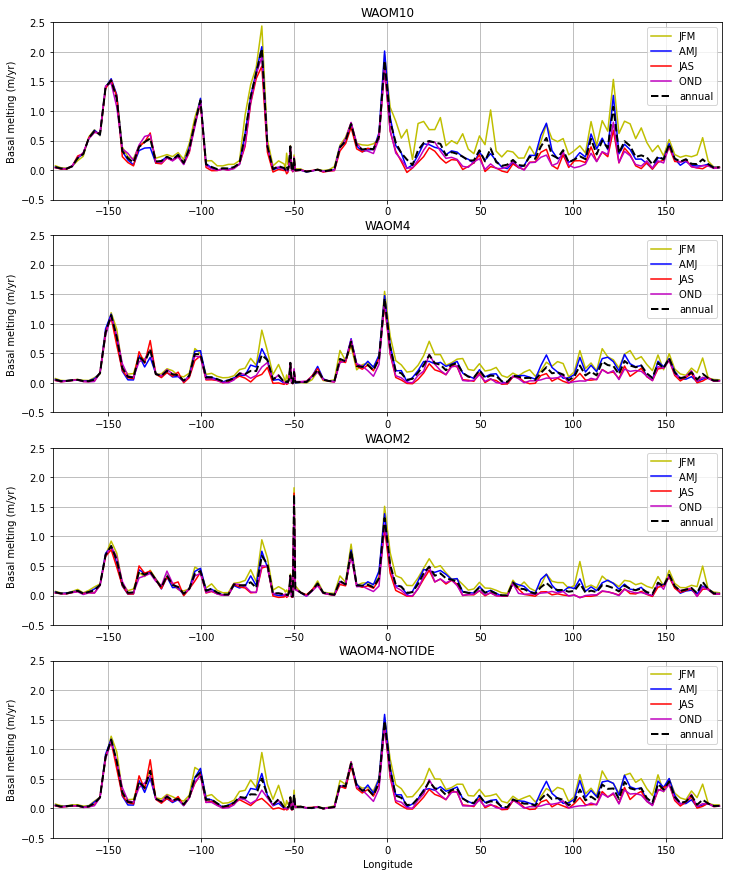

In [59]:
# seasonality basal melting:


fig = plt.figure(figsize=(12,15))
ax2 = fig.add_subplot(4,1,1, frameon=True)
# seasonal
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt.isel(ocean_time=slice(s1i,s1e)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt.isel(ocean_time=slice(s2i,s2e)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt.isel(ocean_time=slice(s3i,s3e)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt.isel(ocean_time=slice(s4i,s4e)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

ax2.legend()
# ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
ax2.set_title('WAOM10')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.5,2.5)

ax2 = fig.add_subplot(4,1,2, frameon=True)
# seasonal
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s1i,s1e)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s2i,s2e)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s3i,s3e)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s4i,s4e)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

ax2.legend()
# ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
ax2.set_title('WAOM4')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.5,2.5)

ax2 = fig.add_subplot(4,1,3, frameon=True)
# seasonal
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt.isel(ocean_time=slice(s1i_5d,s1e_5d)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt.isel(ocean_time=slice(s2i_5d,s2e_5d)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt.isel(ocean_time=slice(s3i_5d,s3e_5d)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt.isel(ocean_time=slice(s4i_5d,s4e_5d)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

ax2.legend()
# ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
ax2.set_title('WAOM2')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.5,2.5)

ax2 = fig.add_subplot(4,1,4, frameon=True)
# seasonal
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt.isel(ocean_time=slice(s1i,s1e)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt.isel(ocean_time=slice(s2i,s2e)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt.isel(ocean_time=slice(s3i,s3e)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt.isel(ocean_time=slice(s4i,s4e)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

ax2.legend()
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
ax2.set_title('WAOM4-NOTIDE')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.5,2.5)


name_fig='waom10x4x4NTx2_lonbin_regional_Basal_melt_seasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')


Seasonality in the basal melting is larger at East Antarctica + Maud region. Most places have higher melting in summer (JFM) and lower in winter (JAS/OND)
- one exception is at 130W (Getz?) region, where melting is lower in AMJ.

ValueError: The number of FixedLocator locations (43), usually from a call to set_ticks, does not match the number of ticklabels (127).

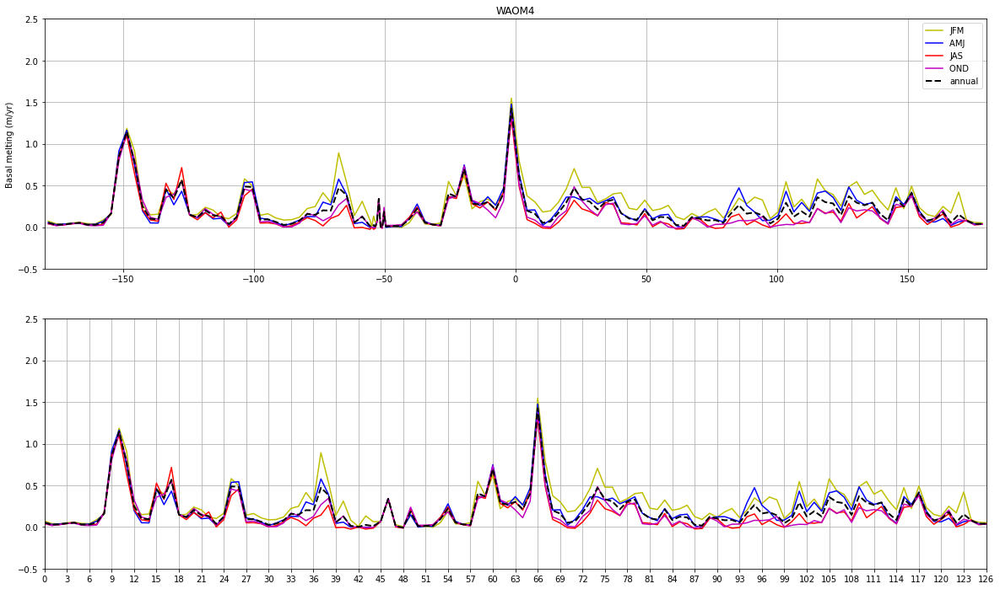

In [166]:
fig = plt.figure(figsize=(20,12))
ax2 = fig.add_subplot(2,1,1, frameon=True)
# seasonal
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s1i,s1e)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s2i,s2e)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s3i,s3e)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s4i,s4e)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

ax2.legend()
# ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
ax2.set_title('WAOM4')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.5,2.5)


ax2 = fig.add_subplot(2,1,2, frameon=True)
# seasonal
ax2.plot(np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s1i,s1e)), axis=0),area_sum.values)*1000,'-y',label='JFM ')
ax2.plot(np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s2i,s2e)), axis=0),area_sum.values)*1000,'-b',label='AMJ ')
ax2.plot(np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s3i,s3e)), axis=0),area_sum.values)*1000,'-r',label='JAS ')
ax2.plot(np.divide(np.nanmean(w4_bmelt.isel(ocean_time=slice(s4i,s4e)), axis=0),area_sum.values)*1000,'-m',label='OND ')
ax2.plot(np.divide(np.nanmean(w4_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)
ax2.grid('on')
ax2.set_xlim(0,43,2)
ax2.set_ylim(-.5,2.5)
locs, labels = ax2.set_xticks(np.arange(0, 127, step=3),np.arange(127))

(-3.0, 3.0)

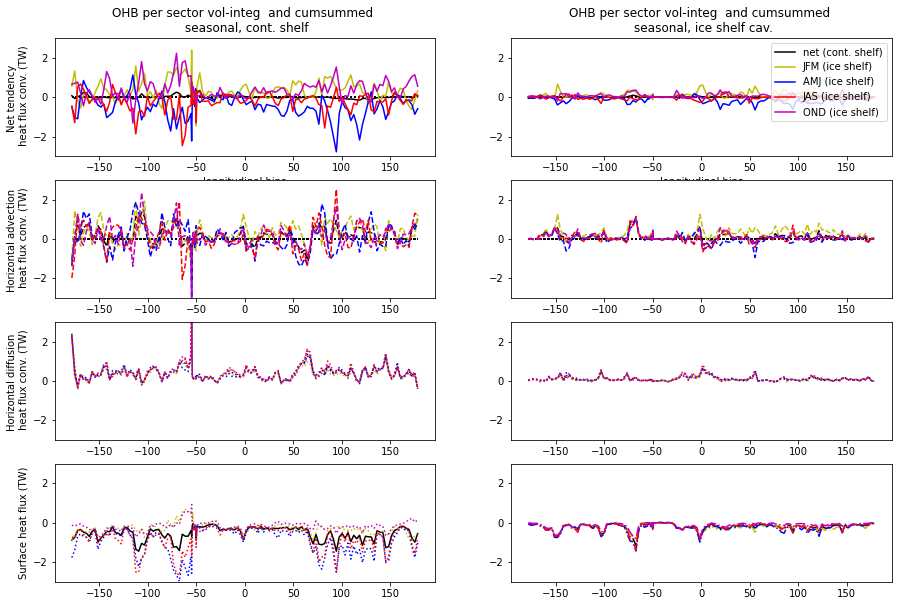

In [60]:
fig = plt.figure(figsize=(15,10))

# Original WAOM10
ax1 = fig.add_subplot(421)# projection=proj)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (cont. shelf)')
# ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (cont. shelf)')
# ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Net tendency \n heat flux conv. (TW)')
ax1.set_title('OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-3,3)

ax2 = fig.add_subplot(423)# projection=proj)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
# ax2.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--k',label='hadv')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
ax2.set_ylabel('Horizontal advection \n heat flux conv. (TW)')
ax2.set_ylim(-3,3)

ax2b = fig.add_subplot(425)# projection=proj)
ax2b.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,':k',label='hdiff')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='hdiff AMJ')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='hdiff JAS')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='hdiff OND')
# ax2b.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,':k',label='hdiff')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='hdiff AMJ')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='hdiff JAS')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='hdiff OND')
ax2b.set_ylabel('Horizontal diffusion \n heat flux conv. (TW)')
ax2b.set_ylim(-3,3)

ax2c = fig.add_subplot(427)# projection=proj)
ax2c.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'-k',label='shflux')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='shflux JFM')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='shflux AMJ')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='shflux JAS')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='shflux OND')
# ax2c.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'-k',label='shflux')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='shflux JFM')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='shflux AMJ')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='shflux JAS')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='shflux OND')
ax2c.set_ylabel('Surface heat flux (TW)')
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2c.set_ylim(-3,3)

ax3 = fig.add_subplot(422)# projection=proj)
ax3.plot(lon_bins,(net)*0,':k')
ax3.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
# ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-3,3)

ax4 = fig.add_subplot(424)# projection=proj)
ax4.plot(lon_bins,(net)*0,':k')
ax4.plot(lon_bins,(hadv_is).mean('ocean_time')*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
ax4.set_ylim(-3,3)

ax4b = fig.add_subplot(426)# projection=proj)
ax4b.plot(lon_bins,(hdiff_is).mean('ocean_time')*1e-12,':k',label='hdiff')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b')#,label='hdiff AMJ')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r')#,label='hdiff JAS')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m')#,label='hdiff OND')
ax4b.set_ylim(-3,3)

ax4c = fig.add_subplot(428)# projection=proj)
ax4c.plot(lon_bins,(vdiff_is).mean('ocean_time')*1e-12,'-.k',label='shflux')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'-.y',label='shflux JFM')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'-.b',label='shflux AMJ')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'-.r',label='shflux JAS')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'-.m',label='shflux OND')
# ax4c.legend(loc='lower left')
ax4c.set_ylim(-3,3)


(-3.0, 3.0)

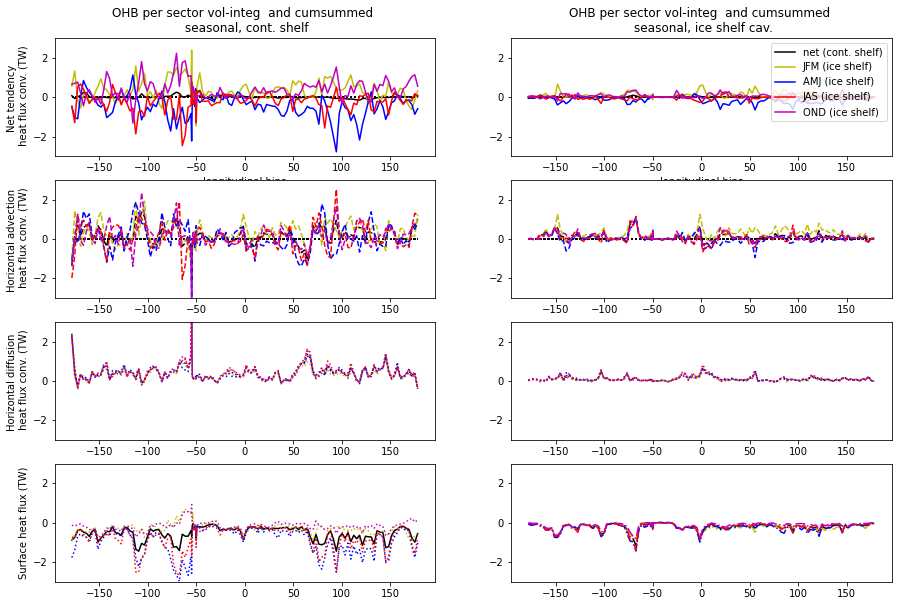

In [61]:
fig = plt.figure(figsize=(15,10))

# Original WAOM10
ax1 = fig.add_subplot(421)# projection=proj)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (cont. shelf)')
# ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (cont. shelf)')
# ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (cont. shelf)')
# ax1.legend()
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Net tendency \n heat flux conv. (TW)')
ax1.set_title('OHB per sector vol-integ  and cumsummed \n seasonal, cont. shelf')
ax1.set_ylim(-3,3)

ax2 = fig.add_subplot(423)# projection=proj)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
# ax2.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'--k',label='hadv')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
# ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
ax2.set_ylabel('Horizontal advection \n heat flux conv. (TW)')
ax2.set_ylim(-3,3)

ax2b = fig.add_subplot(425)# projection=proj)
ax2b.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,':k',label='hdiff')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='hdiff AMJ')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='hdiff JAS')
ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='hdiff OND')
# ax2b.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,':k',label='hdiff')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='hdiff AMJ')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='hdiff JAS')
# ax2b.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='hdiff OND')
ax2b.set_ylabel('Horizontal diffusion \n heat flux conv. (TW)')
ax2b.set_ylim(-3,3)

ax2c = fig.add_subplot(427)# projection=proj)
ax2c.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'-k',label='shflux')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='shflux JFM')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='shflux AMJ')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='shflux JAS')
ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='shflux OND')
# ax2c.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'-k',label='shflux')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='shflux JFM')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b',label='shflux AMJ')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r',label='shflux JAS')
# ax2c.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m',label='shflux OND')
ax2c.set_ylabel('Surface heat flux (TW)')
# ax2.set_title('OHB per sector vol-integ  and cumsummed \n annual + seasonal')
ax2c.set_ylim(-3,3)

ax3 = fig.add_subplot(422)# projection=proj)
ax3.plot(lon_bins,(net)*0,':k')
ax3.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,'-k',label='net (cont. shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'y',label='JFM (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'b',label='AMJ (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'r',label='JAS (ice shelf)')
ax3.plot(lon_bins,(net_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'m',label='OND (ice shelf)')
ax3.legend()
ax3.set_xlabel('longitudinal bins')
# ax3.set_ylabel('heat flux conv. (TW)')
ax3.set_title('OHB per sector vol-integ  and cumsummed \n seasonal, ice shelf cav.')
ax3.set_ylim(-3,3)

ax4 = fig.add_subplot(424)# projection=proj)
ax4.plot(lon_bins,(net)*0,':k')
ax4.plot(lon_bins,(hadv_is).mean('ocean_time')*1e-12,'--k',label='hadv')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'--y',label='hadv JFM')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'--b',label='hadv AMJ')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'--r',label='hadv JAS')
ax4.plot(lon_bins,(hadv_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'--m',label='hadv OND')
ax4.set_ylim(-3,3)

ax4b = fig.add_subplot(426)# projection=proj)
ax4b.plot(lon_bins,(hdiff_is).mean('ocean_time')*1e-12,':k',label='hdiff')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,':y',label='hdiff JFM')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,':b')#,label='hdiff AMJ')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,':r')#,label='hdiff JAS')
ax4b.plot(lon_bins,(hdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,':m')#,label='hdiff OND')
ax4b.set_ylim(-3,3)

ax4c = fig.add_subplot(428)# projection=proj)
ax4c.plot(lon_bins,(vdiff_is).mean('ocean_time')*1e-12,'-.k',label='shflux')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time')*1e-12,'-.y',label='shflux JFM')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time')*1e-12,'-.b',label='shflux AMJ')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time')*1e-12,'-.r',label='shflux JAS')
ax4c.plot(lon_bins,(vdiff_is).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time')*1e-12,'-.m',label='shflux OND')
# ax4c.legend(loc='lower left')
ax4c.set_ylim(-3,3)


WAOM10 Seasonality in the ocean processes:
- the heat tendency is usually a balance between warming (OND-JFM) and cooling (AMJ-JAS). Both cont shelf & IScavit
- SHF has lots of seasonality at the shelf, but almost none inside the IScavit (always cooling due to meltwater)
- Horz diff always warm, generally peaks where SHF peaks (sfc induces stronger cross-shelf grad?)
- Horiz advection has lots of variability in both cont shelf and IScavit
  - dominates seasonal variability in the IScavit
  - w/ likely important contrib in the cont shelf too
    - seems imporant b/w (~) 50W:50E (no coastal polynyas)
    - while SHF more imokrtant at West/East Antarctica (where has large polynyas)
- How these compare with 4/2km?
  - & without tides?

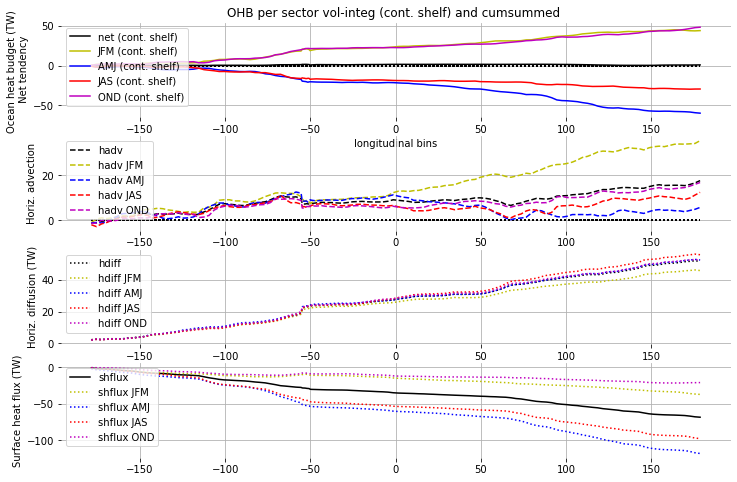

In [62]:
fig = plt.figure(figsize=(12,8))

# Original WAOM10
ax1 = fig.add_subplot(411, frameon=False)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(net).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend(loc='upper left')
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW) \n Net tendency')
ax1.set_title('OHB per sector vol-integ (cont. shelf) and cumsummed ')
ax1.grid('on')

ax2 = fig.add_subplot(412, frameon=False)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(hadv).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.legend(loc='upper left')
ax2.grid('on')
ax2.set_ylabel('Horiz. advection')

ax3 = fig.add_subplot(413, frameon=False)
ax3.plot(lon_bins,(hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax3.plot(lon_bins,(hdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax3.plot(lon_bins,(hdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax3.plot(lon_bins,(hdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax3.plot(lon_bins,(hdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax3.legend(loc='upper left')
ax3.grid('on')
ax3.set_ylabel('Horiz. diffusion (TW)')

ax4 = fig.add_subplot(414, frameon=False)
ax4.plot(lon_bins,(vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax4.plot(lon_bins,(vdiff).isel(ocean_time=slice(s1i,s1e)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax4.plot(lon_bins,(vdiff).isel(ocean_time=slice(s2i,s2e)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax4.plot(lon_bins,(vdiff).isel(ocean_time=slice(s3i,s3e)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax4.plot(lon_bins,(vdiff).isel(ocean_time=slice(s4i,s4e)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
ax4.legend(loc='upper left')
ax4.grid('on')
ax4.set_ylabel('Surface heat flux (TW)')


name_fig='waom10_lonbin_regional_OHBseasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')


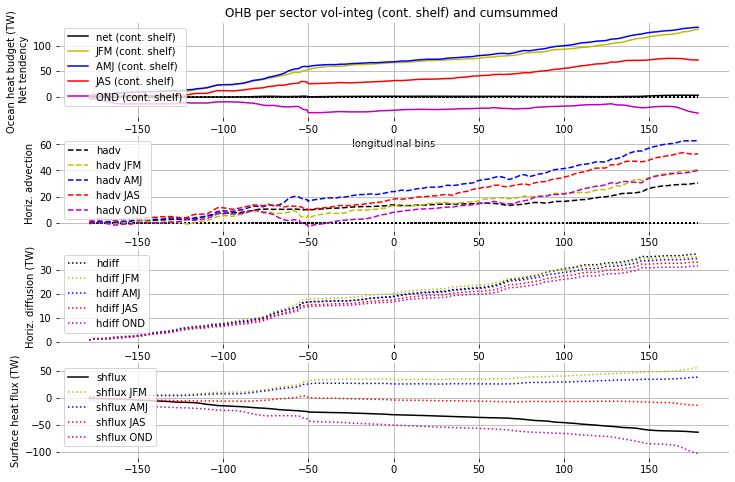

In [63]:
fig = plt.figure(figsize=(12,8))

# Original WAOM4
ax1 = fig.add_subplot(411, frameon=False)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(w4_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w4_net).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend(loc='upper left')
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW) \n Net tendency')
ax1.set_title('OHB per sector vol-integ (cont. shelf) and cumsummed ')
ax1.grid('on')

ax2 = fig.add_subplot(412, frameon=False)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(w4_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w4_hadv).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.legend(loc='upper left')
ax2.grid('on')
ax2.set_ylabel('Horiz. advection')

ax3 = fig.add_subplot(413, frameon=False)
ax3.plot(lon_bins,(w4_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax3.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax3.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax3.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax3.plot(lon_bins,(w4_hdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax3.legend(loc='upper left')
ax3.grid('on')
ax3.set_ylabel('Horiz. diffusion (TW)')

ax4 = fig.add_subplot(414, frameon=False)
ax4.plot(lon_bins,(w4_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax4.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax4.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax4.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax4.plot(lon_bins,(w4_vdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
ax4.legend(loc='upper left')
ax4.grid('on')
ax4.set_ylabel('Surface heat flux (TW)')


name_fig='waom4_lonbin_regional_OHBseasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')
plt.show()

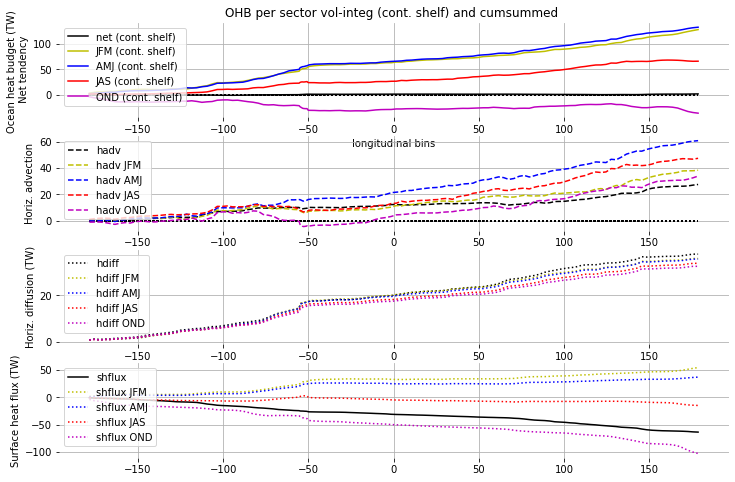

In [64]:
fig = plt.figure(figsize=(12,8))

# Original WAOM4-NT
ax1 = fig.add_subplot(411, frameon=False)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(w4nt_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w4nt_net).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend(loc='upper left')
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW) \n Net tendency')
ax1.set_title('OHB per sector vol-integ (cont. shelf) and cumsummed ')
ax1.grid('on')

ax2 = fig.add_subplot(412, frameon=False)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(w4nt_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w4nt_hadv).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.legend(loc='upper left')
ax2.grid('on')
ax2.set_ylabel('Horiz. advection')

ax3 = fig.add_subplot(413, frameon=False)
ax3.plot(lon_bins,(w4nt_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax3.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax3.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax3.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax3.plot(lon_bins,(w4nt_hdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax3.legend(loc='upper left')
ax3.grid('on')
ax3.set_ylabel('Horiz. diffusion (TW)')

ax4 = fig.add_subplot(414, frameon=False)
ax4.plot(lon_bins,(w4nt_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax4.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax4.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax4.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax4.plot(lon_bins,(w4nt_vdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
ax4.legend(loc='upper left')
ax4.grid('on')
ax4.set_ylabel('Surface heat flux (TW)')


name_fig='waom4-notides_lonbin_regional_OHBseasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')


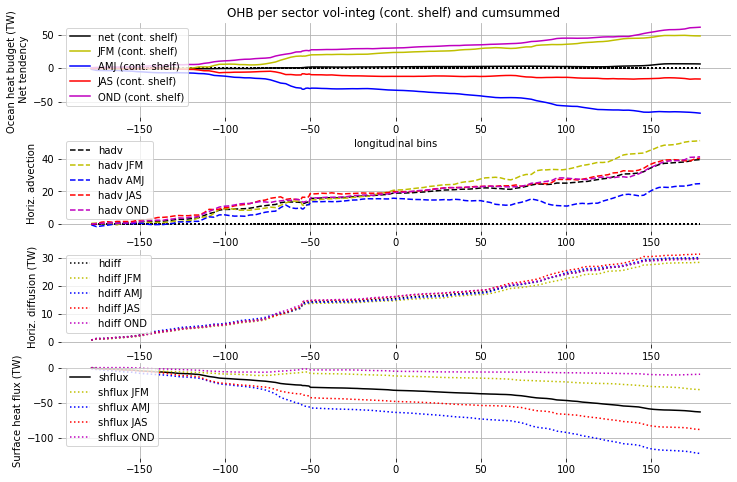

In [65]:
fig = plt.figure(figsize=(12,8))

# Original WAOM4
ax1 = fig.add_subplot(411, frameon=False)
ax1.plot(lon_bins,(net)*0,':k')
ax1.plot(lon_bins,(w2_net).mean('ocean_time').cumsum()*1e-12,'-k',label='net (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'y',label='JFM (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'b',label='AMJ (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'r',label='JAS (cont. shelf)')
ax1.plot(lon_bins,(w2_net).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'m',label='OND (cont. shelf)')
ax1.legend(loc='upper left')
ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW) \n Net tendency')
ax1.set_title('OHB per sector vol-integ (cont. shelf) and cumsummed ')
ax1.grid('on')

ax2 = fig.add_subplot(412, frameon=False)
ax2.plot(lon_bins,(net)*0,':k')
ax2.plot(lon_bins,(w2_hadv).mean('ocean_time').cumsum()*1e-12,'--k',label='hadv')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,'--y',label='hadv JFM')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,'--b',label='hadv AMJ')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,'--r',label='hadv JAS')
ax2.plot(lon_bins,(w2_hadv).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,'--m',label='hadv OND')
ax2.legend(loc='upper left')
ax2.grid('on')
ax2.set_ylabel('Horiz. advection')

ax3 = fig.add_subplot(413, frameon=False)
ax3.plot(lon_bins,(w2_hdiff).mean('ocean_time').cumsum()*1e-12,':k',label='hdiff')
ax3.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='hdiff JFM')
ax3.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='hdiff AMJ')
ax3.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='hdiff JAS')
ax3.plot(lon_bins,(w2_hdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='hdiff OND')
ax3.legend(loc='upper left')
ax3.grid('on')
ax3.set_ylabel('Horiz. diffusion (TW)')

ax4 = fig.add_subplot(414, frameon=False)
ax4.plot(lon_bins,(w2_vdiff).mean('ocean_time').cumsum()*1e-12,'-k',label='shflux')
ax4.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s1i_5d,s1e_5d)).mean('ocean_time').cumsum()*1e-12,':y',label='shflux JFM')
ax4.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s2i_5d,s2e_5d)).mean('ocean_time').cumsum()*1e-12,':b',label='shflux AMJ')
ax4.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s3i_5d,s3e_5d)).mean('ocean_time').cumsum()*1e-12,':r',label='shflux JAS')
ax4.plot(lon_bins,(w2_vdiff).isel(ocean_time=slice(s4i_5d,s4e_5d)).mean('ocean_time').cumsum()*1e-12,':m',label='shflux OND')
ax4.legend(loc='upper left')
ax4.grid('on')
ax4.set_ylabel('Surface heat flux (TW)')


name_fig='waom2_lonbin_regional_OHBseasonal.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')
plt.show()

#### Final figs - meeting 05-Aug-2024

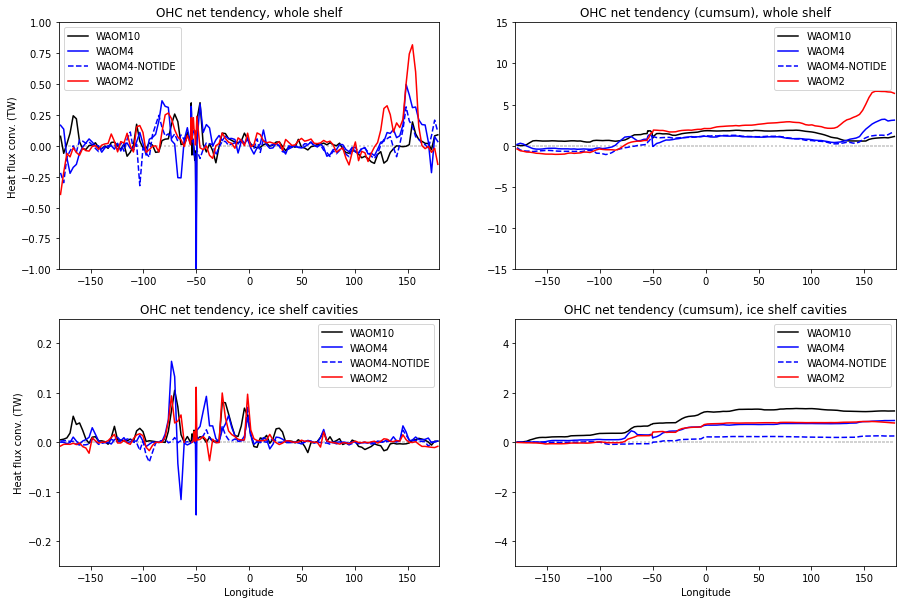

In [66]:
# 1 - OHC drift across expts and comparison whole shelf x IScavities:

fig = plt.figure(figsize=(15,10))

# Original WAOM10
ax1 = fig.add_subplot(222)# projection=proj)
ax1.plot(lon_bins,(net)*0,':',color='lightgray')
ax1.plot(lon_bins,(net).mean('ocean_time').cumsum()*1e-12,'-k',label='WAOM10')
ax1.plot(lon_bins,(w4_net).mean('ocean_time').cumsum()*1e-12,'-b',label='WAOM4')
ax1.plot(lon_bins,(w4nt_net).mean('ocean_time').cumsum()*1e-12,'--b',label='WAOM4-NOTIDE')
ax1.plot(lon_bins,(w2_net).mean('ocean_time').cumsum()*1e-12,'-r',label='WAOM2')
ax1.legend()
# ax1.set_xlabel('Longitude')
# ax1.set_ylabel('Heat flux conv. (TW)')
ax1.set_title('OHC net tendency (cumsum), whole shelf')
ax1.set_ylim(-15,15)
ax1.set_xlim(-180,180)

ax1 = fig.add_subplot(221)# projection=proj)
ax1.plot(lon_bins,(net)*0,':',color='lightgray')
ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-k',label='WAOM10')
ax1.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,'-b',label='WAOM4')
ax1.plot(lon_bins,(w4nt_net).mean('ocean_time')*1e-12,'--b',label='WAOM4-NOTIDE')
ax1.plot(lon_bins,(w2_net).mean('ocean_time')*1e-12,'-r',label='WAOM2')
ax1.legend()
# ax1.set_xlabel('Longitude')
ax1.set_ylabel('Heat flux conv. (TW)')
ax1.set_title('OHC net tendency, whole shelf')
ax1.set_ylim(-1,1)
ax1.set_xlim(-180,180)

ax1 = fig.add_subplot(224)# projection=proj)
ax1.plot(lon_bins,(net)*0,':',color='lightgray')
ax1.plot(lon_bins,(net_is).mean('ocean_time').cumsum()*1e-12,'-k',label='WAOM10')
ax1.plot(lon_bins,(w4_net_is).mean('ocean_time').cumsum()*1e-12,'-b',label='WAOM4')
ax1.plot(lon_bins,(w4nt_net_is).mean('ocean_time').cumsum()*1e-12,'--b',label='WAOM4-NOTIDE')
ax1.plot(lon_bins,(w2_net_is).mean('ocean_time').cumsum()*1e-12,'-r',label='WAOM2')
ax1.legend()
ax1.set_xlabel('Longitude')
# ax1.set_ylabel('Heat flux conv. (TW)')
ax1.set_title('OHC net tendency (cumsum), ice shelf cavities')
ax1.set_ylim(-5,5)
ax1.set_xlim(-180,180)

ax1 = fig.add_subplot(223)# projection=proj)
ax1.plot(lon_bins,(net)*0,':',color='lightgray')
ax1.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,'-k',label='WAOM10')
ax1.plot(lon_bins,(w4_net_is).mean('ocean_time')*1e-12,'-b',label='WAOM4')
ax1.plot(lon_bins,(w4nt_net_is).mean('ocean_time')*1e-12,'--b',label='WAOM4-NOTIDE')
ax1.plot(lon_bins,(w2_net_is).mean('ocean_time')*1e-12,'-r',label='WAOM2')
ax1.legend()
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Heat flux conv. (TW)')
ax1.set_title('OHC net tendency, ice shelf cavities')
ax1.set_ylim(-.25,.25)
ax1.set_xlim(-180,180)

name_fig='waom10x4x4NTx2_lonbin_regional_OHB_tendency_comparison.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')
# plt.show()

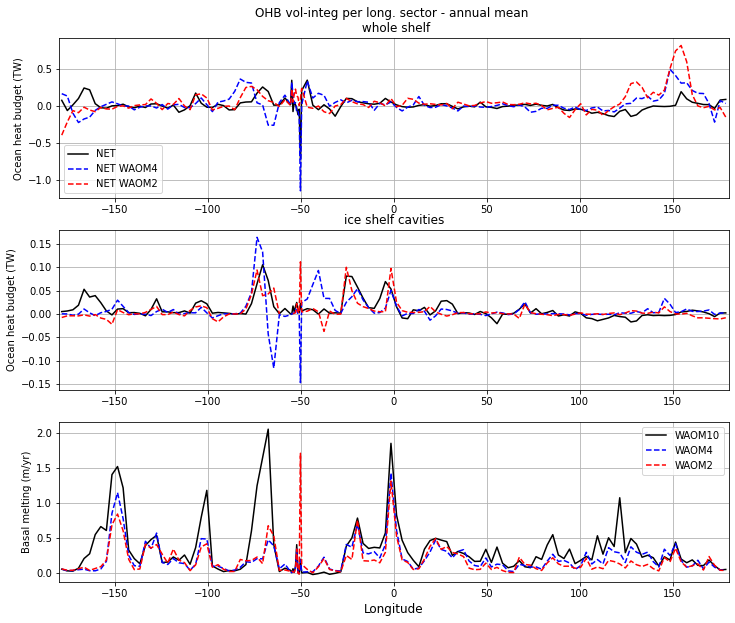

In [67]:

fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(3,1,1, frameon=True)
# ax1.plot(lon_bins,(net)*0,':k')
#--using 10km daily:
# ax1.plot(lon_bins,(vdiff).mean('ocean_time')*1e-12,'-',color='b',label='SHF')
# ax1.plot(lon_bins,(hadv).mean('ocean_time')*1e-12,'-',color='orange',label='ADV')
# ax1.plot(lon_bins,(hdiff).mean('ocean_time')*1e-12,'-',color='green',label='DIFF')
ax1.plot(lon_bins,(net).mean('ocean_time')*1e-12,'-',color='k',label='NET')
#--using 10km 5-daily:
# ax1.plot(lon_bins,(vdiff_5d).mean('ocean_time')*1e-12,'--',color='b',label='SHF WAOM10')
# ax1.plot(lon_bins,(hadv_5d).mean('ocean_time')*1e-12,'--',color='orange',label='ADV WAOM10')
# ax1.plot(lon_bins,(hdiff_5d).mean('ocean_time')*1e-12,'--',color='green',label='DIFF WAOM10')
# ax1.plot(lon_bins,(net_5d).mean('ocean_time')*1e-12,'--',color='red',label='NET WAOM10')
#--using 4km 5-daily:
# ax1.plot(lon_bins,(w4_vdiff).mean('ocean_time')*1e-12,':',color='b',label='SHF WAOM4')
# ax1.plot(lon_bins,(w4_hadv).mean('ocean_time')*1e-12,':',color='orange',label='ADV WAOM4')
# ax1.plot(lon_bins,(w4_hdiff).mean('ocean_time')*1e-12,':',color='green',label='DIFF WAOM4')
ax1.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,'--',color='b',label='NET WAOM4')
#--using 2km 5-daily:
# ax1.plot(lon_bins,(w2_vdiff).mean('ocean_time')*1e-12,'-.',color='b',label='SHF WAOM2')
# ax1.plot(lon_bins,(w2_hadv).mean('ocean_time')*1e-12,'-.',color='orange',label='ADV WAOM2')
# ax1.plot(lon_bins,(w2_hdiff).mean('ocean_time')*1e-12,'-.',color='green',label='DIFF WAOM2')
ax1.plot(lon_bins,(w2_net).mean('ocean_time')*1e-12,'--',color='r',label='NET WAOM2')
ax1.legend()
# ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW)')
ax1.set_title('OHB vol-integ per long. sector - annual mean \n whole shelf')
ax1.grid('on')
ax1.set_xlim(-180,180)

ax1 = fig.add_subplot(3,1,2, frameon=True)
# ax1.plot(lon_bins,(net_is)*0,':k')
#--using 10km daily:
# ax1.plot(lon_bins,(vdiff_is).mean('ocean_time')*1e-12,'-',color='b',label='SHF')
# ax1.plot(lon_bins,(hadv_is).mean('ocean_time')*1e-12,'-',color='orange',label='ADV')
# ax1.plot(lon_bins,(hdiff_is).mean('ocean_time')*1e-12,'-',color='green',label='DIFF')
ax1.plot(lon_bins,(net_is).mean('ocean_time')*1e-12,'-',color='k',label='NET WAOM10')
#--using 10km 5-daily:
# ax1.plot(lon_bins,(vdiff_5d).mean('ocean_time')*1e-12,'--',color='b',label='SHF WAOM10')
# ax1.plot(lon_bins,(hadv_5d).mean('ocean_time')*1e-12,'--',color='orange',label='ADV WAOM10')
# ax1.plot(lon_bins,(hdiff_5d).mean('ocean_time')*1e-12,'--',color='green',label='DIFF WAOM10')
# ax1.plot(lon_bins,(net_5d).mean('ocean_time')*1e-12,'--',color='red',label='NET WAOM10')
#--using 4km 5-daily:
# ax1.plot(lon_bins,(w4_vdiff_is).mean('ocean_time')*1e-12,':',color='b',label='SHF WAOM4')
# ax1.plot(lon_bins,(w4_hadv_is).mean('ocean_time')*1e-12,':',color='orange',label='ADV WAOM4')
# ax1.plot(lon_bins,(w4_hdiff_is).mean('ocean_time')*1e-12,':',color='green',label='DIFF WAOM4')
ax1.plot(lon_bins,(w4_net_is).mean('ocean_time')*1e-12,'--',color='b',label='NET WAOM4')
#--using 2km 5-daily:
# ax1.plot(lon_bins,(w2_vdiff_is).mean('ocean_time')*1e-12,':',color='b',label='SHF WAOM2')
# ax1.plot(lon_bins,(w2_hadv_is).mean('ocean_time')*1e-12,':',color='orange',label='ADV WAOM2')
# ax1.plot(lon_bins,(w2_hdiff_is).mean('ocean_time')*1e-12,':',color='green',label='DIFF WAOM2')
ax1.plot(lon_bins,(w2_net_is).mean('ocean_time')*1e-12,'--',color='r',label='NET WAOM2')
ax1.set_title('ice shelf cavities')
ax1.set_ylabel('Ocean heat budget (TW)')
ax1.set_xlim(-180,180)
ax1.grid('on')

ax2 = fig.add_subplot(3,1,3, frameon=True)
ax2.plot(lon_bins,np.divide(np.nanmean(bmelt, axis=0),area_sum.values)*1000,'-k',label='WAOM10')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt, axis=0),area_sum.values)*1000,'--b',label='WAOM4')
ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt, axis=0),area_sum.values)*1000,'--r',label='WAOM2')
ax2.set_xlabel('Longitude',fontsize=12)
ax2.set_ylabel('Basal melting (m/yr)')
ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.legend()

name_fig='waom10x4x2_lonbin_regional_OHBnet+basal_melt.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


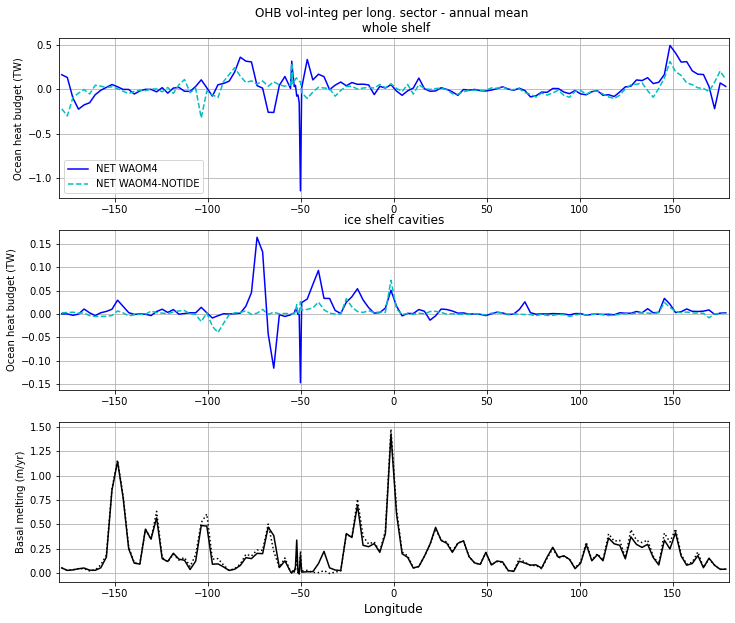

In [68]:

fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(3,1,1)
# ax1.plot(lon_bins,(net)*0,':k')
#--using 4km 5-daily:
# ax1.plot(lon_bins,(w4_vdiff).mean('ocean_time')*1e-12,'-',color='b',label='SHF WAOM4')
# ax1.plot(lon_bins,(w4_hadv).mean('ocean_time')*1e-12,'-',color='orange',label='ADV WAOM4')
# ax1.plot(lon_bins,(w4_hdiff).mean('ocean_time')*1e-12,'-',color='green',label='DIFF WAOM4')
ax1.plot(lon_bins,(w4_net).mean('ocean_time')*1e-12,'-',color='b',label='NET WAOM4')
# ax1.plot(lon_bins,(w4nt_vdiff).mean('ocean_time')*1e-12,':',color='b',label='SHF WAOM4-NOTIDE')
# ax1.plot(lon_bins,(w4nt_hadv).mean('ocean_time')*1e-12,':',color='orange',label='ADV WAOM4-NOTIDE')
# ax1.plot(lon_bins,(w4nt_hdiff).mean('ocean_time')*1e-12,':',color='green',label='DIFF WAOM4-NOTIDE')
ax1.plot(lon_bins,(w4nt_net).mean('ocean_time')*1e-12,'--',color='c',label='NET WAOM4-NOTIDE')
ax1.legend()
# ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW)')
ax1.set_title('OHB vol-integ per long. sector - annual mean \n whole shelf')
ax1.grid('on')
ax1.set_xlim(-180,180)

ax1 = fig.add_subplot(3,1,2)
# ax1.plot(lon_bins,(w4_vdiff_is).mean('ocean_time')*1e-12,'-',color='b',label='SHF WAOM4')
# ax1.plot(lon_bins,(w4_hadv_is).mean('ocean_time')*1e-12,'-',color='orange',label='ADV WAOM4')
# ax1.plot(lon_bins,(w4_hdiff_is).mean('ocean_time')*1e-12,'-',color='green',label='DIFF WAOM4')
ax1.plot(lon_bins,(w4_net_is).mean('ocean_time')*1e-12,'-',color='b',label='NET WAOM4')
# ax1.plot(lon_bins,(w4nt_vdiff_is).mean('ocean_time')*1e-12,':',color='b',label='SHF WAOM4-NOTIDE')
# ax1.plot(lon_bins,(w4nt_hadv_is).mean('ocean_time')*1e-12,':',color='orange',label='ADV WAOM4-NOTIDE')
# ax1.plot(lon_bins,(w4nt_hdiff_is).mean('ocean_time')*1e-12,':',color='green',label='DIFF WAOM4-NOTIDE')
ax1.plot(lon_bins,(w4nt_net_is).mean('ocean_time')*1e-12,'--',color='c',label='NET WAOM4-NOTIDE')
# ax1.legend()
# ax1.set_xlabel('longitudinal bins')
ax1.set_ylabel('Ocean heat budget (TW)')
ax1.set_title('ice shelf cavities')
ax1.grid('on')
ax1.set_xlim(-180,180)

ax2 = fig.add_subplot(3,1,3)
# ax2.plot(lon_bins,np.divide(np.nanmean(bmelt, axis=0),area_sum.values)*1000,'-k')
ax2.plot(lon_bins,np.divide(np.nanmean(w4_bmelt, axis=0),area_sum.values)*1000,'-k',label='WAOM4')
ax2.plot(lon_bins,np.divide(np.nanmean(w4nt_bmelt, axis=0),area_sum.values)*1000,':k',label='WAOM4-NOTIDE')
ax2.set_xlabel('Longitude',fontsize=12)
ax2.set_ylabel('Basal melting (m/yr)')
ax2.grid('on')
ax2.set_xlim(-180,180)

name_fig='waom4x4NT_lonbin_regional_OHBnet+basal_melt.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


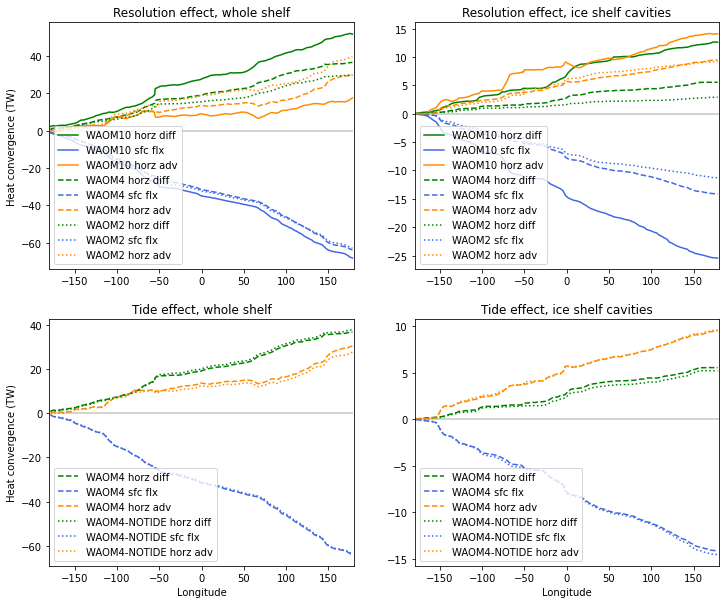

In [69]:
fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(2,2,1)
ax1.plot(lon_bins,(net)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff.mean('ocean_time').cumsum()*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(lon_bins,vdiff.mean('ocean_time').cumsum()*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(lon_bins,hadv.mean('ocean_time').cumsum()*1e-12,color='darkorange',label='WAOM10 horz adv')

ax1.plot(lon_bins,w4_hdiff.mean('ocean_time').cumsum()*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time').cumsum()*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time').cumsum()*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w2_hdiff.mean('ocean_time').cumsum()*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(lon_bins,w2_vdiff.mean('ocean_time').cumsum()*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(lon_bins,w2_hadv.mean('ocean_time').cumsum()*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Resolution effect, whole shelf')
ax1.set_ylabel('Heat convergence (TW)')

ax1 = fig.add_subplot(2,2,2)
ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff_is.mean('ocean_time').cumsum()*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(lon_bins,vdiff_is.mean('ocean_time').cumsum()*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(lon_bins,hadv_is.mean('ocean_time').cumsum()*1e-12,color='darkorange',label='WAOM10 horz adv')

ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time').cumsum()*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time').cumsum()*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time').cumsum()*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w2_hdiff_is.mean('ocean_time').cumsum()*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(lon_bins,w2_vdiff_is.mean('ocean_time').cumsum()*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(lon_bins,w2_hadv_is.mean('ocean_time').cumsum()*1e-12,':',color='darkorange',label='WAOM2 horz adv')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Resolution effect, ice shelf cavities')

ax1 = fig.add_subplot(2,2,3)

ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,w4_hdiff.mean('ocean_time').cumsum()*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time').cumsum()*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time').cumsum()*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w4nt_hdiff.mean('ocean_time').cumsum()*1e-12,':',color='green',label='WAOM4-NOTIDE horz diff')
ax1.plot(lon_bins,w4nt_vdiff.mean('ocean_time').cumsum()*1e-12,':',color='royalblue',label='WAOM4-NOTIDE sfc flx')
ax1.plot(lon_bins,w4nt_hadv.mean('ocean_time').cumsum()*1e-12,':',color='darkorange',label='WAOM4-NOTIDE horz adv')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Tide effect, whole shelf')
ax1.set_ylabel('Heat convergence (TW)')
ax1.set_xlabel('Longitude')

ax1 = fig.add_subplot(2,2,4)

ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time').cumsum()*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time').cumsum()*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time').cumsum()*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w4nt_hdiff_is.mean('ocean_time').cumsum()*1e-12,':',color='green',label='WAOM4-NOTIDE horz diff')
ax1.plot(lon_bins,w4nt_vdiff_is.mean('ocean_time').cumsum()*1e-12,':',color='royalblue',label='WAOM4-NOTIDE sfc flx')
ax1.plot(lon_bins,w4nt_hadv_is.mean('ocean_time').cumsum()*1e-12,':',color='darkorange',label='WAOM4-NOTIDE horz adv')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Tide effect, ice shelf cavities')
ax1.set_xlabel('Longitude')


name_fig='waom10x4x4NTx2_lonbin_regional_OHBprocesses_cumsum.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


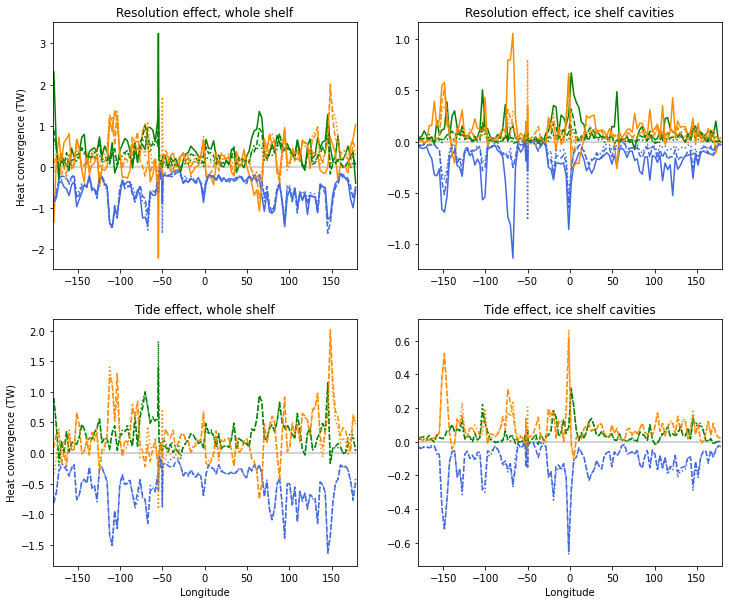

In [70]:
fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(2,2,1)
ax1.plot(lon_bins,(net)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff.mean('ocean_time')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(lon_bins,vdiff.mean('ocean_time')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(lon_bins,hadv.mean('ocean_time')*1e-12,color='darkorange',label='WAOM10 horz adv')

ax1.plot(lon_bins,w4_hdiff.mean('ocean_time')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w2_hdiff.mean('ocean_time')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(lon_bins,w2_vdiff.mean('ocean_time')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(lon_bins,w2_hadv.mean('ocean_time')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Resolution effect, whole shelf')
ax1.set_ylabel('Heat convergence (TW)')

ax1 = fig.add_subplot(2,2,2)
ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff_is.mean('ocean_time')*1e-12,color='green',label='WAOM10 horz diff')
ax1.plot(lon_bins,vdiff_is.mean('ocean_time')*1e-12,color='royalblue',label='WAOM10 sfc flx')
ax1.plot(lon_bins,hadv_is.mean('ocean_time')*1e-12,color='darkorange',label='WAOM10 horz adv')

ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w2_hdiff_is.mean('ocean_time')*1e-12,':',color='green',label='WAOM2 horz diff')
ax1.plot(lon_bins,w2_vdiff_is.mean('ocean_time')*1e-12,':',color='royalblue',label='WAOM2 sfc flx')
ax1.plot(lon_bins,w2_hadv_is.mean('ocean_time')*1e-12,':',color='darkorange',label='WAOM2 horz adv')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Resolution effect, ice shelf cavities')

ax1 = fig.add_subplot(2,2,3)

ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,w4_hdiff.mean('ocean_time')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w4nt_hdiff.mean('ocean_time')*1e-12,':',color='green',label='WAOM4-NOTIDE horz diff')
ax1.plot(lon_bins,w4nt_vdiff.mean('ocean_time')*1e-12,':',color='royalblue',label='WAOM4-NOTIDE sfc flx')
ax1.plot(lon_bins,w4nt_hadv.mean('ocean_time')*1e-12,':',color='darkorange',label='WAOM4-NOTIDE horz adv')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Tide effect, whole shelf')
ax1.set_ylabel('Heat convergence (TW)')
ax1.set_xlabel('Longitude')
ax1 = fig.add_subplot(2,2,4)

ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'--',color='green',label='WAOM4 horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'--',color='royalblue',label='WAOM4 sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='WAOM4 horz adv')

ax1.plot(lon_bins,w4nt_hdiff_is.mean('ocean_time')*1e-12,':',color='green',label='WAOM4-NOTIDE horz diff')
ax1.plot(lon_bins,w4nt_vdiff_is.mean('ocean_time')*1e-12,':',color='royalblue',label='WAOM4-NOTIDE sfc flx')
ax1.plot(lon_bins,w4nt_hadv_is.mean('ocean_time')*1e-12,':',color='darkorange',label='WAOM4-NOTIDE horz adv')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_title('Tide effect, ice shelf cavities')
ax1.set_xlabel('Longitude')

name_fig='waom10x4x4NTx2_lonbin_regional_OHBprocesses.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


In [71]:
net

<xarray.Variable (lon_bins: 127, ocean_time: 365)>
dask.array<add, shape=(127, 365), dtype=float64, chunksize=(127, 365), chunktype=numpy.ndarray>

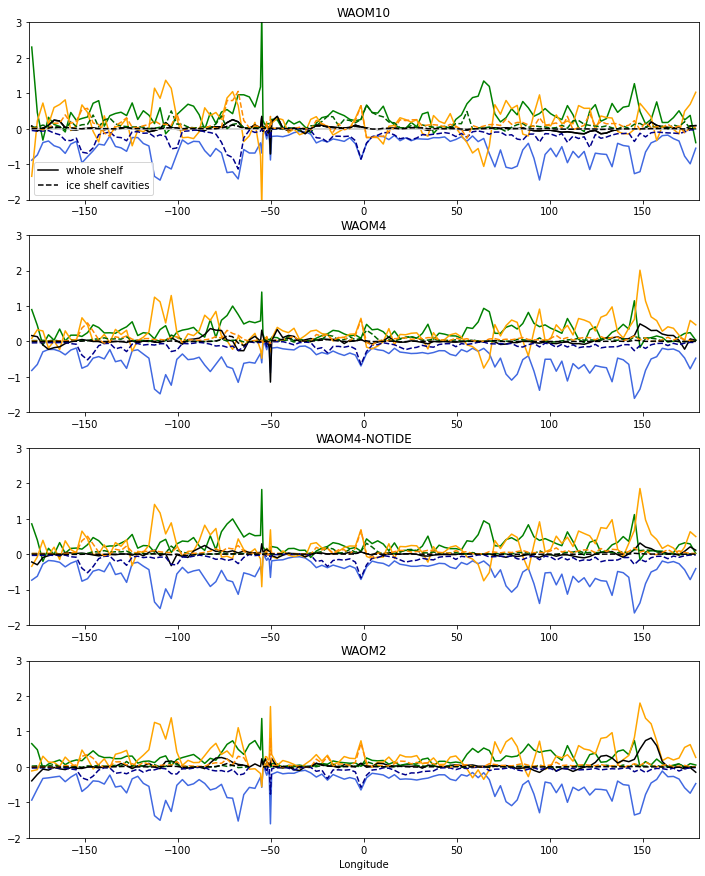

In [72]:
## 1 figure with 1 resolution (10km?), all processes + net, no cumsum. 
# Whole shelf (solid line) + cavities (dashed)
# - can we identify the driver for each "peak of OHCt/ADV/melting?
fig = plt.figure(figsize=(12,15))

ax1 = fig.add_subplot(4,1,1)
ax1.plot(lon_bins,(net)*0,'-', color='lightgray')
ax1.plot(lon_bins,net.mean('ocean_time')*1e-12,'-',color='k',label='whole shelf')
ax1.plot(lon_bins,net_is.mean('ocean_time')*1e-12,'--',color='k',label='ice shelf cavities')
ax1.legend(loc='lower left')
ax1.plot(lon_bins,hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,net.mean('ocean_time')*1e-12,'-',color='k',label='net')
ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM10')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,2)
ax1.plot(lon_bins,w4_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w4_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w4_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM4')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,3)
ax1.plot(lon_bins,w4nt_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w4nt_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w4nt_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w4nt_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w4nt_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w4nt_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w4nt_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w4nt_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM4-NOTIDE')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,4)
ax1.plot(lon_bins,w2_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w2_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w2_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w2_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w2_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w2_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w2_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w2_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM2')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)
ax1.set_xlabel('Longitude')


name_fig='waom10x4x2_lonbin_regional_OHBprocesses.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


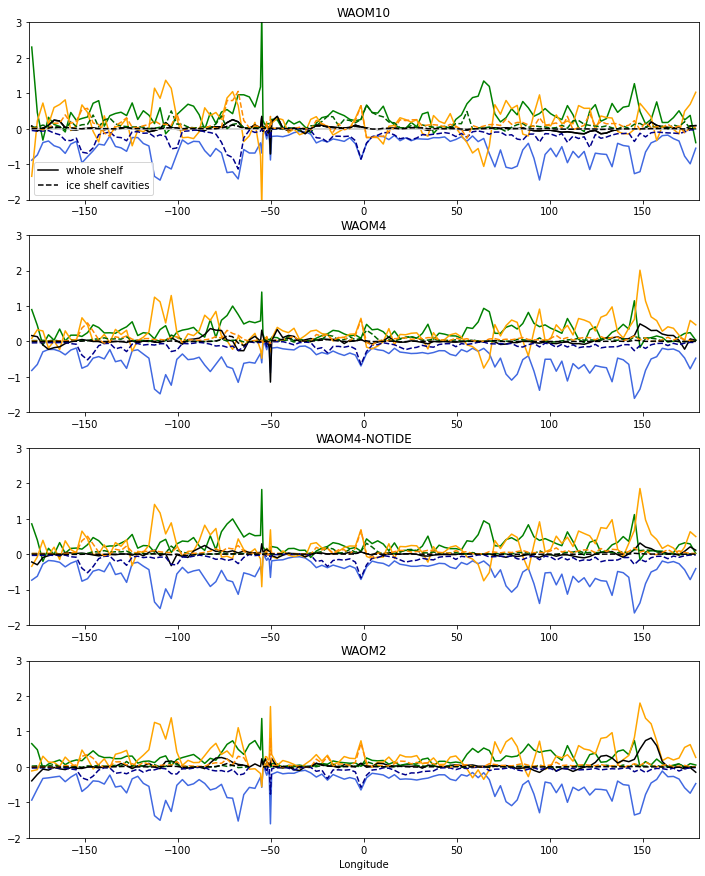

In [73]:
## 1 figure with 1 resolution (10km?), all processes + net, no cumsum. 
# Whole shelf (solid line) + cavities (dashed)
# - can we identify the driver for each "peak of OHCt/ADV/melting?
fig = plt.figure(figsize=(12,15))

ax1 = fig.add_subplot(4,1,1)
ax1.plot(lon_bins,(net)*0,'-', color='lightgray')
ax1.plot(lon_bins,net.mean('ocean_time')*1e-12,'-',color='k',label='whole shelf')
ax1.plot(lon_bins,net_is.mean('ocean_time')*1e-12,'--',color='k',label='ice shelf cavities')
ax1.legend(loc='lower left')
ax1.plot(lon_bins,hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,net.mean('ocean_time')*1e-12,'-',color='k',label='net')
ax1.plot(lon_bins,(net_is)*0,'-', color='lightgray')
ax1.plot(lon_bins,hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM10')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,2)
ax1.plot(lon_bins,w4_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w4_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w4_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w4_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w4_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM4')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,3)
ax1.plot(lon_bins,w4nt_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w4nt_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w4nt_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w4nt_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w4nt_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w4nt_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w4nt_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w4nt_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM4-NOTIDE')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)

ax1 = fig.add_subplot(4,1,4)
ax1.plot(lon_bins,w2_hdiff.mean('ocean_time')*1e-12,'-',color='green',label='horz diff')
ax1.plot(lon_bins,w2_vdiff.mean('ocean_time')*1e-12,'-',color='royalblue',label='sfc flx')
ax1.plot(lon_bins,w2_hadv.mean('ocean_time')*1e-12,'-',color='orange',label='horz adv')
ax1.plot(lon_bins,w2_net.mean('ocean_time')*1e-12,'-',color='k',label='horz adv')
ax1.plot(lon_bins,w2_hdiff_is.mean('ocean_time')*1e-12,'--',color='darkgreen',label='horz diff')
ax1.plot(lon_bins,w2_vdiff_is.mean('ocean_time')*1e-12,'--',color='darkblue',label='sfc flx')
ax1.plot(lon_bins,w2_hadv_is.mean('ocean_time')*1e-12,'--',color='darkorange',label='horz adv')
ax1.plot(lon_bins,w2_net_is.mean('ocean_time')*1e-12,'--',color='k',label='net')
ax1.set_title('WAOM2')
# ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2,3)
ax1.set_xlabel('Longitude')


name_fig='waom10x4x2_lonbin_regional_OHBprocesses.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight',facecolor='white')


In [74]:
### test mask_iceshelf effect:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
contour_masked_above_CF_tst = np.load(files_path + 'WAOM10_contour_masked_above_CF_v3', allow_pickle=True)
mask_iceshelf = ma.masked_where(contour_masked_above_CF!=-1000, np.ones(h.shape))
mask_outiceshelf = ma.masked_where(contour_masked_above_CF==-1000, np.ones(h.shape))

contour_masked_above = np.load(files_path + 'WAOM10_contour_masked_above_1500m_v3', allow_pickle=True)
mask_shelf = ma.masked_where(contour_masked_above==-1000, np.ones(h.shape))

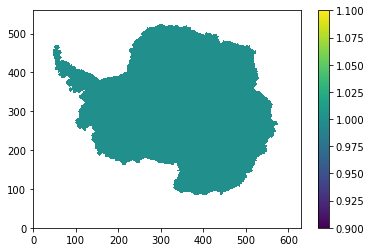

In [75]:
# plt.pcolormesh(mask_iceshelf)
plt.pcolormesh(mask_outiceshelf)
plt.colorbar()


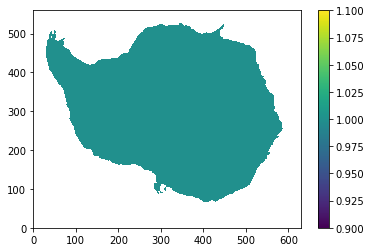

In [79]:
plt.pcolormesh(mask_shelf)
plt.colorbar()


### Figures from brainstorming - 23-Aug-2024

In [79]:
# define intervals:

# win1=90
# win2=349
# sum1=350
# sum2=89

win1=151 #Apr-Nov
win2=335 
sum1=336 #Dec-Mar
sum2=150


#### calculate summer/winter averages for all OHB terms:

In [80]:
# plt.plot(lon_bins,net.isel(ocean_time=slice(0,sum2)).mean('ocean_time')*1e-12,'--',color='r')

# define summer net (combining end of the year + beginning of the year):
# winter is defined while plotting...

# WAOM4:
w4_net_sumA=w4_net.isel(ocean_time=slice(0,sum2))
w4_net_sumB=w4_net.isel(ocean_time=slice(sum1,-1))
w4_net_SUM_A=xr.DataArray(w4_net_sumA)
w4_net_SUM_B=xr.DataArray(w4_net_sumB)
w4_net_summer = xr.concat((w4_net_SUM_A,w4_net_SUM_B), 'ocean_time')

w4_net_is_sumA=w4_net_is.isel(ocean_time=slice(0,sum2))
w4_net_is_sumB=w4_net_is.isel(ocean_time=slice(sum1,-1))
w4_net_is_SUM_A=xr.DataArray(w4_net_is_sumA)
w4_net_is_SUM_B=xr.DataArray(w4_net_is_sumB)
w4_net_is_summer = xr.concat((w4_net_is_SUM_A,w4_net_is_SUM_B), 'ocean_time')

w4_bmelt_sumA=w4_bmelt.isel(ocean_time=slice(0,sum2))
w4_bmelt_sumB=w4_bmelt.isel(ocean_time=slice(sum1,-1))
w4_bmelt_SUM_A=xr.DataArray(w4_bmelt_sumA)
w4_bmelt_SUM_B=xr.DataArray(w4_bmelt_sumB)
w4_bmelt_summer = xr.concat((w4_bmelt_SUM_A,w4_bmelt_SUM_B), 'ocean_time')

In [81]:

w4_bmeltS_sumA=w4_bmelt_shallow.isel(ocean_time=slice(0,sum2))
w4_bmeltS_sumB=w4_bmelt_shallow.isel(ocean_time=slice(sum1,-1))
w4_bmeltS_SUM_A=xr.DataArray(w4_bmeltS_sumA)
w4_bmeltS_SUM_B=xr.DataArray(w4_bmeltS_sumB)
w4_bmeltS_summer = xr.concat((w4_bmeltS_SUM_A,w4_bmeltS_SUM_B), 'ocean_time')

In [82]:

w4_bmeltD_sumA=w4_bmelt_deep.isel(ocean_time=slice(0,sum2))
w4_bmeltD_sumB=w4_bmelt_deep.isel(ocean_time=slice(sum1,-1))
w4_bmeltD_SUM_A=xr.DataArray(w4_bmeltD_sumA)
w4_bmeltD_SUM_B=xr.DataArray(w4_bmeltD_sumB)
w4_bmeltD_summer = xr.concat((w4_bmeltD_SUM_A,w4_bmeltD_SUM_B), 'ocean_time')

In [83]:
# plt.plot(lon_bins,hadv.isel(ocean_time=slice(0,sum2)).mean('ocean_time')*1e-12,'--',color='r')

# define summer hadv (combining end of the year + beginning of the year):

# WAOM10:
hadv_sumA=hadv.isel(ocean_time=slice(0,sum2))
hadv_sumB=hadv.isel(ocean_time=slice(sum1,-1))
hadv_SUM_A=xr.DataArray(hadv_sumA)
hadv_SUM_B=xr.DataArray(hadv_sumB)
hadv_summer = xr.concat((hadv_SUM_A,hadv_SUM_B), 'ocean_time')

hadv_is_sumA=hadv_is.isel(ocean_time=slice(0,sum2))
hadv_is_sumB=hadv_is.isel(ocean_time=slice(sum1,-1))
hadv_is_SUM_A=xr.DataArray(hadv_is_sumA)
hadv_is_SUM_B=xr.DataArray(hadv_is_sumB)
hadv_is_summer = xr.concat((hadv_is_SUM_A,hadv_is_SUM_B), 'ocean_time')

# WAOM4:
w4_hadv_sumA=w4_hadv.isel(ocean_time=slice(0,sum2))
w4_hadv_sumB=w4_hadv.isel(ocean_time=slice(sum1,-1))
w4_hadv_SUM_A=xr.DataArray(w4_hadv_sumA)
w4_hadv_SUM_B=xr.DataArray(w4_hadv_sumB)
w4_hadv_summer = xr.concat((w4_hadv_SUM_A,w4_hadv_SUM_B), 'ocean_time')

w4_hadv_is_sumA=w4_hadv_is.isel(ocean_time=slice(0,sum2))
w4_hadv_is_sumB=w4_hadv_is.isel(ocean_time=slice(sum1,-1))
w4_hadv_is_SUM_A=xr.DataArray(w4_hadv_is_sumA)
w4_hadv_is_SUM_B=xr.DataArray(w4_hadv_is_sumB)
w4_hadv_is_summer = xr.concat((w4_hadv_is_SUM_A,w4_hadv_is_SUM_B), 'ocean_time')


In [84]:
# plt.plot(lon_bins,hdiff.isel(ocean_time=slice(0,sum2)).mean('ocean_time')*1e-12,'--',color='r')

# define summer hdiff (combining end of the year + beginning of the year):

# WAOM10:
hdiff_sumA=hdiff.isel(ocean_time=slice(0,sum2))
hdiff_sumB=hdiff.isel(ocean_time=slice(sum1,-1))
hdiff_SUM_A=xr.DataArray(hdiff_sumA)
hdiff_SUM_B=xr.DataArray(hdiff_sumB)
hdiff_summer = xr.concat((hdiff_SUM_A,hdiff_SUM_B), 'ocean_time')

hdiff_is_sumA=hdiff_is.isel(ocean_time=slice(0,sum2))
hdiff_is_sumB=hdiff_is.isel(ocean_time=slice(sum1,-1))
hdiff_is_SUM_A=xr.DataArray(hdiff_is_sumA)
hdiff_is_SUM_B=xr.DataArray(hdiff_is_sumB)
hdiff_is_summer = xr.concat((hdiff_is_SUM_A,hdiff_is_SUM_B), 'ocean_time')

# WAOM4:
w4_hdiff_sumA=w4_hdiff.isel(ocean_time=slice(0,sum2))
w4_hdiff_sumB=w4_hdiff.isel(ocean_time=slice(sum1,-1))
w4_hdiff_SUM_A=xr.DataArray(w4_hdiff_sumA)
w4_hdiff_SUM_B=xr.DataArray(w4_hdiff_sumB)
w4_hdiff_summer = xr.concat((w4_hdiff_SUM_A,w4_hdiff_SUM_B), 'ocean_time')

w4_hdiff_is_sumA=w4_hdiff_is.isel(ocean_time=slice(0,sum2))
w4_hdiff_is_sumB=w4_hdiff_is.isel(ocean_time=slice(sum1,-1))
w4_hdiff_is_SUM_A=xr.DataArray(w4_hdiff_is_sumA)
w4_hdiff_is_SUM_B=xr.DataArray(w4_hdiff_is_sumB)
w4_hdiff_is_summer = xr.concat((w4_hdiff_is_SUM_A,w4_hdiff_is_SUM_B), 'ocean_time')


In [85]:
# plt.plot(lon_bins,vdiff.isel(ocean_time=slice(0,sum2)).mean('ocean_time')*1e-12,'--',color='r')

# define summer vdiff (combining end of the year + beginning of the year):

# WAOM10:
vdiff_sumA=vdiff.isel(ocean_time=slice(0,sum2))
vdiff_sumB=vdiff.isel(ocean_time=slice(sum1,-1))
vdiff_SUM_A=xr.DataArray(vdiff_sumA)
vdiff_SUM_B=xr.DataArray(vdiff_sumB)
vdiff_summer = xr.concat((vdiff_SUM_A,vdiff_SUM_B), 'ocean_time')

vdiff_is_sumA=vdiff_is.isel(ocean_time=slice(0,sum2))
vdiff_is_sumB=vdiff_is.isel(ocean_time=slice(sum1,-1))
vdiff_is_SUM_A=xr.DataArray(vdiff_is_sumA)
vdiff_is_SUM_B=xr.DataArray(vdiff_is_sumB)
vdiff_is_summer = xr.concat((vdiff_is_SUM_A,vdiff_is_SUM_B), 'ocean_time')

# WAOM4:
w4_vdiff_sumA=w4_vdiff.isel(ocean_time=slice(0,sum2))
w4_vdiff_sumB=w4_vdiff.isel(ocean_time=slice(sum1,-1))
w4_vdiff_SUM_A=xr.DataArray(w4_vdiff_sumA)
w4_vdiff_SUM_B=xr.DataArray(w4_vdiff_sumB)
w4_vdiff_summer = xr.concat((w4_vdiff_SUM_A,w4_vdiff_SUM_B), 'ocean_time')

w4_vdiff_is_sumA=w4_vdiff_is.isel(ocean_time=slice(0,sum2))
w4_vdiff_is_sumB=w4_vdiff_is.isel(ocean_time=slice(sum1,-1))
w4_vdiff_is_SUM_A=xr.DataArray(w4_vdiff_is_sumA)
w4_vdiff_is_SUM_B=xr.DataArray(w4_vdiff_is_sumB)
w4_vdiff_is_summer = xr.concat((w4_vdiff_is_SUM_A,w4_vdiff_is_SUM_B), 'ocean_time')


In [86]:
# Define regions with peak of basal melting:
# 150W, Ross
# 130W, Getz
# 105W, Thwaites
# 60-80W, George VI
# 45W, Ronne
# 0, Fimbulisen
# 80E, Amery
# 100-110E, Shackleton
# 110-125E, Totten
# 145-155E, Mertz

# old (before lonlatbins-v2): 
# names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','Ronne',
#                'Fimbul','Amery','Shackleton','Totten','Mertz']
# sind_subreg = [7, 14, 24, 33, 50, 63, 93, 99, 104, 114]
# eind_subreg = [13, 18, 27, 42, 55, 69, 98, 103, 108, 119]

# - new (lonlatbins-v2): 
# sind_subreg = [7, 14, 24, 34, 60, 75, 104, 110, 114, 124, 135]
# eind_subreg = [13, 19, 27, 41, 66, 79, 108, 113, 118, 129, 139]
# - fix after inspecting each sub-regions (10/10/24):
sind_subreg = [8, 14, 22, 32, 49, 75, 99, 108, 114, 124, 135, 0]
eind_subreg = [12, 21, 27, 37, 67, 80, 105, 113, 118, 129, 140, 6]

max_BM = [3, 2, 1, 2.5, 1, 1, 1,
          3.8, 2, 2, 1, 1]        # max ylim for basal melting plot (vary b/w regions)

names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
               'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']
max_BM = [3, 2, 1, 2.5, 1, 1, 1,
          3.8, 2, 2, 1, 1]        # max ylim for basal melting plot (vary b/w regions)



### plotting maps for figure 4 and figure S2

In [38]:
u3d_4km.shape
# temp3d_4km.shape

(12, 31, 1400, 1574)

In [39]:
%%time
# treat velocities; interpolate u/v to rho-grid


w4r_def = pyresample.geometry.SwathDefinition(lons=lon_rho_4km[:,:],lats=lat_rho_4km[:,:])
w4u_def = pyresample.geometry.SwathDefinition(lons=lon_u_4km[:,:],lats=lat_u_4km[:,:])
w4v_def = pyresample.geometry.SwathDefinition(lons=lon_v_4km[:,:],lats=lat_v_4km[:,:])

wf = lambda r: 1/r

u_rho_i = np.empty(temp3d_4km.shape)
v_rho_i = np.empty(temp3d_4km.shape)
for tt in np.arange(0,12):
    for kk in np.arange(0,31):
        u_rho_tmp = pyresample.kd_tree.resample_custom(w4u_def,u3d_4km[tt,kk,:,:].values,w4r_def,\
                                         radius_of_influence=30000,neighbours=1,weight_funcs=wf)
        v_rho_tmp = pyresample.kd_tree.resample_custom(w4v_def,v3d_4km[tt,kk,:,:].values,w4r_def,\
                                         radius_of_influence=30000,neighbours=1,weight_funcs=wf)
        u_rho_i[tt,kk,:] = u_rho_tmp
        v_rho_i[tt,kk,:] = v_rho_tmp
        del u_rho_tmp, v_rho_tmp


CPU times: user 23min 41s, sys: 1min 43s, total: 25min 24s
Wall time: 23min 9s


In [40]:
## Re-map u/v for plotting:
# call cartopy projectione
proj = ccrs.PlateCarree()

# re-gridding
src = ccrs.PlateCarree()
nx, ny = 1575,1400

scale = 1e7
xs = np.linspace(-scale, scale, nx)
ys = np.linspace(-scale, scale, ny)

xs, ys = np.meshgrid(xs, ys)

In [41]:
annual_T = temp3d_4km.mean('ocean_time')
annual_S = salt3d_4km.mean('ocean_time')
annual_Z = z_rho3d_4km.mean('ocean_time')

sum_T = (temp3d_4km.isel(ocean_time=0)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
sum_S = (salt3d_4km.isel(ocean_time=0))
sum_U = (u_rho_i[0,:,:]) 
sum_V = (v_rho_i[0,:,:]) 
sum_Z = z_rho3d_4km.isel(ocean_time=0)

win_T = (temp3d_4km.isel(ocean_time=6)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) # July - Anual (- mean winter is colder...)
win_S = salt3d_4km.isel(ocean_time=6)
win_U = (u_rho_i[6,:,:]) 
win_V = (v_rho_i[6,:,:]) 
win_Z = z_rho3d_4km.isel(ocean_time=6)


In [55]:
## obtain temp/salt values for each sub-regions selected ## these below doesn't work as the indexes in the contour_masked_above_CF_4km (len 6116) DON'T match with the T/S variables (temp_4km_CF, salt_4km_CF, len 9018)
# indexes_subr = np.empty((12,2))
# for bb in range(0,12):
#     # first define length of bins for each subregion:
#     dif_bins = (eind_subreg[bb] - sind_subreg[bb])+1
#     # print(bb, dif_bins)
#     masks_comb = np.empty((dif_bins,1400,1575))
    
#     for gg in range(0,dif_bins):
#         indtmp = sind_subreg[bb]+gg
#         print(gg, indtmp)
#         mask_tmp = mask_LonBins_4km[indtmp,:]
#         # mask_tmp.shape
#         masks_comb[gg,:] = mask_tmp
#         del mask_tmp, indtmp
#         tmp_bin = contour_masked_above_CF_4km*masks_comb[gg,:]*w4_mask_land*w4_mask_shelf #*w4_mask_zice
#         # Create a mask for values that are 0 or -1000 (i.e., >0); only leave numbered values along CF contour
#         mask = (tmp_bin > 0)
#         masked_tmp_bin = np.where(mask, tmp_bin, np.nan)  # Replace masked values with NaN
#         # Obtain first and last indexes for this section
#         if gg == 0:
#             i1 = np.nanmin(masked_tmp_bin)#+1000)
#             print('i1=',i1)
#         if gg==dif_bins-1:
#             i2 = np.nanmax(masked_tmp_bin)
#             print('i2=',i2)
#     indexes_subr[bb,:] = [i1, i2]
#     del i1, i2

# # fix FRIS i1
# indexes_subr[4,0] = 3150
    

In [ ]:
%%time
## New way to obtain T-S alojng the Calving Front for each subregion (i.e., across a few lon-lat bins)

# 1 - choose region
rr = 0 # Sulzberger

# 2 - sum individual bins:
mask_LonBins_tmp = mask_LonBins_4km[sind_subreg[rr]:eind_subreg[rr],:]
mask_LonBins_tmp = np.nansum(mask_LonBins_tmp, axis=0)

# 3 - multiply ice shelves mask (masked outside it) and Lon Bins:
newmask_bin = w4_mask_outiceshelf*mask_LonBins_tmp
# 3b - mask out values that are 0 
mask = (newmask_bin == 1)
newmask_bin = np.where(mask, newmask_bin, np.nan)  # Replace masked values with NaN

# 4 - define T/S/Z variables for the TS-plot:
temp_masked_ann = newmask_bin*annual_T
salt_masked_ann = newmask_bin*annual_S
Z_masked_ann = newmask_bin*annual_Z.transpose('s_rho','eta_rho','xi_rho')

# 5 -filter & stack example:
# 5a - Flatten the 3D array to 2D while removing NaNs
flat_temp = temp_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
flat_salt = salt_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
flat_z_rho = Z_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
non_nan_mask = ~np.isnan(flat_temp)
# 5b -Filter out NaN values
filtered_temp = flat_temp[non_nan_mask]
filtered_salt = flat_salt[non_nan_mask]
filtered_z_rho = flat_z_rho[non_nan_mask]


In [ ]:
%%time
# now do for winter/summer climatologies:

# filter & stack example:
# Flatten the 3D array to 2D while removing NaNs
flat_temp_sum = sum_T.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
flat_salt_sum = sum_S.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
flat_z_rho_sum = sum_Z.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
non_nan_mask = ~np.isnan(flat_temp_sum)

# Filter out NaN values
filt_temp_sum = flat_temp_sum[non_nan_mask]
filt_salt_sum = flat_salt_sum[non_nan_mask]
filt_z_rho_sum = flat_z_rho_sum[non_nan_mask]



In [ ]:
proj = ccrs.PlateCarree(central_longitude=0)#-24)
# proj = ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(15,14))

## PIG region ------------------------------------------------------------
ax2 = fig.add_subplot(1,1,1, projection=proj) # Anual

# ax2.quiver(xs[::10,::10],ys[::10,::10],
           #  np.mean(u_rho_i[:,15,::10,::10],axis=0),
           # np.mean(v_rho_i[:,15,::10,::10],axis=0),ccrs.SouthPolarStereo())

ax2.quiver(lon_rho_4km[::10,::10],lat_rho_4km[::10,::10],
           np.mean(u_rho_i[:,15,::10,::10],axis=0),
           np.mean(v_rho_i[:,15,::10,::10],axis=0),transform=ccrs.PlateCarree()) 

x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels

plt.show()

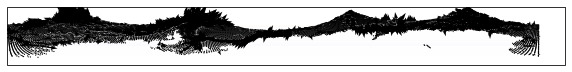

In [50]:
# proj = ccrs.PlateCarree(central_longitude=0)#-24)
proj = ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(10,10))

## PIG region ------------------------------------------------------------
ax2 = fig.add_subplot(1,1,1, projection=proj) # Anual
ax2.pcolormesh(lon_rho_4km,lat_rho_4km,np.mean(u_rho_i[:,-1,:]*v_rho_i[:,-1,:],axis=0)
               ,cmap='bwr',transform=proj, vmin=-.1, vmax=.1)

ax2.quiver(lon_rho_4km[::10,::10],lat_rho_4km[::10,::10],
           np.mean(u_rho_i[:,15,::10,::10],axis=0),
           np.mean(v_rho_i[:,15,::10,::10],axis=0))#,transform=proj)#ccrs.PlateCarree()) 

# x_left, x_right = ax2.get_xlim()
# y_low, y_high = ax2.get_ylim()
# ratio = .5
# ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
# gl=ax2.gridlines(draw_labels=True,linewidth=.1)
# gl.top_labels=False   # suppress top labels
# gl.right_labels=False   # suppress right labels

# plt.show()

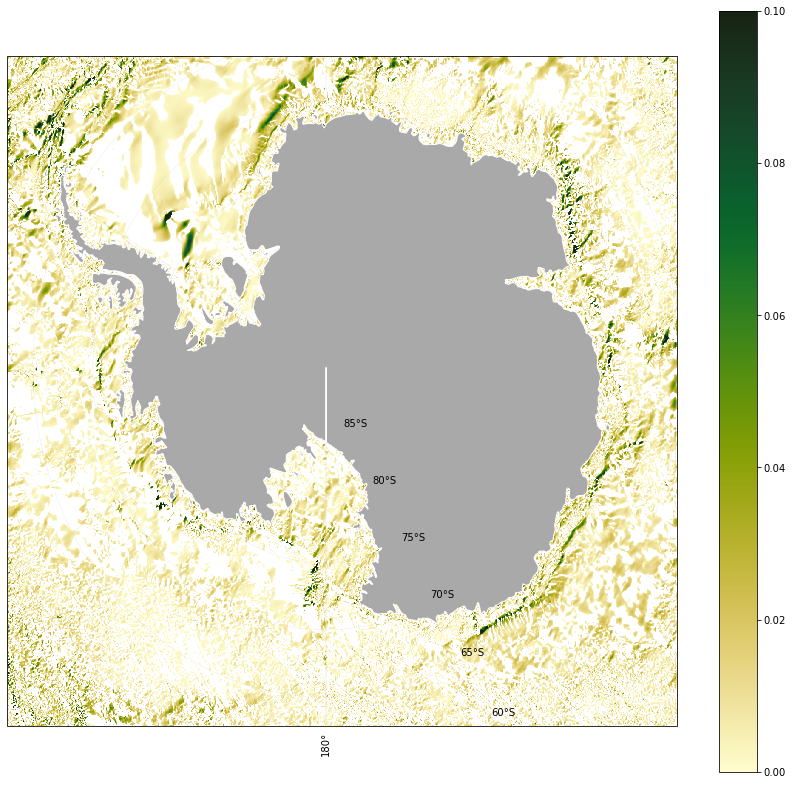

In [47]:
# proj = ccrs.PlateCarree(central_longitude=0)#-24)
proj = ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(15,14))

## PIG region ------------------------------------------------------------
ax2 = fig.add_subplot(1,1,1, projection=proj) # Anual
cb=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,np.sqrt(np.mean(u_rho_i[:,0,:]*v_rho_i[:,0,:],axis=0))
               ,cmap=cmocean.cm.speed,transform=ccrs.PlateCarree(), vmin=0, vmax=.1)

x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

ax2.quiver(lon_rho_4km[20::5,20::5],lat_rho_4km[20::5,20::5],
           np.mean(u_rho_i[:,0,20::5,20::5]*u_rho_i[:,0,20::5,20::5],axis=0),
           np.mean(v_rho_i[:,0,20::5,20::5]*v_rho_i[:,0,20::5,20::5],axis=0),scale=5,transform=ccrs.SouthPolarStereo())

# plt.show()
plt.colorbar(cb)

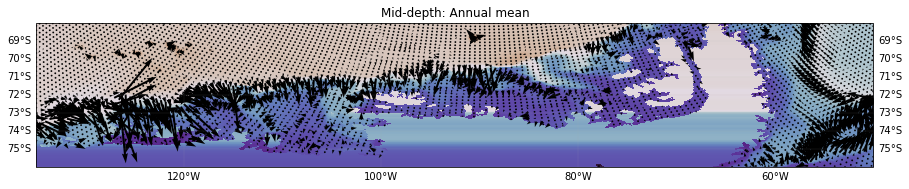

In [48]:



proj = ccrs.PlateCarree(central_longitude=0)#-24)

fig = plt.figure(figsize=(15,14))

## PIG region ------------------------------------------------------------
ax2 = fig.add_subplot(1,1,1, projection=proj) # Anual
ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=0).values, transform=ccrs.PlateCarree(),
               vmin=-3, vmax=3 ,cmap='twilight_shifted') 
ax2.set_title('Mid-depth: Annual mean')
# ax2.set_xlim(200,450)
# ax2.set_ylim(370,800)
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .2
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,0,::5,::5],axis=0),
           np.mean(v_rho_i[:,0,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())

gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
# ax2.add_feature(cfeature.LAND, zorder=3, facecolor='gray') # , edgecolor='white', 
# ax2.set_extent([-180, 180, -86, -61.5], crs=ccrs.PlateCarree())
ax2.set_extent([-135, -50, -76, -68], crs=ccrs.PlateCarree()) # PIG-Thwaites region
# ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
# ax2.set_extent([-80, -20, -85, -65], crs=ccrs.PlateCarree()) # Weddell region

# cbar_ax2 = fig.add_axes([0.91, 0.12,  0.01, 0.75])
# fig.colorbar(ct, cax=cbar_ax2, orientation='vertical')
# cbar_ax2.set_xlabel('m$^{2}$ s$^{-2}$')#, labelpad=-35)


Text(0, 0.5, 'm/yr')

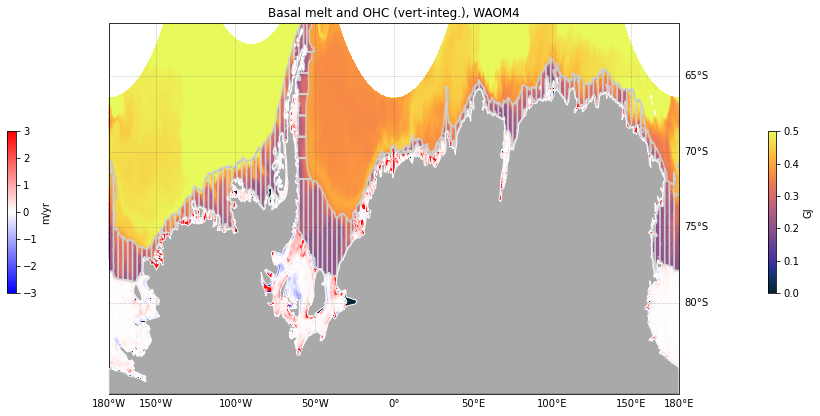

In [52]:
Melt_fac_map=365.25*86400
rho_ice = 916 # https://github.com/kuechenrole/antarctic_melting/blob/master/notebooks/GRL/Susheel_bfrn_depth_structure.ipynb
# Melt_fac = 86400*365.25*rho_ice
# Melt_fac=rho_ice*1e-12 # convert to Gigatonne (=1e12 kg)


proj = ccrs.PlateCarree(central_longitude=0)

fig = plt.figure(figsize=(12,15))

# 1) map:

# -for 4km:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5

ax1 = fig.add_subplot(2,1,1, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
cm1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   ma.masked_where(contour_masked_above_CF_4km[jst:jen,ist:ien] == -1000, melt_4km[:,jst:jen,ist:ien].mean('ocean_time'))*Melt_fac_map,
                   transform=ccrs.PlateCarree(), vmin=-3, vmax=3, cmap='bwr') #, cmap=cmocean.cm.balance
plt.scatter(lon_along_4km,lat_along_4km,marker='.', s=.3, alpha=0.4, color='darkgray',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF,marker='.', s=.3, alpha=0.4, color='lightcyan',label='Calving front', transform=ccrs.PlateCarree());
# plt.legend(loc='lower right')

## ---- include bins limits:
for ii in np.arange(1,140): # 1-125 is fine, issue is the ones closer to 180E/W??
    tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
    tmp_filled = np.nan_to_num(tmp, nan=0)
    cc=plt.contour(lon_rho_4km,lat_rho_4km,
                    tmp_filled, levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ien=750
ii=0
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ist=750
ien=-1
ii=-1
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
## ------------------------
plt.title('Basal melt and OHC (vert-integ.), WAOM4')

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlines = True
gl.top_labels=False   # suppress top labels
gl.xlabels_bottom = True
gl.ylabels_left = False
gl.ylabels_right = True
gl.xlocator = mticker.FixedLocator([-180, -150, -100, -50, 0, 50, 100, 150, 180])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax1.set_extent([-180, 180, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .65  #.175

ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
cbar_ax0 = fig.add_axes([0.945, 0.63,  0.01, 0.15])
fig.colorbar(ct1, cax=cbar_ax0, orientation='vertical')
cbar_ax0.set_ylabel('GJ')#, labelpad=-35)
cbar_ax1 = fig.add_axes([0.065, 0.63,  0.01, 0.15])
fig.colorbar(cm1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('m/yr')#, labelpad=-35)

In [113]:
Melt_fac=365.25*86400


dayofmonth = [slice(0,32), slice(32,61), slice(61,93), slice(93,123), slice(123,155), slice(155,184), slice(184,215), 
              slice(215,247), slice(247,277), slice(277,304), slice(304,334), slice(334,365)]

# define limits for maps of each region:

# order is: LonMin, LonMax, LatMin, LatMax
# map_limits=[[-180, -135, -84, -74], # Sulzberger
map_limits=[[-165, -135, -79, -74], # Sulzberger
[-140, -110, -71, -76],             # Getz
[-120, -90, -76, -69],              # PIG-Thwaites
[-100, -17, -83.5, -65],            # Bellingshausen+FRIS
[-100, -17, -83.5, -65],            # Bellingshausen+FRIS
[-15, 15, -73.5, -69],              # Fimbul
[65, 85, -74, -65],                 # Amery
[80, 110, -68.1, -63],              # Shackleton
[110, 135, -68, -63.5],             # Totten
[130,160, -71, -64],              # Mertz 
[-215,-160, -84, -67]]              # Ross
# only 9 regions, as 3+4 (Bells+FRiss) and 9+10+11 (Mertz+Ross)

# ax2.set_extent([-165, -135, -79, -74], crs=ccrs.PlateCarree()) # Sulzberger
# ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
# ax2.set_extent([-120, -90, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
# ax2.set_extent([-100, -17, -83.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen+FRIS
# ax2.set_extent([-15, 15, -73.5, -69], crs=ccrs.PlateCarree()) # Fimbul
# ax2.set_extent([65, 85, -74, -65], crs=ccrs.PlateCarree()) # Amery
# ax2.set_extent([80, 110, -68.1, -63], crs=ccrs.PlateCarree()) # Shackleton
# ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
# ax2.set_extent([-215,-160, -84, -67], crs=ccrs.PlateCarree()) # Ross; need proj = ccrs.PlateCarree()


### Figure 4 - final for paper: Feb x Aug, Getz x Tot.

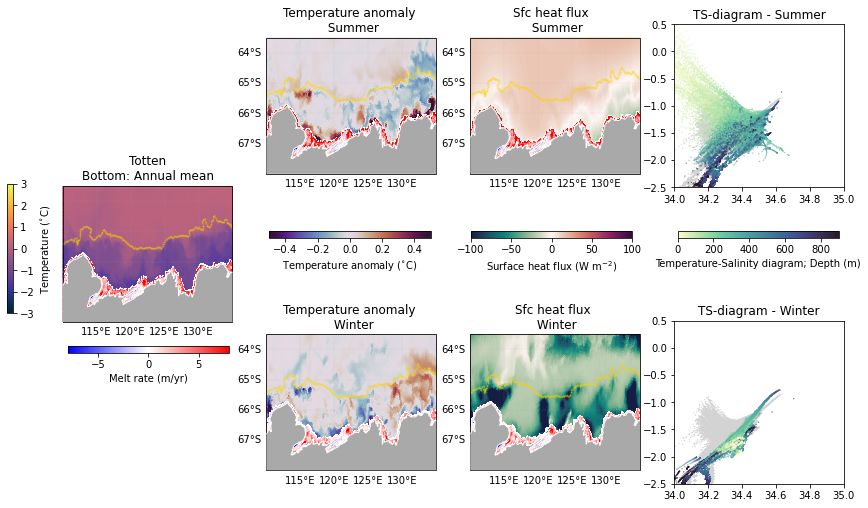

In [41]:
#%%time # being done by WAOM4_run_maps_Figure4_newTS.py offline. # This test SUM = DEC-APR (need to concat!!) and WIN = MAY-NOV

## this piece do the maps for Figure 4 (containing annual temp, anom 1month in summer, anom 1 month in winter) + TS-diag for 2 regions (totten x PIG) at SURFACE, MID-DEPTH, BOTTOM sigma layers

slayer=[15, -1, 0]
zname =['Mid-depth','Surface','Bottom']
pname =['mid-depth','surface','bottom']
anomlim=[0.5, 2, 0.5]

for dd in np.arange(2,3):
    # dd=2
    
    mm=1 # So sum_MM=February (2nd month) and win_MM=August (8th month)
    sum_MM=mm
    win_MM=mm+6
    # sum_MM = slice(0,3)
    # win_MM = slice(4,10)
    
    # define subregion:
    # names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
                   # 'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']
    
    for rr in range(8,9):
        Pname = names_subreg[rr]

        # define 2d Map vars for plottins: annual, summer month, winter month
        annual_T = temp3d_4km.mean('ocean_time')
        annual_S = salt3d_4km.mean('ocean_time')
        annual_Z = z_rho3d_4km.mean('ocean_time')
        annual_melt = melt_4km.mean('ocean_time')*Melt_fac

        sum_Ta = (temp3d_4km.isel(ocean_time=sum_MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
        sum_T = (temp3d_4km.isel(ocean_time=sum_MM))
        sum_S = (salt3d_4km.isel(ocean_time=sum_MM))
        sum_Z = z_rho3d_4km.isel(ocean_time=sum_MM)

        # sum_U = (u_rho_i[sum_MM,:,:])
        # sum_V = (v_rho_i[sum_MM,:,:])
        sum_melt = melt_4km.isel(ocean_time=sum_MM)*Melt_fac

        win_Ta = (temp3d_4km.isel(ocean_time=win_MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) # Jul - Anual (- mean winter is colder...)
        win_T = (temp3d_4km.isel(ocean_time=win_MM))
        win_S = (salt3d_4km.isel(ocean_time=win_MM))
        win_Z = z_rho3d_4km.isel(ocean_time=win_MM)
        # win_U = (u_rho_i[win_MM,:,:])
        # win_V = (v_rho_i[win_MM,:,:])
        win_melt = melt_4km.isel(ocean_time=win_MM)*Melt_fac
        
        # shflux
        annual_shf = shflux_4km.mean('ocean_time')
        sum_shf = shflux_4km.isel(ocean_time=sum_MM)
        win_shf = shflux_4km.isel(ocean_time=win_MM)
    
        # get map limits: 
        LonMin=map_limits[rr][0]
        LonMax=map_limits[rr][1]
        LatMin=map_limits[rr][2]
        LatMax=map_limits[rr][3]
            
    
        #### TS-diag related definitions (along the calving front):
        # 2 - sum individual bins:
        mask_LonBins_tmp = mask_LonBins_4km[sind_subreg[rr]:eind_subreg[rr],:]
        mask_LonBins_tmp = np.nansum(mask_LonBins_tmp, axis=0)

        # 3 - multiply ice shelves mask (masked outside it) and Lon Bins:
        newmask_bin = w4_mask_outiceshelf*mask_LonBins_tmp
        # 3b - mask out values that are 0
        mask = (newmask_bin == 1)
        newmask_bin = np.where(mask, newmask_bin, np.nan)  # Replace masked values with NaN

        # 4 - define T/S/Z variables for the TS-plot:
## Annual
        temp_masked_ann = newmask_bin*annual_T
        salt_masked_ann = newmask_bin*annual_S
        Z_masked_ann = newmask_bin*annual_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_ann = temp_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_ann = salt_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_ann = Z_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_ann)
        # 5b -Filter out NaN values
        filt_temp_ann = flat_temp_ann[non_nan_mask]
        filt_salt_ann = flat_salt_ann[non_nan_mask]
        filt_z_rho_ann = flat_z_rho_ann[non_nan_mask]
## Summer:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_sum = newmask_bin*sum_T
        salt_masked_sum = newmask_bin*sum_S
        Z_masked_sum = newmask_bin*sum_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_sum = temp_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_sum = salt_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_sum = Z_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_sum)
        # 5b -Filter out NaN values
        filt_temp_sum = flat_temp_sum[non_nan_mask]
        filt_salt_sum = flat_salt_sum[non_nan_mask]
        filt_z_rho_sum = flat_z_rho_sum[non_nan_mask]
## Winter:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_win = newmask_bin*win_T
        salt_masked_win = newmask_bin*win_S
        Z_masked_win = newmask_bin*win_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaN
        flat_temp_win = temp_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_win = salt_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_win = Z_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_win)
        # 5b -Filter out NaN values
        filt_temp_win = flat_temp_win[non_nan_mask]
        filt_salt_win = flat_salt_win[non_nan_mask]
        filt_z_rho_win = flat_z_rho_win[non_nan_mask]
        
        proj_v = ccrs.PlateCarree()
        proj = ccrs.PlateCarree(central_longitude=0)#-24)
        proj_v2 = ccrs.SouthPolarStereo()
        proj2 = ccrs.SouthPolarStereo()
        
        # fig = plt.figure(figsize=(15,8))
        fig = plt.figure(figsize=(14,10))
        
    
        # if Ross, need to use proj2!
        if rr>10:
            PROJ=proj2
            PROJV=proj_v2
        else:
            PROJ=proj
            PROJV=proj_v
        PROJN=proj_v
        
        ax2 = fig.add_subplot(3,4,5, projection=PROJ) # Anual    
        ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
                       vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=PROJN) 
        
        cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
                          
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
        #            np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
        #            np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=PROJV)
        ax2.set_title(names_subreg[rr] + '\n' + zname[dd] + ': Annual mean')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        gl.left_labels=False   
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,2, projection=PROJ) # jan, TEMP ANOM
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Summer')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,3, projection=PROJ) # SHFLUX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                       vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Sfc heat flux  \n Summer')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,6, projection=PROJ) # july temp anom
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
        #            win_U[slayer[dd],::5,::5],
        #            win_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Winter')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,7, projection=PROJ) # SHFLX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_shf,
                       vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
        #            win_U[slayer[dd],::5,::5],
        #            win_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Sfc heat flux \n Winter')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        
        ax3 = fig.add_subplot(2,4,4)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_sum, filt_temp_sum, c=-filt_z_rho_sum, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(sum_S*Mask_tmp_subr,sum_T*Mask_tmp_subr,c=-sum_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Summer')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        ax3 = fig.add_subplot(2,4,8)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_win, filt_temp_win, c=-filt_z_rho_win, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(win_S*Mask_tmp_subr,win_T*Mask_tmp_subr,c=-win_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Winter')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        
        cbar_ax1 = fig.add_axes([0.07, 0.42,  0.006, 0.18])
        fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
        cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax12 = fig.add_axes([0.13, 0.365,  0.16, 0.01])
        fig.colorbar(cm, cax=cbar_ax12, orientation='horizontal')
        cbar_ax12.set_xlabel('Melt rate (m/yr)')#, labelpad=-35)
        
        cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
        fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
        cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01]) 
        fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
        cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)
        
        # cbar_ax1 = fig.add_axes([0.912, 0.2,  0.01, 0.6])
        # fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
        # cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
        cbar_ax1 = fig.add_axes([0.735, 0.525,  0.16, 0.01])
        fig.colorbar(c, cax=cbar_ax1, orientation='horizontal')
        cbar_ax1.set_xlabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
            
        name_fig='waom4_MapsT+SHF_season_' + pname[dd] + '_' + Pname +'_tsts.png'
        plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

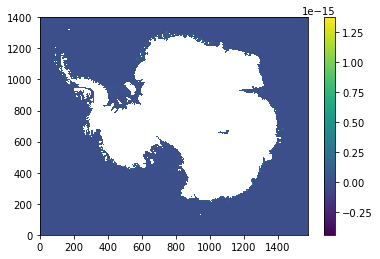

In [107]:
plt.pcolormesh(sum_melt)
plt.colorbar()

In [108]:
Melt_fac

31557600.0

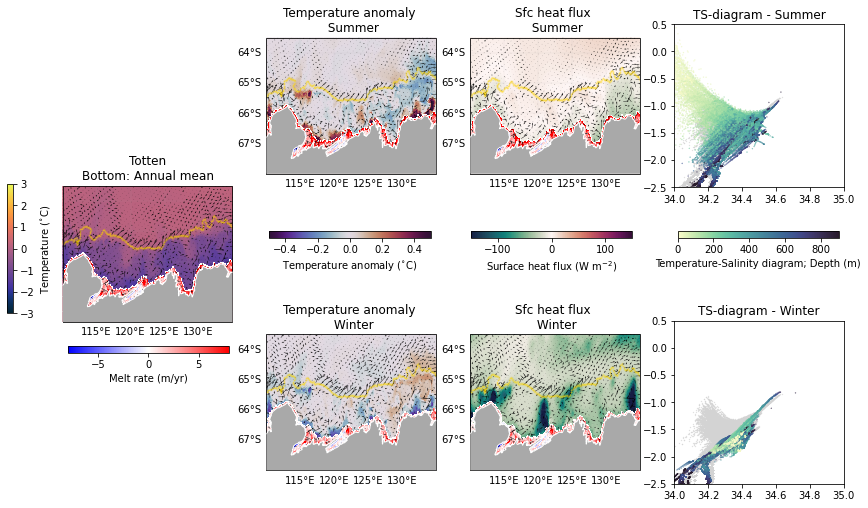

In [115]:
#### %%time # being done by WAOM4_run_maps_Figure4_newTS.py offline. # This uses SUM = JAN-APRIL, WIN = JUN-NOV

## this piece do the maps for Figure 4 (containing annual temp, anom 1month in summer, anom 1 month in winter) + TS-diag for 2 regions (totten x PIG) at SURFACE, MID-DEPTH, BOTTOM sigma layers

slayer=[15, -1, 0]
zname =['Mid-depth','Surface','Bottom']
pname =['mid-depth','surface','bottom']
anomlim=[0.5, 2, 0.5]

for dd in np.arange(2,3):
    # dd=2
    

    win_MM=slice(5,10)
    sum_MM=slice(0,3)
    
    # define subregion:
    # names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
                   # 'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']
    
    # for rr in range(1,2): # for Getz
    for rr in range(8,9): # for Totten

        Pname = names_subreg[rr]

        # define 2d Map vars for plottins: annual, summer month, winter month
        annual_T = temp3d_4km.mean('ocean_time')
        annual_S = salt3d_4km.mean('ocean_time')
        annual_Z = z_rho3d_4km.mean('ocean_time')
        annual_melt = melt_4km.mean('ocean_time')*Melt_fac

        sum_Ta = (temp3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
        sum_T = (temp3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        sum_S = (salt3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        sum_Z = (z_rho3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        
        sum_U = np.nanmean(u_rho_i[sum_MM,:,:], axis=0)
        sum_V = np.nanmean(v_rho_i[sum_MM,:,:], axis=0)
        
        sum_melt = melt_4km.isel(ocean_time=sum_MM).mean('ocean_time')*Melt_fac

        win_Ta = (temp3d_4km.isel(ocean_time=win_MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) # Jul - Anual (- mean winter is colder...)
        win_T = (temp3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        win_S = (salt3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        win_Z = (z_rho3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        win_U = np.nanmean(u_rho_i[win_MM,:,:], axis=0)
        win_V = np.nanmean(v_rho_i[win_MM,:,:], axis=0)
        win_melt = melt_4km.isel(ocean_time=win_MM).mean('ocean_time')*Melt_fac
        
        # shflux
        annual_shf = shflux_4km.mean('ocean_time')
        sum_shf = shflux_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        win_shf = shflux_4km.isel(ocean_time=win_MM).mean('ocean_time')
    
        # get map limits: 
        LonMin=map_limits[rr][0]
        LonMax=map_limits[rr][1]
        LatMin=map_limits[rr][2]
        LatMax=map_limits[rr][3]
            
    
        #### TS-diag related definitions (along the calving front):
        # 2 - sum individual bins:
        mask_LonBins_tmp = mask_LonBins_4km[sind_subreg[rr]:eind_subreg[rr],:]
        mask_LonBins_tmp = np.nansum(mask_LonBins_tmp, axis=0)

        # 3 - multiply ice shelves mask (masked outside it) and Lon Bins:
        newmask_bin = w4_mask_outiceshelf*mask_LonBins_tmp
        # 3b - mask out values that are 0
        mask = (newmask_bin == 1)
        newmask_bin = np.where(mask, newmask_bin, np.nan)  # Replace masked values with NaN

        # 4 - define T/S/Z variables for the TS-plot:
## Annual
        temp_masked_ann = newmask_bin*annual_T
        salt_masked_ann = newmask_bin*annual_S
        Z_masked_ann = newmask_bin*annual_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_ann = temp_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_ann = salt_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_ann = Z_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_ann)
        # 5b -Filter out NaN values
        filt_temp_ann = flat_temp_ann[non_nan_mask]
        filt_salt_ann = flat_salt_ann[non_nan_mask]
        filt_z_rho_ann = flat_z_rho_ann[non_nan_mask]
## Summer:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_sum = newmask_bin*sum_T
        salt_masked_sum = newmask_bin*sum_S
        Z_masked_sum = newmask_bin*sum_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_sum = temp_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_sum = salt_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_sum = Z_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_sum)
        # 5b -Filter out NaN values
        filt_temp_sum = flat_temp_sum[non_nan_mask]
        filt_salt_sum = flat_salt_sum[non_nan_mask]
        filt_z_rho_sum = flat_z_rho_sum[non_nan_mask]
## Winter:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_win = newmask_bin*win_T
        salt_masked_win = newmask_bin*win_S
        Z_masked_win = newmask_bin*win_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaN
        flat_temp_win = temp_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_win = salt_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_win = Z_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_win)
        # 5b -Filter out NaN values
        filt_temp_win = flat_temp_win[non_nan_mask]
        filt_salt_win = flat_salt_win[non_nan_mask]
        filt_z_rho_win = flat_z_rho_win[non_nan_mask]
        
        proj_v = ccrs.PlateCarree()
        proj = ccrs.PlateCarree(central_longitude=0)#-24)
        proj_v2 = ccrs.SouthPolarStereo()
        proj2 = ccrs.SouthPolarStereo()
        
        # fig = plt.figure(figsize=(15,8))
        fig = plt.figure(figsize=(14,10))
        
    
        # if Ross, need to use proj2!
        if rr>10:
            PROJ=proj2
            PROJV=proj_v2
        else:
            PROJ=proj
            PROJV=proj_v
        PROJN=proj_v
        
        ax2 = fig.add_subplot(3,4,5, projection=PROJ) # Anual    
        ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
                       vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=PROJN) 
        
        cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
                          
        ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=2,transform=PROJV)
        ax2.set_title(names_subreg[rr] + '\n' + zname[dd] + ': Annual mean')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        gl.left_labels=False   
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,2, projection=PROJ) # jan, TEMP ANOM
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Summer')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,3, projection=PROJ) # SHFLUX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                       vmin=-150, vmax=150 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2,transform=PROJV)
        ax2.set_title('Sfc heat flux \n Summer')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,6, projection=PROJ) # july temp anom
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Winter')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,7, projection=PROJ) # SHFLX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_shf,
                       vmin=-150, vmax=150 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2,transform=PROJV)
        ax2.set_title('Sfc heat flux \n Winter')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        
        ax3 = fig.add_subplot(2,4,4)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_sum, filt_temp_sum, c=-filt_z_rho_sum, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(sum_S*Mask_tmp_subr,sum_T*Mask_tmp_subr,c=-sum_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Summer')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        ax3 = fig.add_subplot(2,4,8)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_win, filt_temp_win, c=-filt_z_rho_win, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(win_S*Mask_tmp_subr,win_T*Mask_tmp_subr,c=-win_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Winter')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        
        cbar_ax1 = fig.add_axes([0.07, 0.42,  0.006, 0.18])
        fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
        cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax12 = fig.add_axes([0.13, 0.365,  0.16, 0.01])
        fig.colorbar(cm, cax=cbar_ax12, orientation='horizontal')
        cbar_ax12.set_xlabel('Melt rate (m/yr)')#, labelpad=-35)
        
        cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
        fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
        cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01]) 
        fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
        cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)
        
        # cbar_ax1 = fig.add_axes([0.912, 0.2,  0.01, 0.6])
        # fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
        # cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
        cbar_ax1 = fig.add_axes([0.735, 0.525,  0.16, 0.01])
        fig.colorbar(c, cax=cbar_ax1, orientation='horizontal')
        cbar_ax1.set_xlabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
            
        name_fig='waom4_MapsT+SHF_Full-season_' + pname[dd] + '_' + Pname +'.png'
        plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

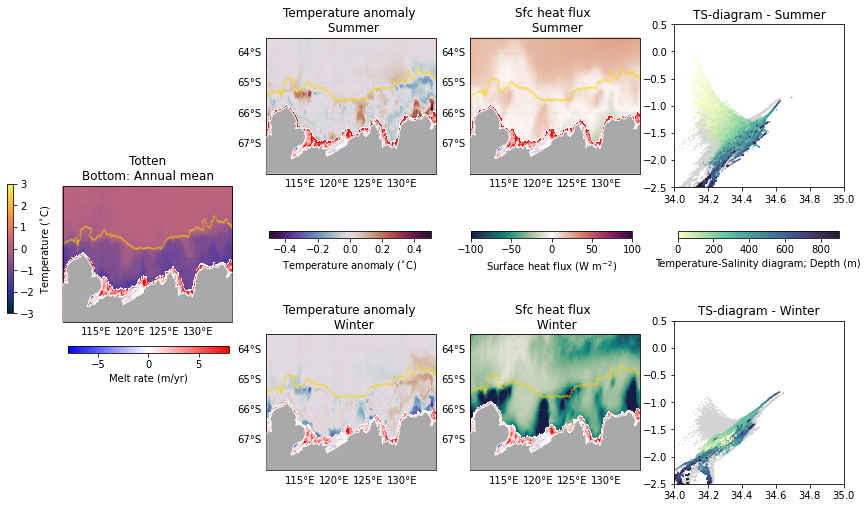

In [77]:
#### %%time # being done by WAOM4_run_maps_Figure4_newTS.py offline. # This test SUM = DEC-APR (need to concat!!) and WIN = MAY-NOV

## this piece do the maps for Figure 4 (containing annual temp, anom 1month in summer, anom 1 month in winter) + TS-diag for 2 regions (totten x PIG) at SURFACE, MID-DEPTH, BOTTOM sigma layers

slayer=[15, -1, 0]
zname =['Mid-depth','Surface','Bottom']
pname =['mid-depth','surface','bottom']
anomlim=[0.5, 2, 0.5]

for dd in np.arange(2,3):
    # dd=2
    

    win_MM=slice(4,10)
    sum_MM=slice(0,3)
    
    
    # define subregion:
    # names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
                   # 'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']
    
    for rr in range(8,9):
        Pname = names_subreg[rr]

        # define 2d Map vars for plottins: annual, summer month, winter month
        annual_T = temp3d_4km.mean('ocean_time')
        annual_S = salt3d_4km.mean('ocean_time')
        annual_Z = z_rho3d_4km.mean('ocean_time')
        annual_melt = melt_4km.mean('ocean_time')*Melt_fac

        sum1_Ta = temp3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        sum2_Ta = temp3d_4km.isel(ocean_time=-1)
        sum_Ta = np.divide(sum1_Ta+sum2_Ta, 2)+273.15 - (temp3d_4km.mean('ocean_time')+273.15)
        sum1_T = temp3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        sum2_T = temp3d_4km.isel(ocean_time=-1)
        sum_T = np.divide(sum1_T+sum2_T, 2)
        sum1_S = salt3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        sum2_S = salt3d_4km.isel(ocean_time=-1)
        sum_S = np.divide(sum1_S+sum2_S, 2)
        sum1_Z = z_rho3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        sum2_Z = z_rho3d_4km.isel(ocean_time=-1)
        sum_Z = np.divide(sum1_Z+sum2_Z, 2)
        # sum_Ta = (temp3d_4km.isel(ocean_time=sum_MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
        # sum_T = (temp3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        # sum_S = (salt3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        # sum_Z = (z_rho3d_4km.isel(ocean_time=sum_MM)).mean('ocean_time')
        
        # sum1_U = u_rho_i[sum1_MM,:,:]
        # sum1_V = v_rho_i[sum1_MM,:,:]
        # sum2_U = u_rho_i[sum2_MM,:,:]
        # sum2_V = v_rho_i[sum2_MM,:,:]
        # sum_U = np.nanmean(sum1_U+sum2_U, axis=0)
        # sum_V = np.nanmean(sum1_V+sum2_V, axis=0)
        
        sum_melt = melt_4km.isel(ocean_time=sum_MM).mean('ocean_time')*Melt_fac

        win_Ta = (temp3d_4km.isel(ocean_time=win_MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) # Jul - Anual (- mean winter is colder...)
        win_T = (temp3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        win_S = (salt3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        win_Z = (z_rho3d_4km.isel(ocean_time=win_MM)).mean('ocean_time')
        # win_U = np.nanmean(u_rho_i[win_MM,:,:])
        # win_V = np.nanmean(v_rho_i[win_MM,:,:])
        win_melt = melt_4km.isel(ocean_time=win_MM).mean('ocean_time')*Melt_fac
        
        # shflux
        annual_shf = shflux_4km.mean('ocean_time')
        sum1_shf = shflux_4km.isel(ocean_time=sum_MM).mean('ocean_time')
        sum2_shf = shflux_4km.isel(ocean_time=-1)
        sum_shf = np.divide(sum1_shf+sum2_shf, 2)
        # print(sum_shf)
        win_shf = shflux_4km.isel(ocean_time=win_MM).mean('ocean_time')
    
        # get map limits: 
        LonMin=map_limits[rr][0]
        LonMax=map_limits[rr][1]
        LatMin=map_limits[rr][2]
        LatMax=map_limits[rr][3]
            
    
        #### TS-diag related definitions (along the calving front):
        # 2 - sum individual bins:
        mask_LonBins_tmp = mask_LonBins_4km[sind_subreg[rr]:eind_subreg[rr],:]
        mask_LonBins_tmp = np.nansum(mask_LonBins_tmp, axis=0)

        # 3 - multiply ice shelves mask (masked outside it) and Lon Bins:
        newmask_bin = w4_mask_outiceshelf*mask_LonBins_tmp
        # 3b - mask out values that are 0
        mask = (newmask_bin == 1)
        newmask_bin = np.where(mask, newmask_bin, np.nan)  # Replace masked values with NaN

        # 4 - define T/S/Z variables for the TS-plot:
## Annual
        temp_masked_ann = newmask_bin*annual_T
        salt_masked_ann = newmask_bin*annual_S
        Z_masked_ann = newmask_bin*annual_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_ann = temp_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_ann = salt_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_ann = Z_masked_ann.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_ann)
        # 5b -Filter out NaN values
        filt_temp_ann = flat_temp_ann[non_nan_mask]
        filt_salt_ann = flat_salt_ann[non_nan_mask]
        filt_z_rho_ann = flat_z_rho_ann[non_nan_mask]
## Summer:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_sum = newmask_bin*sum_T
        salt_masked_sum = newmask_bin*sum_S
        Z_masked_sum = newmask_bin*sum_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaNs
        flat_temp_sum = temp_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_sum = salt_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_sum = Z_masked_sum.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        non_nan_mask = ~np.isnan(flat_temp_sum)
        # 5b -Filter out NaN values
        filt_temp_sum = flat_temp_sum[non_nan_mask]
        filt_salt_sum = flat_salt_sum[non_nan_mask]
        filt_z_rho_sum = flat_z_rho_sum[non_nan_mask]
## Winter:
        # 4 - define T/S/Z variables for the TS-plot:
        temp_masked_win = newmask_bin*win_T
        salt_masked_win = newmask_bin*win_S
        Z_masked_win = newmask_bin*win_Z.transpose('s_rho','eta_rho','xi_rho')
        # 5 -filter & stack example:
        # 5a - Flatten the 3D array to 2D while removing NaN
        flat_temp_win = temp_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_salt_win = salt_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        flat_z_rho_win = Z_masked_win.stack(z=('s_rho', 'eta_rho', 'xi_rho')).values
        # flat_temp_win = np.concatenate(np.concatenate(temp_masked_win))
        # flat_salt_win = np.concatenate(np.concatenate(salt_masked_win))
        # flat_z_rho_win = np.concatenate(np.concatenate(Z_masked_win))
        non_nan_mask = ~np.isnan(flat_temp_win)
        # 5b -Filter out NaN values
        filt_temp_win = flat_temp_win[non_nan_mask]
        filt_salt_win = flat_salt_win[non_nan_mask]
        filt_z_rho_win = flat_z_rho_win[non_nan_mask]
        
        proj_v = ccrs.PlateCarree()
        proj = ccrs.PlateCarree(central_longitude=0)#-24)
        proj_v2 = ccrs.SouthPolarStereo()
        proj2 = ccrs.SouthPolarStereo()
        
        # fig = plt.figure(figsize=(15,8))
        fig = plt.figure(figsize=(14,10))
        
    
        # if Ross, need to use proj2!
        if rr>10:
            PROJ=proj2
            PROJV=proj_v2
        else:
            PROJ=proj
            PROJV=proj_v
        PROJN=proj_v
        
        ax2 = fig.add_subplot(3,4,5, projection=PROJ) # Anual    
        ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
                       vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=PROJN) 
        
        cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
                          
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=PROJV)
        ax2.set_title(names_subreg[rr] + '\n' + zname[dd] + ': Annual mean')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        gl.left_labels=False   
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,2, projection=PROJ) # jan, TEMP ANOM
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Summer')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,3, projection=PROJ) # SHFLUX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                       vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Sfc heat flux \n Summer')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,6, projection=PROJ) # july temp anom
        cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_Ta.isel(s_rho=slayer[dd]),
                       vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Temperature anomaly \n Winter')
        # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        ax2 = fig.add_subplot(2,4,7, projection=PROJ) # SHFLX
        cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_shf,
                       vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
        cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                       transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
        # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
        ax2.set_title('Sfc heat flux \n Winter')
        ax2.set_extent([LonMin, LonMax, LatMin, LatMax], crs=PROJN) # Getz
        x_left, x_right = ax2.get_xlim()
        y_low, y_high = ax2.get_ylim()
        ratio = .8
        ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
        gl=ax2.gridlines(draw_labels=True,linewidth=.1)
        gl.top_labels=False   # suppress top labels
        gl.right_labels=False   # suppress right labels
        plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
        ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
        
        
        ax3 = fig.add_subplot(2,4,4)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_sum, filt_temp_sum, c=-filt_z_rho_sum, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(sum_S*Mask_tmp_subr,sum_T*Mask_tmp_subr,c=-sum_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Summer')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        ax3 = fig.add_subplot(2,4,8)
        cd = ax3.scatter(filt_salt_ann, filt_temp_ann, c='lightgray', s=(22/fig.dpi)**2)
        c = ax3.scatter(filt_salt_win, filt_temp_win, c=-filt_z_rho_win, s=(22/fig.dpi)**2,
                        marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        # c = ax3.scatter(win_S*Mask_tmp_subr,win_T*Mask_tmp_subr,c=-win_Z*Mask_tmp_subr, s=(22/fig.dpi)**2, 
        #                         marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax3.set_title('TS-diagram - Winter')
        ax3.set_xlim([34,35])
        ax3.set_ylim([-2.5,.5])
        # ax3.legend()
        # ax3.set_ylabel('Temperature ($^\circ$C)')
        ax3.set_aspect(0.32)
        
        
        cbar_ax1 = fig.add_axes([0.07, 0.42,  0.006, 0.18])
        fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
        cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax12 = fig.add_axes([0.13, 0.365,  0.16, 0.01])
        fig.colorbar(cm, cax=cbar_ax12, orientation='horizontal')
        cbar_ax12.set_xlabel('Melt rate (m/yr)')#, labelpad=-35)
        
        cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
        fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
        cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)
        
        cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01]) 
        fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
        cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)
        
        cbar_ax1 = fig.add_axes([0.735, 0.525,  0.16, 0.01])
        fig.colorbar(c, cax=cbar_ax1, orientation='horizontal')
        cbar_ax1.set_xlabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
            
        name_fig='waom4_MapsT+SHF_Full-season2_' + pname[dd] + '_' + Pname +'.png'
        plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

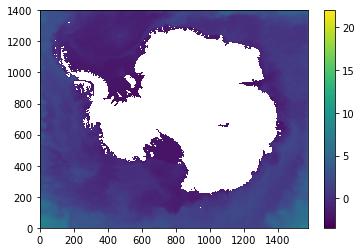

In [75]:
plt.pcolormesh(sum_T.isel(s_rho=-1))
plt.colorbar()

In [120]:
tst = np.concatenate(np.concatenate(temp_masked_sum))
tst.shape

(68355000,)

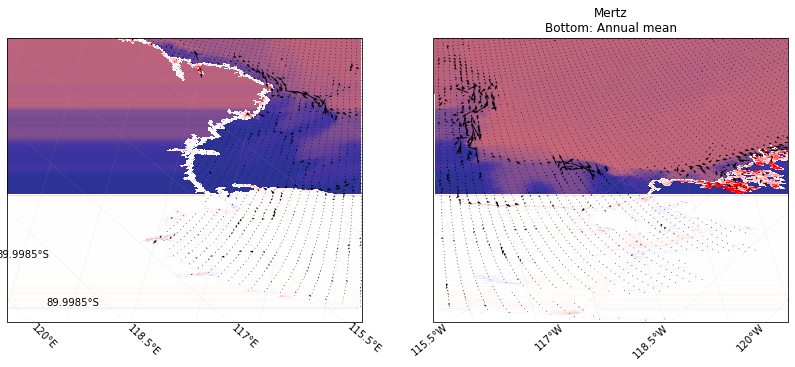

In [46]:
# proj=ccrs.PlateCarree(central_longitude=-34)
proj2=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(14,10))

ax2 = fig.add_subplot(1,2,2, projection=proj2) # Anual    
ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
               vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=proj2) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
               ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
               transform=proj2, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
           np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=proj2)
ax2.set_title(names_subreg[rr] + '\n' + zname[dd] + ': Annual mean')
ax2.set_extent([-180,-145, -85, -69], crs=proj2) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .8
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
# gl.left_labels=False   
# ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white');

ax3 = fig.add_subplot(1,2,1, projection=proj2) # Anual    
ct=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
               vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=proj2) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
               ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
               transform=proj2, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
           np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=proj2)
# ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white');

ax3.set_extent([145,180, -85, -69], crs=proj2) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = .8
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
#

### Manually plotting each Ross figure with vectors:

1. Annual mean temperature

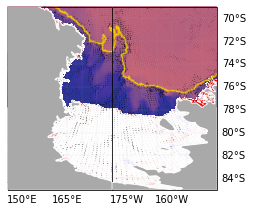

In [86]:
PROJV=ccrs.SouthPolarStereo()
PROJN=ccrs.PlateCarree()

jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5

# ax1 = fig.add_subplot(2,1,1, projection=proj)
# ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
#                    temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)



fig = plt.figure(figsize=(15,8))

ax3 = fig.add_subplot(2,8,1, projection=PROJN) # Anual

ct=ax3.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                  annual_T.isel(s_rho=slayer[dd],xi_rho=slice(ist,ien),eta_rho=slice(jst,jen)).values,
                  vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=PROJN) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
               ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
               transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
           np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=2.5,transform=PROJN)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax3.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

ax3.set_extent([145,180, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = 1.75
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False# suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels

ax2 = fig.add_subplot(2,8,2, projection=PROJN) # Anual

ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
               vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=PROJN) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
               ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
               transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
           np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=2.5,transform=PROJN)
# ax2.set_title(names_subreg[rr] + '\n' + zname[dd] + ': Annual mean')
ax2.set_extent([-180,-145, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1.75
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=True   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax2.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

plt.subplots_adjust(wspace=0, hspace=0)
name_fig='waom4_MapsT+SHF_season_bottom_Ross_Splt1_notitle.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

2. Temp anom summer:

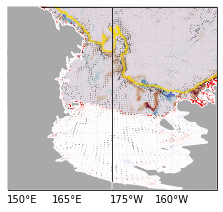

In [87]:
# ax2 = fig.add_subplot(2,4,2, projection=PROJ) # jan, TEMP ANOM
# cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]),
#                vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
# cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
#                ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
#                transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
# ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
# ax2.set_title('Temperature anomaly \n Summer')

fig = plt.figure(figsize=(15,8))

ax3 = fig.add_subplot(2,8,1, projection=PROJN) # Anual

ct=ax3.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                  sum_Ta.isel(s_rho=slayer[dd],xi_rho=slice(ist,ien),eta_rho=slice(jst,jen)).values,
                  vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
                  ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                  transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax3.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

ax3.set_extent([145,180, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = 1.75
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False# suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels

ax2 = fig.add_subplot(2,8,2, projection=PROJN) # Anual

ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]).values,vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# ax2.set_title('Temperature anomaly \n Summer')
ax2.set_extent([-180,-145, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1.75
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax2.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

plt.subplots_adjust(wspace=0, hspace=0)
name_fig='waom4_MapsT+SHF_season_bottom_Ross_Splt2_notitle.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

3. temp anom winter

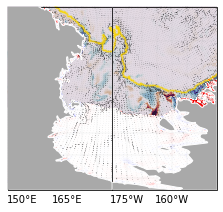

In [88]:
# ax2 = fig.add_subplot(2,4,2, projection=PROJ) # jan, TEMP ANOM
# cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_Ta.isel(s_rho=slayer[dd]),
#                vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 
# cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
#                ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
#                transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
# ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
# ax2.set_title('Temperature anomaly \n Summer')

fig = plt.figure(figsize=(15,8))

ax3 = fig.add_subplot(2,8,1, projection=PROJN) # Anual

ct=ax3.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                  win_Ta.isel(s_rho=slayer[dd],xi_rho=slice(ist,ien),eta_rho=slice(jst,jen)).values,
                  vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
                  ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                  transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax3.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

ax3.set_extent([145,180, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = 1.75
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False# suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels

ax2 = fig.add_subplot(2,8,2, projection=PROJN) # Anual

ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_Ta.isel(s_rho=slayer[dd]).values,vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=PROJN) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# ax2.set_title('Temperature anomaly \n Winter')
ax2.set_extent([-180,-145, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1.75
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax2.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

plt.subplots_adjust(wspace=0, hspace=0)
name_fig='waom4_MapsT+SHF_season_bottom_Ross_Splt3_notitle.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

4. SHF summer

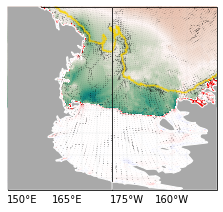

In [93]:
# cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
#                vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
# cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
#                ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
#                transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
# ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
# ax2.set_title('Sfc heat flux anomaly \n Summer')

fig = plt.figure(figsize=(15,8))

ax3 = fig.add_subplot(2,8,1, projection=PROJN) # Anual

ct=ax3.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                  sum_shf.isel(xi_rho=slice(ist,ien),eta_rho=slice(jst,jen)).values,
                  vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
                  ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                  transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax3.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

ax3.set_extent([145,180, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = 1.75
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False# suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels

ax2 = fig.add_subplot(2,8,2, projection=PROJN) # Anual

ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,vmin=-100, vmax=100,cmap=cmocean.cm.curl, transform=PROJN) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# ax2.set_title('Sfc heat flux anomaly \n Summer')
ax2.set_extent([-180,-145, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1.75
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax2.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

plt.subplots_adjust(wspace=0, hspace=0)
name_fig='waom4_MapsT+SHF_season_bottom_Ross_Splt4_notitle.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

5. Sfc heat flux anom Winter

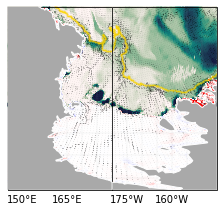

In [92]:
# cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
#                vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 
# cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
#                ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
#                transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
# ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=PROJV)
# ax2.set_title('Sfc heat flux anomaly \n Summer')

fig = plt.figure(figsize=(15,8))

ax3 = fig.add_subplot(2,8,1, projection=PROJN) # Anual

ct=ax3.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                  win_shf.isel(xi_rho=slice(ist,ien),eta_rho=slice(jst,jen)).values,
                  vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 

cm=ax3.pcolormesh(lon_rho_4km,lat_rho_4km,
                  ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                  transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance            
ax3.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);
ax3.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax3.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

ax3.set_extent([145,180, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax3.get_xlim()
y_low, y_high = ax3.get_ylim()
ratio = 1.75
ax3.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax3.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False# suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels

ax2 = fig.add_subplot(2,8,2, projection=PROJN) # Anual

ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_shf,vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=PROJN) 

cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),transform=PROJN, vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],win_U[slayer[dd],::5,::5],win_V[slayer[dd],::5,::5],scale=2.5,transform=PROJN)
# ax2.set_title('Sfc heat flux anomaly \n Winter')
ax2.set_extent([-180,-145, -85, -69], crs=PROJN) # ROSS
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = 1.75
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
gl.left_labels=False   # suppress right labels
gl.bottom_labels=True   # suppress right labels
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax2.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=PROJN);

plt.subplots_adjust(wspace=0, hspace=0)
name_fig='waom4_MapsT+SHF_season_bottom_Ross_Splt5_notitle.png'
plt.savefig(fig_path + name_fig, dpi=300, bbox_inches='tight')

In [54]:
## this piece do the maps for Figure 4 (containing annual temp, anom 1month in summer, anom 1 month in winter) + TS-diag for 2 regions (totten x PIG) at SURFACE, MID-DEPTH, BOTTOM sigma layers


Melt_fac=365.25*86400

slayer=[15, -1, 0]
zname =['Mid-depth','Surface','Bottom']
pname =['mid-depth','surface','bottom']
anomlim=[0.5, 2, 0.5]

# for dd in np.arange(0,2):
dd=1

for mm in np.arange(0,1): #6):
    # define 2d Map vars for plottins: annual, summer month, winter month
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=0+mm)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[0+mm,:,:]) 
    sum_V = (v_rho_i[0+mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=0+mm)*Melt_fac
    
    win_T = (temp3d_4km.isel(ocean_time=6+mm)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) # Jul - Anual (- mean winter is colder...)
    win_U = (u_rho_i[6+mm,:,:]) 
    win_V = (v_rho_i[6+mm,:,:]) 
    win_melt = melt_4km.isel(ocean_time=6+mm)*Melt_fac

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Getz:
    rr=1
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Totten:
    r=8
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      


    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(15,8))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,3,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 

    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
                      
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
               np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title(zname[dd] + ': Annual mean')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False   
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,3,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=slayer[dd]),
                   vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly Summer')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,3,3, projection=proj) # july
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_T.isel(s_rho=slayer[dd]),
                   vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance  
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               win_U[slayer[dd],::5,::5],
               win_V[slayer[dd],::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly Winter')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    
    ## Totten region ---------------------------------------------------------------------------------------
    ax2 = fig.add_subplot(2,3,4, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=slayer[dd]).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,slayer[dd],::5,::5],axis=0),
               np.mean(v_rho_i[:,slayer[dd],::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title(zname[dd] + ': Annual mean')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,3,5, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=slayer[dd]),
                   vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],sum_U[slayer[dd],::5,::5],sum_V[slayer[dd],::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly Summer')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,3,6, projection=proj) # jul
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,win_T.isel(s_rho=slayer[dd]),
                   vmin=-anomlim[dd], vmax=anomlim[dd] ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cma=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, win_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               win_U[slayer[dd],::5,::5],
               win_V[slayer[dd],::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly Winter')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    cbar_ax1 = fig.add_axes([0.01, 0.125,  0.01, 0.76])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax12 = fig.add_axes([0.08, 0.125,  0.01, 0.76])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.91, 0.125,  0.01, 0.76])
    fig.colorbar(cta, cax=cbar_ax2, orientation='vertical')
    cbar_ax2.set_ylabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)
        
    name_fig='waom4_MapsT_season_' + pname[dd] + '_mm=' + str(mm) +'.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

NameError: name 'indexes_subr' is not defined

### testing interp in depth


In [46]:
from scipy.interpolate import interp1d

def interpolate_to_depth(data_2d, depth_levels, target_depth):
    """
    Interpolates 2D arrays with terrain-following vertical levels to a specific depth.

    Parameters:
    data_2d (numpy.ndarray): 3D array with shape (levels, lat, lon)
    depth_levels (numpy.ndarray): 3D array with shape (levels, lat, lon) representing the depths of each level
    target_depth (float): The specific depth to interpolate to

    Returns:
    numpy.ndarray: 2D array with shape (lat, lon) interpolated to the target depth
    """
    levels, lat, lon = data_2d.shape
    interpolated_data = np.zeros((lat, lon))

    for i in range(lat):
        for j in range(lon):
            # Extract the vertical profile for the current grid point
            profile = data_2d[:, i, j]
            depths = depth_levels[:, i, j]

            # Create an interpolation function
            interp_func = interp1d(depths, profile, bounds_error=False, fill_value="extrapolate")

            # Interpolate to the target depth
            interpolated_data[i, j] = interp_func(target_depth)

    return interpolated_data

# Example usage:
# Assuming data_2d and depth_levels are numpy arrays with appropriate shapes
# data_2d = np.random.rand(30, 100, 100)  # Example data
# depth_levels = np.random.rand(30, 100, 100)  # Example depth levels
# target_depth = 50.0  # Example target depth

# interpolated_result = interpolate_to_depth(data_2d, depth_levels, target_depth)
# print(interpolated_result)

In [37]:
# define annual mean:
temp3d_4km_annual = temp3d_4km.mean('ocean_time')
z_rho3d_4km_annual = z_rho3d_4km.mean('ocean_time').transpose('s_rho','eta_rho','xi_rho')

In [38]:
temp3d_4km_annual

<xarray.DataArray 'temp' (s_rho: 31, eta_rho: 1400, xi_rho: 1575)>
array([[[0.9369075 , 1.0077782 , 0.96218944, ..., 0.92427707,
         0.9202406 , 0.9204332 ],
        [0.8660367 , 0.9114957 , 0.8694439 , ..., 0.9262235 ,
         0.922682  , 0.9206261 ],
        [0.85327363, 0.80740124, 0.8113653 , ..., 0.92686623,
         0.9275227 , 0.9307647 ],
        ...,
        [0.9973669 , 0.50845855, 0.51099026, ..., 0.3169885 ,
         0.31903872, 0.33160138],
        [1.1327556 , 0.407421  , 0.50467795, ..., 0.3325029 ,
         0.33354282, 0.34411716],
        [0.78417975, 0.4356041 , 0.46531424, ..., 0.42128885,
         0.41687706, 0.3804971 ]],

       [[0.9433095 , 1.004404  , 0.94672436, ..., 0.92854387,
         0.9221518 , 0.9222896 ],
        [0.8822151 , 0.92601734, 0.8802364 , ..., 0.9322521 ,
         0.9249823 , 0.92242765],
        [0.88346106, 0.8164954 , 0.82951236, ..., 0.93118554,
         0.93337554, 0.93424153],
...
        [3.0977786 , 2.925614  , 2.8975856 , ..., 2.7170722 ,
         2.724745  , 3.0280707 ],
        [3.1366346 , 2.8241844 , 2.8403566 , ..., 2.747116  ,
         2.6428952 , 3.2504327 ],
        [3.23117   , 3.3257055 , 3.1739028 , ..., 2.9600122 ,
         3.2224858 , 3.236459  ]],

       [[7.594813  , 7.963102  , 7.7836266 , ..., 6.9905047 ,
         7.015291  , 7.0457363 ],
        [7.226524  , 7.8376136 , 7.662193  , ..., 6.969566  ,
         7.0222454 , 7.076183  ],
        [7.254126  , 7.7796273 , 7.6226006 , ..., 6.9119096 ,
         6.968843  , 7.011421  ],
        ...,
        [3.1156826 , 2.9785392 , 2.9613674 , ..., 2.7765005 ,
         2.7416809 , 3.3264673 ],
        [3.1835632 , 2.9094403 , 2.9032404 , ..., 2.8217223 ,
         2.7100604 , 3.551691  ],
        [3.310716  , 3.4378684 , 3.3435657 , ..., 3.2278974 ,
         3.4704463 , 3.5110686 ]]], dtype=float32)
Coordinates:
  * s_rho    (s_rho) float64 -0.9839 -0.9516 -0.9194 ... -0.04839 -0.01613
    x_rho    (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    y_rho    (eta_rho, xi_rho) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Dimensions without coordinates: eta_rho, xi_rho

In [ ]:
%%time
otime=0
interpolated_result = interpolate_to_depth(temp3d_4km_annual , -z_rho3d_4km_annual , 500)


ERROR:asyncio:Task exception was never retrieved
future: <Task finished name='Task-22567' coro=<Client._gather.<locals>.wait() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/distributed/client.py:2002> exception=AllExit()>
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.04/lib/python3.9/site-packages/distributed/client.py", line 2011, in wait
    raise AllExit()
distributed.client.AllExit


test 2

In [40]:
from xgcm import Grid

CCS2 = xr.open_zarr(CCS2_store, consolidated=True)

# # Create xgcm grid object
# grid_ccs2 = Grid(CCS2, coords={'X': {'center': 'xh', 'outer': 'xq'},
#                                'Y': {'center': 'yh', 'outer': 'yq'},
#                                'Z': {'center': 's_rho', 'outer': 's_w'}},
#                  periodic=False)

In [39]:
# extract temperature and depth for a given time
# snapshot = CCS2.isel(time=50)
temp_snapshot = temp3d_4km_annual   #snapshot['temp']
depth_snapshot = z_rho3d_4km_annual    #snapshot['z_rho']

# compute temperature at 100 meters depth using xgcm.transform
temp_100m = grid_ccs2.transform(temp_snapshot, 'Z', np.array([-100]),
                                target_data=depth_snapshot,
                                method='linear')


NameError: name 'grid_ccs2' is not defined

In [ ]:
print(temp3d_4km[otime, :].shape, z_rho3d_4km[otime, :].transpose('s_rho','eta_rho','xi_rho').shape)

In [42]:
## previous attempt of depth interpolation...
# %%time
# # Assuming temp_data is your temperature xarray.DataArray
# # and depth_data is your depth xarray.DataArray


# depth_target = -500  # The depth you want to interpolate to (500 meters)

# otime=0
# # Create an empty array to hold the interpolated temperature values
# interp_temp = np.full((temp3d_4km[otime,:].shape[1], temp3d_4km[otime,:].shape[2]), np.nan)

# print(interp_temp.shape)


# # Loop through each grid point and interpolate
# for i in range(temp3d_4km.shape[1]):
#     for j in range(temp3d_4km.shape[2]):
#         print(i,j)
#         depth_profile = z_rho3d_4km[otime, i, j, :]
#         temp_profile = temp3d_4km[otime, :, i, j]
        
#         if np.any(np.isnan(depth_profile)) or np.any(np.isnan(temp_profile)):
#             print('This i,j is nan!')
#             continue  # Skip if there are NaNs in the profile
        
#         # Find the indices of the two layers surrounding the target depth
#         idx_above = np.where(depth_profile <= depth_target)[0].max()
#         idx_below = np.where(depth_profile > depth_target)[0].min()
        
#         # Linear interpolation
#         if idx_above == idx_below:
#             interp_temp[i, j] = temp_profile[idx_above]
#         else:
#             depth_above = depth_profile[idx_above]
#             depth_below = depth_profile[idx_below]
#             temp_above = temp_profile[idx_above]
#             temp_below = temp_profile[idx_below]
            
#             interp_temp[i, j] = temp_above + (temp_below - depth_above) * (temp_below - temp_above) / (depth_below - depth_above)



(1400, 1575)
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9


2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,289 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,290 - distributed.nanny - ERROR - Worker process died unexpectedly


ValueError: setting an array element with a sequence.

Process Dask Worker process (from Nanny):
2024-11-28 14:14:33,408 - distributed.nanny - ERROR - Worker process died unexpectedly
2024-11-28 14:14:33,409 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2024-11-28 14:14:33,409 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
2024-11-28 14:14:33,409 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
2024-11-28 14:14:33,409 - distributed.nanny - ERROR - Worker process died unexpectedly
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker process (from Nanny):
Process Dask Worker

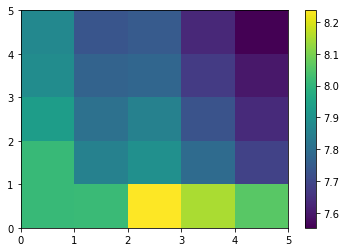

In [82]:
plt.pcolormesh(temp3d_4km[otime,26,0:5,0:5])
plt.colorbar()

(0.0, 6.0)

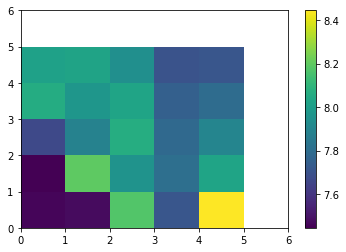

In [71]:
plt.pcolormesh(interp_temp)
plt.colorbar()
plt.xlim(0,6)
plt.ylim(0,6)

In [84]:
# # Create a DataArray for the interpolated temperature data
interp_temp3d_4km = xr.DataArray(interp_temp, coords=[temp3d_4km.coords['eta_rho'], temp3d_4km.coords['xi_rho']], dims=['eta_rho', 'xi_rho'])

# Add the interpolated data to the original dataset (optional)
dataset = temp3d_4km.to_dataset(name='temp')
dataset['interp_temp_at_500m'] = interp_temp3d_4km

In [85]:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
dataset.to_netcdf(files_path + 'WAOM4_temp_500m_mm=0_tst.nc', mode='w', format="NETCDF4")


### make movie of Figure 4:


In [139]:
#### Make a movie # 1yr: Getz + Totten
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    # MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    MM=mm # for 1YRS:
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM)*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM)

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Thwaites-PIG:
    rr=1
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Totten:
    r=8
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(14,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=0).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    # ax2.set_title('PIG-Thwaites \n Mid-depth: Annual temp.')
    ax2.set_title('Getz \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=0),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    # ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[1])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ## Totten region ---------------------------------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,5, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=0).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr')
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Totten \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,6, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=0),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,7, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[8])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01]) 
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    # name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_Getz-Totten.png'
    name_fig='waom4_MapsT_month-anom_bottom_mm=' + str(mm) +'_Getz-Totten.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

KeyboardInterrupt: 

In [137]:
#### Make a movie # 1yr: Sulz x Amery
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    # MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    MM=mm # for 1YRS:
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM)*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM)

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Thwaites-PIG:
    rr=0
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Totten:
    r=6
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(14,10))
    
    ## Sulz region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sulzberger \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-165, -135, -79, -74], crs=ccrs.PlateCarree()) # Sulzberger
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-165, -135, -79, -74], crs=ccrs.PlateCarree()) # Sulzberger
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-165, -135, -79, -74], crs=ccrs.PlateCarree()) # Sulzberger
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[0])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ## Amery region ---------------------------------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,5, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr')
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Amery \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([65, 85, -74, -65], crs=ccrs.PlateCarree()) # Amery
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,6, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([65, 85, -74, -65], crs=ccrs.PlateCarree()) # Amery
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,7, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([65, 85, -74, -65], crs=ccrs.PlateCarree()) # Amery
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[6])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01])
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_Sulz-Amery.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

KeyboardInterrupt: 

In [ ]:
#### Make a movie # 1yr: PIB x Fimbul
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    # MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    MM=mm # for 1YRS:
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM)*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM)

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Thwaites-PIG:
    rr=2
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Totten:
    r=5
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(14,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    # ax2.set_title('PIG-Thwaites \n Mid-depth: Annual temp.')
    ax2.set_title('PIB \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-120, -90, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-120, -90, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-120, -90, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title('PIB')
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ## Fimbul region ---------------------------------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,5, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr')
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Fimbul \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-15, 15, -73.5, -69], crs=ccrs.PlateCarree()) # Fimbul
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,6, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-15, 15, -73.5, -69], crs=ccrs.PlateCarree()) # Fimbul
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,7, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-15, 15, -73.5, -69], crs=ccrs.PlateCarree()) # Fimbul
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[5])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01])
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_PIG-Fimbul.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

In [ ]:
#### Make a movie # 1yr: Bell+FRIS
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    # MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    MM=mm # for 1YRS:
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM)*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM)

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: BellS:
    rr=3
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: FRIS:
    r=4
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(14,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    # ax2.set_title('PIG-Thwaites \n Mid-depth: Annual temp.')
    ax2.set_title('BellS/FRIS \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-100, -17, -83.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen+FRIS
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-100, -17, -83.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen+FRIS
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-100, -17, -83.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen+FRIS
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[3])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[4])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01])
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_BellS-FRIS.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

In [ ]:
#### Make a movie # 1yr: Mertz+Ross x Shacklethon
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    # MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    MM=mm # for 1YRS:
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM)+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM)*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM)

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Mertz-Ross
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[9,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[11,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[9,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[11,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[9,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[11,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Shackleton
    rr=7
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.SouthPolarStereo()

    fig = plt.figure(figsize=(14,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.SouthPolarStereo())
    ax2.set_title('Mertz-Ross \n Mid-depth: Annual temp.')
    ax2.set_extent([-220,-160, -84, -67], crs=ccrs.PlateCarree()) # Ross
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree())
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.SouthPolarStereo())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_extent([-215,-160, -84, -67], crs=ccrs.PlateCarree()) # Ross; need proj = ccrs.PlateCarree()
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree())
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.SouthPolarStereo())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_extent([-215,-160, -84, -67], crs=ccrs.PlateCarree()) # Ross; need proj = ccrs.PlateCarree()
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title('Mertz-Ross')
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ## Shackleton region ---------------------------------------------------------------------------------------
    proj = ccrs.PlateCarree(central_longitude=0)

    ax2 = fig.add_subplot(2,4,5, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr')
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Shackleton \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([80, 110, -68.1, -63], crs=ccrs.PlateCarree()) # Shackleton
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,6, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([80, 110, -68.1, -63], crs=ccrs.PlateCarree()) # Shackleton
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,7, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([80, 110, -68.1, -63], crs=ccrs.PlateCarree()) # Shackleton
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[7])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01])
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_Mertz+Ross-Shack.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

NameError: name 'annual_Z' is not defined

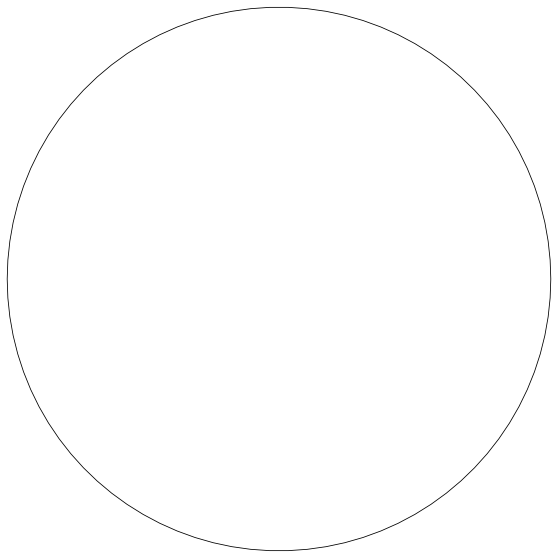

In [77]:
# proj = ccrs.PlateCarree()
proj = ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(14,10))

## PIG region ------------------------------------------------------------
ax2 = fig.add_subplot(1,1,1, projection=proj) # Anual
ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_Z.isel(s_rho=5).values, vmin=-700, vmax=-300,
               cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                   ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                   transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
           np.mean(u_rho_i[:,15,::5,::5],axis=0),
           np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.SouthPolarStereo())
ax2.set_extent([-220,-160, -84, -67], crs=ccrs.PlateCarree()) # Ross; need proj = ccrs.PlateCarree()
x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .8
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
# gl.left_labels=False
plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
plt.colorbar(ct)

In [151]:
import xesmf as xe

In [160]:
salt_4km_CF

<xarray.Variable (ocean_time: 365, s_rho: 31, contour_index_array: 9018)>
[102038670 values with dtype=float64]

In [ ]:
#### Make a movie: 3YRS
month=['January','February','March','April','May','June',
       'July','August','September','October','November','December']

for mm in np.arange(0,12):

    MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac
    
    sum_T = (temp3d_4km.isel(ocean_time=MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_U = (u_rho_i[mm,:,:]) 
    sum_V = (v_rho_i[mm,:,:]) 
    sum_melt = melt_4km.isel(ocean_time=MM).mean('ocean_time')*Melt_fac

    # shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM).mean('ocean_time')    

    #### TS-diag related definitions (along the calving front):    
    # define monthly average: Thwaites-PIG:
    S_1 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_1 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_1 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[2,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    # define monthly average: Totten:
    S_2 = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    T_2 = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
    Z_2 = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[8,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')      

    ### BEGIN FIGURE!
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(14,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('PIG-Thwaites \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,2, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,3, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,4)
    c = ax3.scatter(S_1,T_1,c=Z_1, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[2])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    ## Totten region ---------------------------------------------------------------------------------------
    ax2 = fig.add_subplot(2,4,5, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_T.isel(s_rho=15).values,
                   vmin=-3, vmax=3 ,cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr')
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               np.mean(u_rho_i[:,15,::5,::5],axis=0),
               np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Totten \n Mid-depth: Annual temp.')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
    
    ax2 = fig.add_subplot(2,4,6, projection=proj) # jan
    cta=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_T.isel(s_rho=15),
                   vmin=-.5, vmax=.5 ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Anomaly temp., ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,4,7, projection=proj) # SHFLUX
    cts=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-100, vmax=100 ,cmap=cmocean.cm.curl, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, sum_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') 
    ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
               sum_U[15,::5,::5],
               sum_V[15,::5,::5],scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('Sfc heat flux, ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax3 = fig.add_subplot(2,4,8)
    c = ax3.scatter(S_2,T_2,c=Z_2, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax3.set_title(names_subreg[8])
    ax3.set_xlim([34,35])
    ax3.set_ylim([-2.5,.5])
    # ax3.legend()
    # ax3.set_ylabel('Temperature ($^\circ$C)')
    ax3.set_aspect(0.32)
    
    cbar_ax1 = fig.add_axes([0.07, 0.62,  0.006, 0.18])
    fig.colorbar(ct, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature ($^{\circ}$C)')#, labelpad=-35)
    
    cbar_ax12 = fig.add_axes([0.07, 0.215,  0.006, 0.18])
    fig.colorbar(cm, cax=cbar_ax12, orientation='vertical')
    cbar_ax12.set_ylabel('Melt rate (m/yr)')#, labelpad=-35)
    
    cbar_ax2 = fig.add_axes([0.33, 0.525,  0.16, 0.01])
    fig.colorbar(cta, cax=cbar_ax2, orientation='horizontal')
    cbar_ax2.set_xlabel('Temperature anomaly ($^{\circ}$C)')#, labelpad=-35)

    cbar_ax3 = fig.add_axes([0.53, 0.525,  0.16, 0.01])
    fig.colorbar(cts, cax=cbar_ax3, orientation='horizontal')
    cbar_ax3.set_xlabel('Surface heat flux (W m$^{-2}$)')#, labelpad=-35)

    cbar_ax1 = fig.add_axes([0.91, 0.2,  0.01, 0.6])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Temperature-Salinity diagram; Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_MapsT_month-anom_mid-depth_mm=' + str(mm) +'_3yrs-avg.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight',facecolor='white', transparent=False)

In [57]:
# Define regions with peak of basal melting:
# 150W, Ross
# 130W, Getz
# 105W, Thwaites
# 60-80W, George VI
# 45W, Ronne
# 0, Fimbulisen
# 80E, Amery
# 100-110E, Shackleton
# 110-125E, Totten
# 145-155E, Mertz

# # old 
# names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','Ronne',
#                'Fimbul','Amery','Shackleton','Totten','Mertz']
# sind_subreg = [7, 14, 24, 33, 50, 63, 93, 99, 104, 114]
# eind_subreg = [13, 18, 27, 42, 55, 69, 98, 103, 108, 119]

# - fix after inspecting each sub-regions (10/10/24):
sind_subreg = [7, 14, 23, 33, 45, 75, 100, 108, 114, 124, 135, 0]
eind_subreg = [12, 21, 27, 37, 67, 80, 104, 113, 118, 129, 140, 4]

max_BM = [3, 2, 1, 2.5, 1, 1, 1,
          3.8, 2, 2, 1, 1]        # max ylim for basal melting plot (vary b/w regions)

names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
               'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']

max_BM = [3, 2, 1, 2.5, 1, 1, 1,
          3.8, 2, 2, 1, 1]        # max ylim for basal melting plot (vary b/w regions)

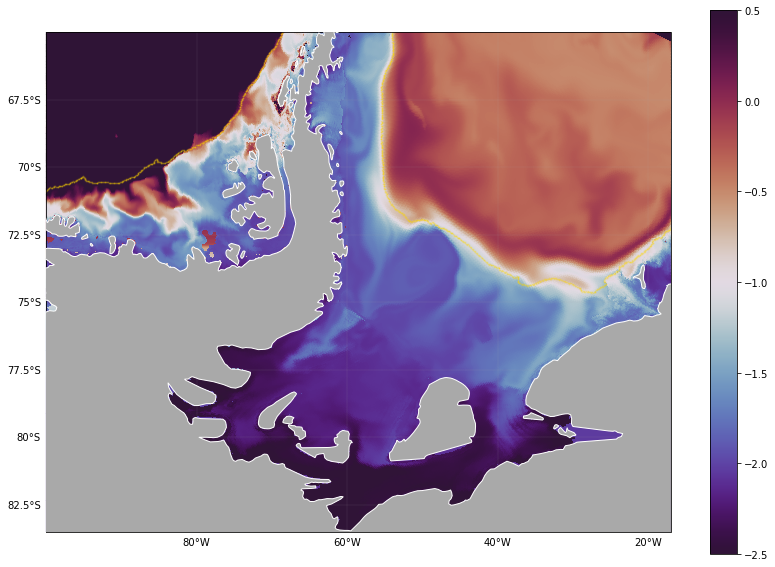

In [47]:
proj = ccrs.PlateCarree(central_longitude=0) # for all other subregions
# proj = ccrs.PlateCarree(central_longitude=-30) # for Ross only

fig = plt.figure(figsize=(14,10))
ax2 = fig.add_subplot(1,1,1, projection=proj) 
cz=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,temp3d_4km.isel(ocean_time=3,s_rho=20),vmin=-2.5, vmax=.5
                ,cmap='twilight_shifted', transform=ccrs.PlateCarree()) 
plt.colorbar(cz)

# ax2.set_extent([-165, -135, -79, -74], crs=ccrs.PlateCarree()) # Sulzberger
# ax2.set_extent([-140, -110, -71, -76], crs=ccrs.PlateCarree()) # Getz
# ax2.set_extent([-120, -90, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
## ax2.set_extent([-100, -65, -74.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen
ax2.set_extent([-100, -17, -83.5, -65], crs=ccrs.PlateCarree()) # Bellingshausen+FRIS
# ax2.set_extent([-15, 15, -73.5, -69], crs=ccrs.PlateCarree()) # Fimbul
# ax2.set_extent([65, 85, -74, -65], crs=ccrs.PlateCarree()) # Amery
# ax2.set_extent([80, 110, -68.1, -63], crs=ccrs.PlateCarree()) # Shackleton
# ax2.set_extent([110, 135, -68, -63.5], crs=ccrs.PlateCarree()) # Totten region
# ax2.set_extent([140, 155, -71, -64.6], crs=ccrs.PlateCarree()) # Mertz
# ax2.set_extent([-205, -140, -86, -68], crs=ccrs.PlateCarree()) # Ross; need proj = ccrs.PlateCarree(central_longitude=-30)
# define Mertz + Ross!!!

x_left, x_right = ax2.get_xlim()
y_low, y_high = ax2.get_ylim()
ratio = .8
ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
gl=ax2.gridlines(draw_labels=True,linewidth=.1)
gl.top_labels=False   # suppress top labels
gl.right_labels=False   # suppress right labels
# gl.left_labels=False
ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

# add 1500m isobath
ax2.scatter(lon_along_4km, lat_along_4km, s=1., alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());



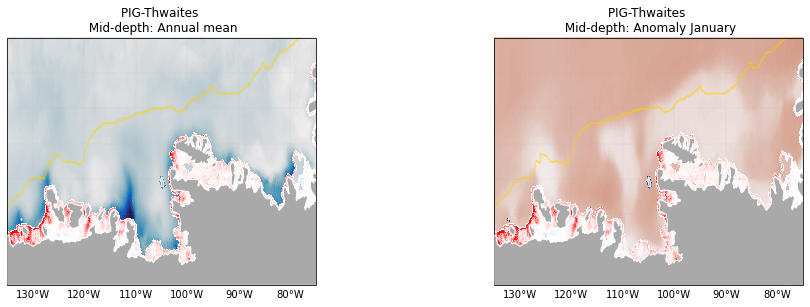

In [39]:
# shflux_4km

for mm in np.arange(0,1):

    MM = [mm, mm+12, mm+24] # FOR 3YRS MOVIE:
    
    annual_T = temp3d_4km.mean('ocean_time')
    annual_melt = melt_4km.mean('ocean_time')*Melt_fac

    sum_T = (temp3d_4km.isel(ocean_time=MM).mean('ocean_time')+273.15) - (temp3d_4km.mean('ocean_time')+273.15) #  Jan - Annual (+ means summer is warmer than mean)
    sum_melt = melt_4km.isel(ocean_time=MM).mean('ocean_time')*Melt_fac
    
    # add shflux
    annual_shf = shflux_4km.mean('ocean_time')
    sum_shf = shflux_4km.isel(ocean_time=MM).mean('ocean_time')
    
    proj = ccrs.PlateCarree(central_longitude=0)#-24)
    fig = plt.figure(figsize=(16,10))
    
    ## PIG region ------------------------------------------------------------
    ax2 = fig.add_subplot(2,2,1, projection=proj) # Anual
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,annual_shf,
                   vmin=-150, vmax=150 ,cmap=cmocean.cm.balance, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
    #            np.mean(u_rho_i[:,15,::5,::5],axis=0),
    #            np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('PIG-Thwaites \n Mid-depth: Annual mean')
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')

    ax2 = fig.add_subplot(2,2,2, projection=proj) # monthly anom.
    ct=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,sum_shf,
                   vmin=-150, vmax=150,cmap=cmocean.cm.balance, transform=ccrs.PlateCarree()) 
    cm=ax2.pcolormesh(lon_rho_4km,lat_rho_4km,
                       ma.masked_where(contour_masked_above_CF_4km == -1000, annual_melt),
                       transform=ccrs.PlateCarree(), vmin=-8, vmax=8, cmap='bwr') #, cmap=cmocean.cm.balance
    # ax2.quiver(lon_rho_4km[::5,::5],lat_rho_4km[::5,::5],
    #            np.mean(u_rho_i[:,15,::5,::5],axis=0),
    #            np.mean(v_rho_i[:,15,::5,::5],axis=0),scale=5,transform=ccrs.PlateCarree())
    ax2.set_title('PIG-Thwaites \n Mid-depth: Anomaly ' + month[mm])
    ax2.set_xlim(200,450)
    ax2.set_ylim(370,800)
    ax2.set_extent([-135, -75, -76, -69], crs=ccrs.PlateCarree()) # PIG-Thwaites region
    x_left, x_right = ax2.get_xlim()
    y_low, y_high = ax2.get_ylim()
    ratio = .8
    ax2.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
    gl=ax2.gridlines(draw_labels=True,linewidth=.1)
    gl.top_labels=False   # suppress top labels
    gl.right_labels=False   # suppress right labels
    gl.left_labels=False
    plt.scatter(lon_along_4km,lat_along_4km, s=.8, alpha=0.2, color='gold',label='1500m isobath', transform=ccrs.PlateCarree());
    ax2.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')


### plotting maps first to get it right - takes time

CPU times: user 7min 9s, sys: 49.3 s, total: 7min 59s
Wall time: 7min 1s


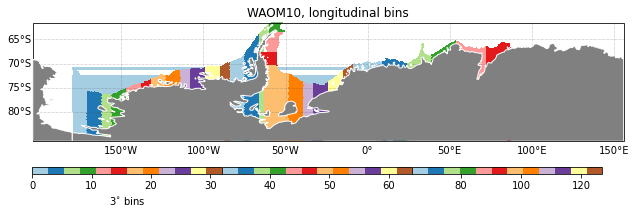

In [37]:
%%time

fig = plt.figure(figsize=(12,10))

# 1) map:
jst= 40
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
# call cartopy projection
proj = ccrs.PlateCarree(central_longitude=0)
ax1 = fig.add_subplot(4,1,1, projection=proj)

for ii in np.arange(0,32):
    ct1=plt.pcolormesh(lon_rho[jst:jen,ist:ien].values,lat_rho[jst:jen,ist:ien].values,
                       mask_LonBins[ii,jst:jen,ist:ien]*mask_land[jst:jen,ist:ien]*mask_shelf[jst:jen,ist:ien]*ii, transform=ccrs.PlateCarree(), cmap='Paired', vmin=0, vmax=32)
for ii in np.arange(32,64):
    ct2=plt.pcolormesh(lon_rho[jst:jen,ist:ien].values,lat_rho[jst:jen,ist:ien].values,
                       mask_LonBins[ii,jst:jen,ist:ien]*mask_land[jst:jen,ist:ien]*mask_shelf[jst:jen,ist:ien]*ii, transform=ccrs.PlateCarree(), cmap='Paired', vmin=32, vmax=64)
for ii in np.arange(64,96):
    ct3=plt.pcolormesh(lon_rho[jst:jen,ist:ien].values,lat_rho[jst:jen,ist:ien].values,
                       mask_LonBins[ii,jst:jen,ist:ien]*mask_land[jst:jen,ist:ien]*mask_shelf[jst:jen,ist:ien]*ii, transform=ccrs.PlateCarree(), cmap='Paired', vmin=64, vmax=127)
for ii in np.arange(96,127):
    ct4=plt.pcolormesh(lon_rho[jst:jen,ist:ien].values,lat_rho[jst:jen,ist:ien].values,
                       mask_LonBins[ii,jst:jen,ist:ien]*mask_land[jst:jen,ist:ien]*mask_shelf[jst:jen,ist:ien]*ii, transform=ccrs.PlateCarree(), cmap='Paired', vmin=64, vmax=127)

ax1.set_title('WAOM10, longitudinal bins')

# plt.colorbar(ct1, location="right")
cbar_ax1 = fig.add_axes([0.17, 0.67,  0.22, 0.01])
fig.colorbar(ct1, cax=cbar_ax1, orientation='horizontal')
cbar_ax1.set_xlabel('3$^{\circ}$ bins')#, labelpad=-35)

cbar_ax2 = fig.add_axes([0.39, 0.67,  0.22, 0.01])
fig.colorbar(ct2, cax=cbar_ax2, orientation='horizontal')

cbar_ax3 = fig.add_axes([0.61, 0.67,  0.22, 0.01])
fig.colorbar(ct3, cax=cbar_ax3, orientation='horizontal')



gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlabels_top = False
gl.ylabels_left = True
gl.xlines = True
gl.xlocator = mticker.FixedLocator([-150, -100, -50, 0, 50, 100, 150])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, edgecolor='white', facecolor='gray')
ax1.set_extent([-180, 180, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .2
ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)


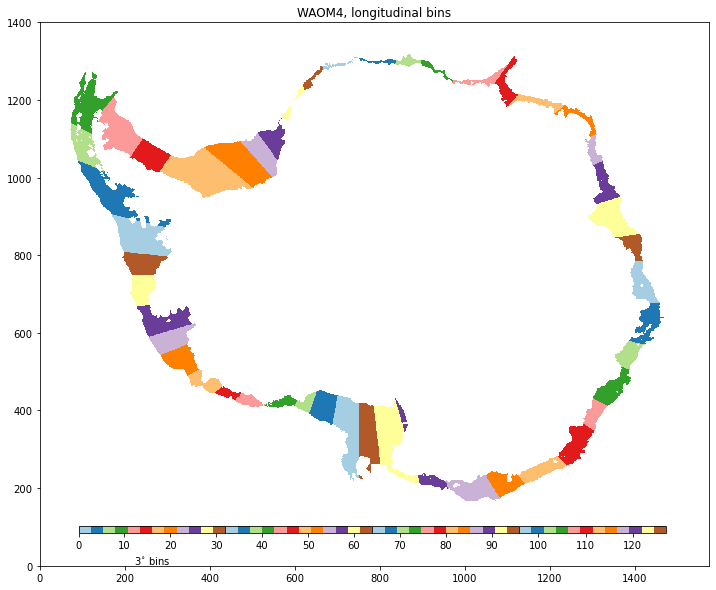

In [38]:
fig = plt.figure(figsize=(12,10))

ax1 = fig.add_subplot(1,1,1)
for ii in np.arange(0,32):
    ct1=plt.pcolormesh(
                       mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf*ii,  cmap='Paired', vmin=0, vmax=32)
for ii in np.arange(32,64):
    ct2=plt.pcolormesh(
                       mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf*ii, cmap='Paired', vmin=32, vmax=64)
for ii in np.arange(64,96):
    ct3=plt.pcolormesh(
                       mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf*ii, cmap='Paired', vmin=64, vmax=96)
for ii in np.arange(96,141):
    ct4=plt.pcolormesh(
                       mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf*ii, cmap='Paired', vmin=96, vmax=141)

ax1.set_title('WAOM4, longitudinal bins')

# plt.colorbar(ct1, location="right")
cbar_ax1 = fig.add_axes([0.17, 0.17,  0.17, 0.01])
fig.colorbar(ct1, cax=cbar_ax1, orientation='horizontal')
cbar_ax1.set_xlabel('3$^{\circ}$ bins')#, labelpad=-35)

cbar_ax2 = fig.add_axes([0.34, 0.17,  0.17, 0.01])
fig.colorbar(ct2, cax=cbar_ax2, orientation='horizontal')

cbar_ax3 = fig.add_axes([0.51, 0.17,  0.17, 0.01])
fig.colorbar(ct3, cax=cbar_ax3, orientation='horizontal')

cbar_ax4 = fig.add_axes([0.68, 0.17,  0.17, 0.01])
fig.colorbar(ct4, cax=cbar_ax4, orientation='horizontal')

name_fig='waom4_LonLatBins-v2_regional_SM-Figure1.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')


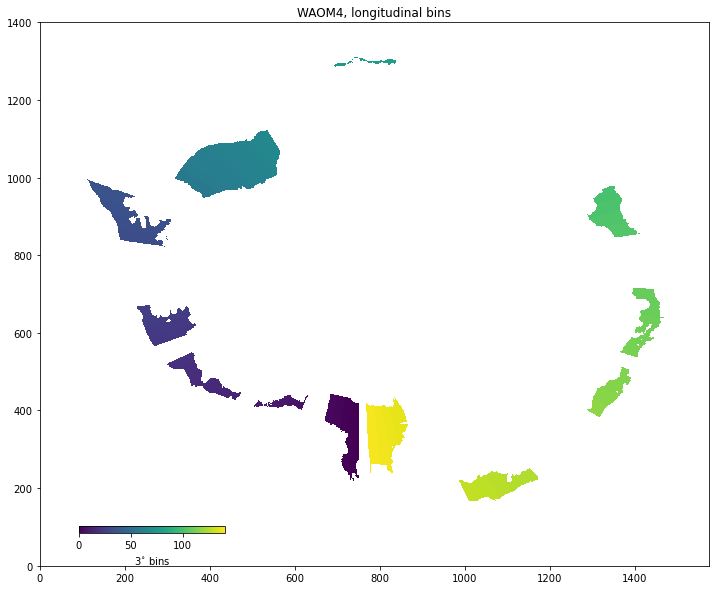

In [79]:
# plot map only with selected bins
fig = plt.figure(figsize=(12,10))

sind_subreg

ax1 = fig.add_subplot(1,1,1)
for rr in range(12):

    for ii in np.arange(sind_subreg[rr],eind_subreg[rr]):
        ct1=plt.pcolormesh(
                           mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf*ii, vmin=0, vmax=141) #*w4_mask_zice
   #*w4_mask_zice
ax1.set_title('WAOM4, longitudinal bins')

# plt.colorbar(ct1, location="right")
cbar_ax1 = fig.add_axes([0.17, 0.17,  0.17, 0.01])
fig.colorbar(ct1, cax=cbar_ax1, orientation='horizontal')
cbar_ax1.set_xlabel('3$^{\circ}$ bins')#, labelpad=-35)

name_fig='waom4_LonLatBins-v2_regional_SM-Figure1-with_subregions.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')


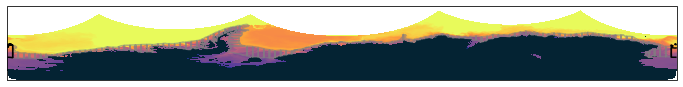

In [255]:
# tets maps of OHC + contour of long-bins:
Melt_fac=365.25*86400
proj = ccrs.PlateCarree(central_longitude=0)
fig = plt.figure(figsize=(12,15))

jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5
ax1 = fig.add_subplot(4,1,1, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)

for ii in np.arange(1,126): # 1-125 is fine, issue is the ones closer to 180E/W??
    tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
    tmp_filled = np.nan_to_num(tmp, nan=0)
    ct1=plt.contour(lon_rho_4km,lat_rho_4km,
                    tmp_filled, levels=[0.5], transform=ccrs.PlateCarree(), colors='gray', linewidth=0.5, alpha=0.55)


ien=750
ii=0
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
ct1=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='black')
ist=750
ien=-1
ii=-1
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
ct1=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='black')



In [34]:

dayofmonth

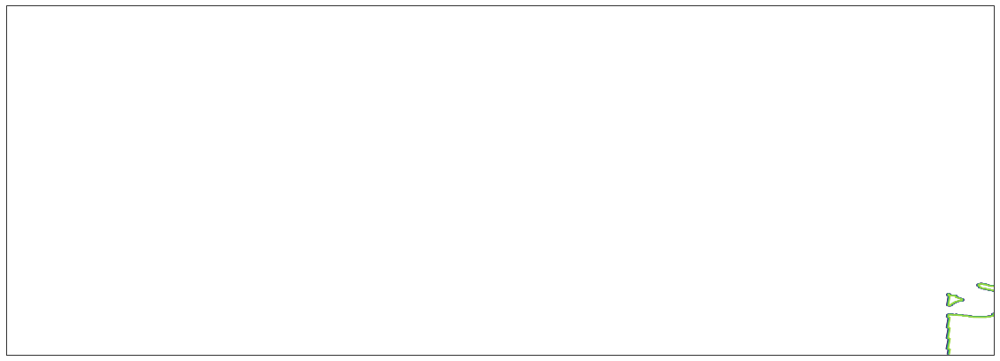

In [253]:
jst = 100
jen = 350
ist = 750
ien = -1

proj = ccrs.PlateCarree(central_longitude=0)
fig = plt.figure(figsize=(20,15))
ax1 = fig.add_subplot(1,1,1, projection=proj)

ii=-1
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)

ct1=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], transform=ccrs.PlateCarree())#@, colors='black')


### --- Define subregions and plot Fig 1-3:

In [36]:
# # Define regions with peak of basal melting:
# # 150W, Ross
# # 130W, Getz
# # 105W, Thwaites
# # 60-80W, George VI
# # 45W, Ronne
# # 0, Fimbulisen
# # 80E, Amery
# # 100-110E, Shackleton
# # 110-125E, Totten
# # 145-155E, Mertz

# # old (before lonlatbins-v2): 
# # names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','Ronne',
# #                'Fimbul','Amery','Shackleton','Totten','Mertz']
# # sind_subreg = [7, 14, 24, 33, 50, 63, 93, 99, 104, 114]
# # eind_subreg = [13, 18, 27, 42, 55, 69, 98, 103, 108, 119]

# # - new (lonlatbins-v2): 
# # sind_subreg = [7, 14, 24, 34, 60, 75, 104, 110, 114, 124, 135]
# # eind_subreg = [13, 19, 27, 41, 66, 79, 108, 113, 118, 129, 139]
# # - fix after inspecting each sub-regions (10/10/24):
# sind_subreg = [7, 14, 23, 33, 49, 75, 100, 108, 114, 124, 135, 0]
# eind_subreg = [12, 21, 27, 37, 67, 80, 104, 113, 118, 129, 140, 4]

# max_BM = [3, 2, 1, 2.5, 1, 1, 1,
#           3.8, 2, 2, 1, 1]        # max ylim for basal melting plot (vary b/w regions)

# names_subreg = ['Sulzberger','Getz','Thwaites-PIG','Bellingshausen','FRIS',
#                'Fimbul','Amery','Shackleton','Totten','Mertz','Ross1','Ross2']
# max_BM = [3, 2, 1, 2.5, 1, 1, 1,
#           3.8, 2, 2, 1, 1,1]        # max ylim for basal melting plot (vary b/w regions)

# ## obtain temp/salt values for each sub-regions selected

# indexes_subr = np.empty((12,2))
# for bb in range(12):
#     # first define length of bins for each subregion:
#     dif_bins = (eind_subreg[bb] - sind_subreg[bb])+1
#     # print(bb, dif_bins)
#     masks_comb = np.empty((dif_bins,1400,1575))
    
#     for gg in range(0,dif_bins):
#         # print(gg)
#         indtmp = sind_subreg[bb]+gg
#         mask_tmp = mask_LonBins_4km[indtmp,:]
#         # mask_tmp.shape
#         masks_comb[gg,:] = mask_tmp
#         del mask_tmp, indtmp
#         tmp_bin = contour_masked_above_CF_4km*masks_comb[gg,:]*w4_mask_land*w4_mask_shelf #*w4_mask_zice
#         # Create a mask for values that are 0 or -1000 (i.e., >0); only leave numbered values along CF contour
#         mask = (tmp_bin > 0)
#         masked_tmp_bin = np.where(mask, tmp_bin, np.nan)  # Replace masked values with NaN
#         # Obtain first and last indexes for this section
#         if gg == 0:
#             i1 = np.nanmin(masked_tmp_bin)#+1000)
#             print('i1=',i1)
#         if gg==dif_bins-1:
#             i2 = np.nanmax(masked_tmp_bin)
#             print('i2=',i2)
#     indexes_subr[bb,:] = [i1, i2]
#     del i1, i2
    

### Figure 1: OHC+melt annual map; OHC tendency + basal melt annual vs winter/summer averages:

In [87]:
# convert w4_bmelt to xarray dataset:
coordinatesBin=dict(time=(['time'], np.arange(0,365,1)),lon_bins=(['lon_bins'], lon_bins))
w4_bmelt_xr = xr.DataArray(w4_bmelt, coords = coordinatesBin, dims = ['time','lon_bins'])

In [88]:
lon_bin=9
bin_edges = np.arange(lon_bins[0], lon_bins[-1]+(lon_bin/2), lon_bin)
print(bin_edges.shape)
lon_bin_mid = np.arange((bin_edges[0]+(lon_bin/2)),(bin_edges[-1]+(lon_bin/2)),lon_bin) # for 10-deg bins
print(lon_bin_mid)

# Bin w4_bmelt:
# ds = w4_bmelt_xr
w4_bmelt_binned = w4_bmelt_xr.groupby_bins('lon_bins', bins=bin_edges).sum('lon_bins') 



(41,)
[-174. -165. -156. -147. -138. -129. -120. -111. -102.  -93.  -84.  -75.
  -66.  -57.  -48.  -39.  -30.  -21.  -12.   -3.    6.   15.   24.   33.
   42.   51.   60.   69.   78.   87.   96.  105.  114.  123.  132.  141.
  150.  159.  168.  177.]


In [89]:
### classification seasonal Vs steady regimes:
w4_bmelt_binned

<xarray.DataArray (time: 365, lon_bins_bins: 40)>
dask.array<transpose, shape=(365, 40), dtype=float64, chunksize=(365, 1), chunktype=numpy.ndarray>
Coordinates:
  * lon_bins_bins  (lon_bins_bins) object (-178.5, -169.5] ... (172.5, 181.5]
  * time           (time) int64 0 1 2 3 4 5 6 7 ... 358 359 360 361 362 363 364

In [90]:
# plt.plot(lon_bins,net.isel(ocean_time=slice(0,sum2)).mean('ocean_time')*1e-12,'--',color='r')

# define summer net (combining end of the year + beginning of the year):
# winter is defined while plotting...

# WAOM4:
w4_bmelt_binned_sumA=w4_bmelt_binned.isel(time=slice(0,sum2))
w4_bmelt_binned_sumB=w4_bmelt_binned.isel(time=slice(sum1,-1))
w4_bmelt_binned_SUM_A=xr.DataArray(w4_bmelt_binned_sumA)
w4_bmelt_binned_SUM_B=xr.DataArray(w4_bmelt_binned_sumB)
w4_bmelt_binned_summer = xr.concat((w4_bmelt_binned_SUM_A,w4_bmelt_binned_SUM_B), 'time')

#### classification into regimes based on the seasonal variation (larger than +- 20% annual mean)

In [91]:
Melt_fac=365.25*86400

# define mean +- 20%
meanplus=1.25*(np.nanmean(w4_bmelt_binned, axis=0)*Melt_fac)
meanminus=0.75*(np.nanmean(w4_bmelt_binned, axis=0)*Melt_fac)

regime_class=np.empty(41)

for ii in range(40):
    sumtmp = np.nanmean(w4_bmelt_binned_summer.isel(lon_bins_bins=ii), axis=0)*Melt_fac
    wintmp = np.nanmean(w4_bmelt_binned.isel(time=slice(win1,win2),lon_bins_bins=ii), axis=0)*Melt_fac
    if sumtmp >= meanplus[ii] or wintmp <= meanminus[ii]:
        regime_class[ii] = 0 #'seasonal'
    elif sumtmp < meanplus[ii] or wintmp > meanminus[ii]:
        regime_class[ii] = 2 #'steady '


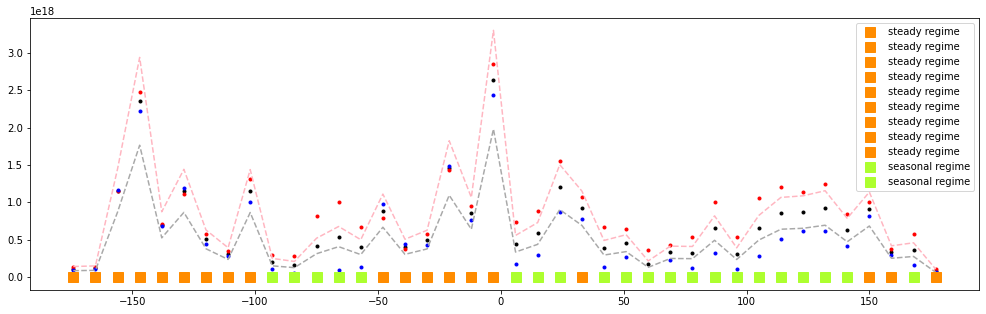

In [92]:
fig = plt.figure(figsize=(17,5))
plt.plot(lon_bin_mid,np.nanmean(w4_bmelt_binned, axis=0)*Melt_fac,'.k')
plt.plot(lon_bin_mid,np.nanmean(w4_bmelt_binned_summer, axis=0)*Melt_fac,'.r')
plt.plot(lon_bin_mid,np.nanmean(w4_bmelt_binned.isel(time=slice(win1,win2)), axis=0)*Melt_fac,'.b')

plt.plot(lon_bin_mid,meanminus,'--',color='darkgray')
plt.plot(lon_bin_mid,meanplus,'--',color='lightpink')
for ii in range(40):
    if regime_class[ii] == 0:
        plt.plot(lon_bin_mid[ii],regime_class[ii]+55,'s',color='greenyellow',label='seasonal regime',markersize=10)
    elif regime_class[ii] == 2:
        plt.plot(lon_bin_mid[ii],regime_class[ii]+53,'s',color='darkorange',label='steady regime',markersize=10)
    # if ii==0:
    #     plt.legend()
    if ii==10:
        plt.legend()

#### Figure 1 - final plot:

(100, 4) (100, 4) (100, 4)
(100, 7) (100, 7) (100, 7)
(100, 5) (100, 5) (100, 5)
(100, 5) (100, 5) (100, 5)
(100, 18) (100, 18) (100, 18)
(100, 5) (100, 5) (100, 5)
(100, 6) (100, 6) (100, 6)
(100, 5) (100, 5) (100, 5)
(100, 4) (100, 4) (100, 4)
(100, 5) (100, 5) (100, 5)
(100, 5) (100, 5) (100, 5)
(100, 6) (100, 6) (100, 6)


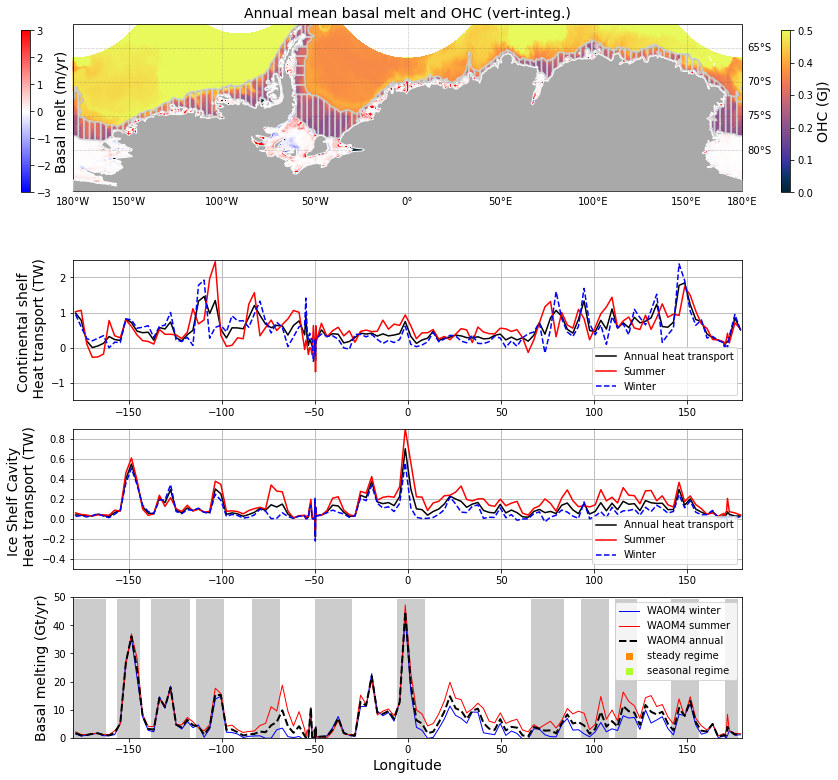

In [57]:
# Fig. 1: 3 rows
# row 1) Map with OHC + Basal melt     #lonlat_bins
# row 2) OHCt (net tend.) for WAOM4 both ice shelf and cont. shelf
# row 3) Basal melting

Melt_fac_map=365.25*86400
rho_ice = 916 # https://github.com/kuechenrole/antarctic_melting/blob/master/notebooks/GRL/Susheel_bfrn_depth_structure.ipynb
# Melt_fac = 86400*365.25*rho_ice
Melt_fac=rho_ice*1e-12 # convert to Gigatonne (=1e12 kg)

proj = ccrs.PlateCarree(central_longitude=0)

fig = plt.figure(figsize=(12,15))

# 1) map:

# -for 4km:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5

ax1 = fig.add_subplot(2,1,1, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
cm1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   ma.masked_where(contour_masked_above_CF_4km[jst:jen,ist:ien] == -1000, melt_4km[:,jst:jen,ist:ien].mean('ocean_time'))*Melt_fac_map,
                   transform=ccrs.PlateCarree(), vmin=-3, vmax=3, cmap='bwr') #, cmap=cmocean.cm.balance
plt.scatter(lon_along_4km,lat_along_4km,marker='.', s=.3, alpha=0.4, color='darkgray',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF,marker='.', s=.3, alpha=0.4, color='lightcyan',label='Calving front', transform=ccrs.PlateCarree());
# plt.legend(loc='lower right')

## ---- include bins limits:
for ii in np.arange(1,140): # 1-125 is fine, issue is the ones closer to 180E/W??
    tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
    tmp_filled = np.nan_to_num(tmp, nan=0)
    cc=plt.contour(lon_rho_4km,lat_rho_4km,
                    tmp_filled, levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ien=750
ii=0
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ist=750
ien=-1
ii=-1
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
## ------------------------
plt.title('Annual mean basal melt and OHC (vert-integ.)',fontsize=14)

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlines = True
gl.top_labels=False   # suppress top labels
gl.xlabels_bottom = True
gl.ylabels_left = False
gl.ylabels_right = True
gl.xlocator = mticker.FixedLocator([-180, -150, -100, -50, 0, 50, 100, 150, 180])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax1.set_extent([-180, 180, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .25  #.175

ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
cbar_ax0 = fig.add_axes([0.945, 0.63,  0.01, 0.15])
fig.colorbar(ct1, cax=cbar_ax0, orientation='vertical')
cbar_ax0.set_ylabel('OHC (GJ)',fontsize=14)#, labelpad=-35)
cbar_ax1 = fig.add_axes([0.065, 0.63,  0.01, 0.15])
fig.colorbar(cm1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Basal melt (m/yr)',fontsize=14)#, labelpad=-35)


ax1 = fig.add_subplot(5,1,3)
# ax1.plot(w4_lon_bins,w4_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'-',color='b',linewidth=1,label='Winter (Apr-Nov) ')
# ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
# ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.plot(w4_lon_bins,(w4_hadv.mean('ocean_time')+w4_hdiff.mean('ocean_time'))*1e-12,'-',alpha=1,color='k',label='Annual heat transport')
ax1.plot(w4_lon_bins,(w4_hadv_summer.mean('ocean_time')+w4_hdiff_summer.mean('ocean_time'))*1e-12,'-',linewidth=1.5,alpha=1,color='r',label='Summer')
ax1.plot(w4_lon_bins,(w4_hadv.isel(ocean_time=slice(win1,win2)).mean('ocean_time')+
                      w4_hdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
                      *1e-12,'--',linewidth=1.5,alpha=1,color='b',label='Winter')
# ax1.set_title('Net heat tendency - continental shelf')
ax1.legend(loc='lower right')
ax1.set_xlim(-180,179.5)
ax1.set_ylim(-1.5,2.5)
ax1.grid('on')
ax1.set_ylabel('Continental shelf \n Heat transport (TW)',fontsize=14)


ax1 = fig.add_subplot(5,1,4)
# ax1.plot(w4_lon_bins,w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,color='b',linewidth=1,label='Winter (Apr-Nov) ')
# ax1.plot(w4_lon_bins,w4_net_is_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
# ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*2*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.plot(w4_lon_bins,(w4_hadv_is.mean('ocean_time')+w4_hdiff_is.mean('ocean_time'))*1e-12,'-',alpha=1,color='k',label='Annual heat transport')
ax1.plot(w4_lon_bins,(w4_hadv_is_summer.mean('ocean_time')+w4_hdiff_is_summer.mean('ocean_time'))*1e-12,'-',linewidth=1.5,alpha=1,color='r',label='Summer')
ax1.plot(w4_lon_bins,(w4_hadv_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')+
                      w4_hdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
                      *1e-12,'--',linewidth=1.5,alpha=1,color='b',label='Winter')
# ax1.set_title('Net heat tendency - ice shelf cavities')
ax1.legend(loc='lower right')
ax1.set_xlim(-180,179.5)
ax1.set_ylim(-.5,.9)
ax1.grid('on')
ax1.set_ylabel('Ice Shelf Cavity \n Heat transport (TW)',fontsize=14)
# ax1.set_xlabel('Longitude',fontsize=14)

ax2 = fig.add_subplot(5,1,5)
# seasonal
ax2.plot(lon_bins,np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac,'-b',label='WAOM4 winter ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt_summer, axis=0)*Melt_fac,'-r',label='WAOM4 summer ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt, axis=0)*Melt_fac,'--k',label='WAOM4 annual', linewidth=2)
# ax2.plot(w4_lon_bins,np.nanmean(bmelt, axis=0),'-k',label='WAOM10 annual', linewidth=1, alpha=0.5)
# ax2.plot(w4_lon_bins,np.nanmean(w2_bmelt, axis=0),'--k',label='WAOM2 annual', linewidth=1, alpha=0.5)
## Just to add regime legend:
ax2.plot(lon_bin_mid[8],regime_class[8]+100,'s',color='darkorange',label='steady regime')     
ax2.plot(lon_bin_mid[9],regime_class[9]+100,'s',color='greenyellow',label='seasonal regime')
ax2.legend(loc='upper left')

# - plot gray shads:
for ii in np.arange(0,12):
    Xplt, Yplt = np.meshgrid(w4_lon_bins[sind_subreg[ii]:eind_subreg[ii]], np.arange(-50,50))
    print(Xplt.shape, Yplt.shape,np.ones((100,len(Xplt[0,:]))).shape)
    ax2.pcolormesh(Xplt, Yplt,np.ones((100,len(Xplt[0,:]))), cmap='nipy_spectral', vmin=0, vmax=1)
    del Xplt, Yplt
ax2.legend()
ax2.set_xlabel('Longitude',fontsize=14)
ax2.set_ylabel('Basal melting (Gt/yr)',fontsize=14)
# ax2.set_title('WAOM4')
# ax2.grid('on')
ax2.set_xlim(-180,179.5)
ax2.set_ylim(0,50)
for ii in range(40):
    if regime_class[ii] == 0:
        ax2.plot(lon_bin_mid[ii],regime_class[ii]+50,'-',color='greenyellow',label='seasonal regime')
    elif regime_class[ii] == 2:
        ax2.plot(lon_bin_mid[ii],regime_class[ii]+48,'-',color='darkorange',label='steady regime')
    # if ii==0:
    #     ax2.legend(loc='center right')
    # if ii==1:
    #     ax2.legend(loc='center right')

name_fig='waom4_lonbin_regional_Basal_melt_seasonal_Figure1new.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')


#### some other tests (figure 1)

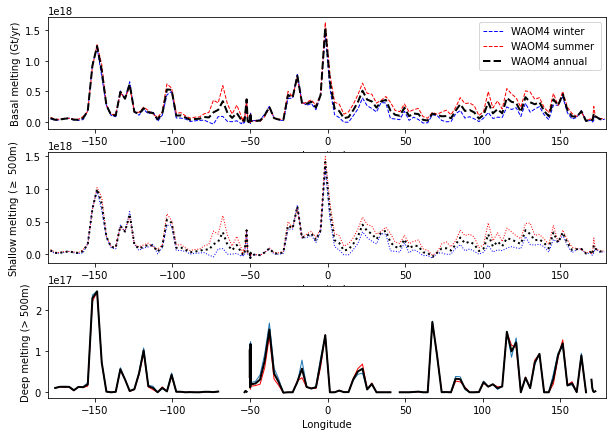

In [93]:

fig = plt.figure(figsize=(10,7))
ax1 = fig.add_subplot(3,1,1)

# seasonal
ax1.plot(lon_bins,np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac,'--b',label='WAOM4 winter ',linewidth=1)
ax1.plot(lon_bins,np.nanmean(w4_bmelt_summer, axis=0)*Melt_fac,'--r',label='WAOM4 summer ',linewidth=1)
ax1.plot(lon_bins,np.nanmean(w4_bmelt, axis=0)*Melt_fac,'--k',label='WAOM4 annual', linewidth=2)

# - plot gray shads:
for ii in np.arange(0,11):

    Xplt, Yplt = np.meshgrid(w4_lon_bins[sind_subreg[ii]:eind_subreg[ii]], np.arange(-50,50))
    # print(Xplt.shape, Yplt.shape,np.ones((100,len(Xplt[0,:]))).shape)
    ax1.pcolormesh(Xplt, Yplt,np.ones((100,len(Xplt[0,:]))), cmap='nipy_spectral', vmin=0, vmax=1)
    del Xplt, Yplt
# -------------

ax1.legend()
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Basal melting (Gt/yr)')
ax1.set_xlim(-180,179.5)
# ax1.set_ylim(-5,200)


ax2 = fig.add_subplot(3,1,2)
ax2.plot(lon_bins,np.nanmean(w4_bmelt_shallow.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac,':b',label='<500m, winter ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmeltS_summer, axis=0)*Melt_fac,':r',label='<500m, summer ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt_shallow, axis=0)*Melt_fac,':k',label='<500m, annual', linewidth=2)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Shallow melting ($\geq$ 500m)')
ax2.set_xlim(-180,179.5)
# ax2.set_ylim(-5,200)
for ii in np.arange(0,10):

    Xplt, Yplt = np.meshgrid(w4_lon_bins[sind_subreg[ii]:eind_subreg[ii]], np.arange(-50,50))
    ax2.pcolormesh(Xplt, Yplt,np.ones((100,len(Xplt[0,:]))), cmap='nipy_spectral', vmin=0, vmax=1)
    del Xplt, Yplt
    
ax3 = fig.add_subplot(3,1,3)
ax3.plot(lon_bins,np.nanmean(w4_bmelt_deep.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac,'-',label='>500m, winter ',linewidth=1)
ax3.plot(lon_bins,np.nanmean(w4_bmeltD_summer, axis=0)*Melt_fac,'-r',label='>500m, summer ',linewidth=1)
ax3.plot(lon_bins,np.nanmean(w4_bmelt_deep, axis=0)*Melt_fac,'-k',label='>500m, annual', linewidth=2)
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Deep melting (> 500m)')
ax3.set_xlim(-180,179.5)
# ax3.set_ylim(-5,200)
for ii in np.arange(0,10):

    Xplt, Yplt = np.meshgrid(w4_lon_bins[sind_subreg[ii]:eind_subreg[ii]], np.arange(-50,50))
    ax3.pcolormesh(Xplt, Yplt,np.ones((100,len(Xplt[0,:]))), cmap='nipy_spectral', vmin=0, vmax=1)
    del Xplt, Yplt

name_fig='waom4_lonbin_regional_Basal_melt_seasonal_Figure1.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')


(100, 4) (100, 4) (100, 4)
(100, 7) (100, 7) (100, 7)
(100, 5) (100, 5) (100, 5)
(100, 5) (100, 5) (100, 5)
(100, 18) (100, 18) (100, 18)
(100, 5) (100, 5) (100, 5)
(100, 6) (100, 6) (100, 6)
(100, 5) (100, 5) (100, 5)
(100, 4) (100, 4) (100, 4)
(100, 5) (100, 5) (100, 5)
(100, 5) (100, 5) (100, 5)
(100, 6) (100, 6) (100, 6)


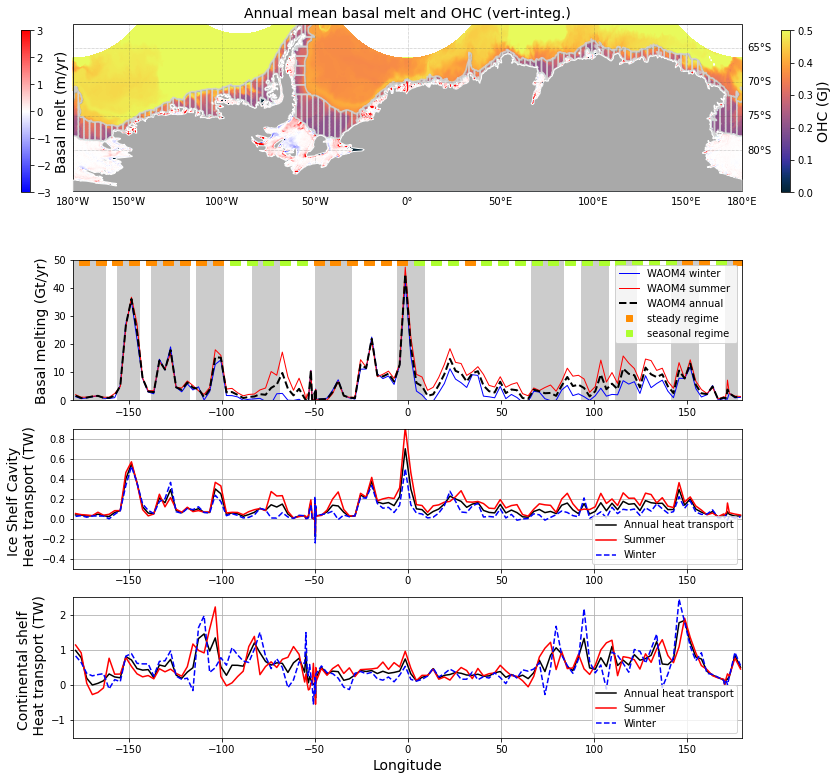

In [94]:
# Fig. 1: 3 rows
# row 1) Map with OHC + Basal melt     #lonlat_bins
# row 2) OHCt (net tend.) for WAOM4 both ice shelf and cont. shelf
# row 3) Basal melting

Melt_fac_map=365.25*86400
rho_ice = 916 # https://github.com/kuechenrole/antarctic_melting/blob/master/notebooks/GRL/Susheel_bfrn_depth_structure.ipynb
# Melt_fac = 86400*365.25*rho_ice
Melt_fac=rho_ice*1e-12 # convert to Gigatonne (=1e12 kg)

proj = ccrs.PlateCarree(central_longitude=0)

fig = plt.figure(figsize=(12,15))

# 1) map:

# -for 4km:
jst= 100
jen=-1
ist=0
ien=-1
tmin = 0
tmax = 0.5

ax1 = fig.add_subplot(2,1,1, projection=proj)
ct1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   temp3d_vint_4km_annual[jst:jen,ist:ien]*1e-9, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
cm1=plt.pcolormesh(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                   ma.masked_where(contour_masked_above_CF_4km[jst:jen,ist:ien] == -1000, melt_4km[:,jst:jen,ist:ien].mean('ocean_time'))*Melt_fac_map,
                   transform=ccrs.PlateCarree(), vmin=-3, vmax=3, cmap='bwr') #, cmap=cmocean.cm.balance
plt.scatter(lon_along_4km,lat_along_4km,marker='.', s=.3, alpha=0.4, color='darkgray',label='1500m isobath', transform=ccrs.PlateCarree());
plt.scatter(lon_along_4km_CF,lat_along_4km_CF,marker='.', s=.3, alpha=0.4, color='lightcyan',label='Calving front', transform=ccrs.PlateCarree());
# plt.legend(loc='lower right')

## ---- include bins limits:
for ii in np.arange(1,140): # 1-125 is fine, issue is the ones closer to 180E/W??
    tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
    tmp_filled = np.nan_to_num(tmp, nan=0)
    cc=plt.contour(lon_rho_4km,lat_rho_4km,
                    tmp_filled, levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ien=750
ii=0
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
ist=750
ien=-1
ii=-1
tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
tmp_filled = np.nan_to_num(tmp, nan=0)
cc=plt.contour(lon_rho_4km[jst:jen,ist:ien].values,lat_rho_4km[jst:jen,ist:ien].values,
                tmp_filled[jst:jen,ist:ien], levels=[0.5], transform=ccrs.PlateCarree(), colors='lightgray', linewidth=0.25, alpha=0.8)
## ------------------------
plt.title('Annual mean basal melt and OHC (vert-integ.)',fontsize=14)

gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linewidth=.5, color=[.3,.3,.3], alpha=0.75, linestyle=':')
gl.xlines = True
gl.top_labels=False   # suppress top labels
gl.xlabels_bottom = True
gl.ylabels_left = False
gl.ylabels_right = True
gl.xlocator = mticker.FixedLocator([-180, -150, -100, -50, 0, 50, 100, 150, 180])
gl.ylocator = mticker.FixedLocator([-65, -70, -75, -80])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

ax1.add_feature(cfeature.LAND, zorder=3, facecolor='darkgray',edgecolor='white')
ax1.set_extent([-180, 180, -86, -61.5], crs=ccrs.PlateCarree())
x_left, x_right = ax1.get_xlim()
y_low, y_high = ax1.get_ylim()
ratio = .25  #.175

ax1.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)
cbar_ax0 = fig.add_axes([0.945, 0.63,  0.01, 0.15])
fig.colorbar(ct1, cax=cbar_ax0, orientation='vertical')
cbar_ax0.set_ylabel('OHC (GJ)',fontsize=14)#, labelpad=-35)
cbar_ax1 = fig.add_axes([0.065, 0.63,  0.01, 0.15])
fig.colorbar(cm1, cax=cbar_ax1, orientation='vertical')
cbar_ax1.set_ylabel('Basal melt (m/yr)',fontsize=14)#, labelpad=-35)


ax1 = fig.add_subplot(5,1,5)
# ax1.plot(w4_lon_bins,w4_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'-',color='b',linewidth=1,label='Winter (Apr-Nov) ')
# ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
# ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.plot(w4_lon_bins,(w4_hadv.mean('ocean_time')+w4_hdiff.mean('ocean_time'))*1e-12,'-',alpha=1,color='k',label='Annual heat transport')
ax1.plot(w4_lon_bins,(w4_hadv_summer.mean('ocean_time')+w4_hdiff_summer.mean('ocean_time'))*1e-12,'-',linewidth=1.5,alpha=1,color='r',label='Summer')
ax1.plot(w4_lon_bins,(w4_hadv.isel(ocean_time=slice(win1,win2)).mean('ocean_time')+
                      w4_hdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
                      *1e-12,'--',linewidth=1.5,alpha=1,color='b',label='Winter')
# ax1.set_title('Net heat tendency - continental shelf')
ax1.legend(loc='lower right')
ax1.set_xlim(-180,179.5)
ax1.set_ylim(-1.5,2.5)
ax1.grid('on')
ax1.set_ylabel('Continental shelf \n Heat transport (TW)',fontsize=14)
ax1.set_xlabel('Longitude',fontsize=14)


ax1 = fig.add_subplot(5,1,4)
# ax1.plot(w4_lon_bins,w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,color='b',linewidth=1,label='Winter (Apr-Nov) ')
# ax1.plot(w4_lon_bins,w4_net_is_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
# ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*2*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.plot(w4_lon_bins,(w4_hadv_is.mean('ocean_time')+w4_hdiff_is.mean('ocean_time'))*1e-12,'-',alpha=1,color='k',label='Annual heat transport')
ax1.plot(w4_lon_bins,(w4_hadv_is_summer.mean('ocean_time')+w4_hdiff_is_summer.mean('ocean_time'))*1e-12,'-',linewidth=1.5,alpha=1,color='r',label='Summer')
ax1.plot(w4_lon_bins,(w4_hadv_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')+
                      w4_hdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
                      *1e-12,'--',linewidth=1.5,alpha=1,color='b',label='Winter')
# ax1.set_title('Net heat tendency - ice shelf cavities')
ax1.legend(loc='lower right')
ax1.set_xlim(-180,179.5)
ax1.set_ylim(-.5,.9)
ax1.grid('on')
ax1.set_ylabel('Ice Shelf Cavity \n Heat transport (TW)',fontsize=14)
# ax1.set_xlabel('Longitude',fontsize=14)

ax2 = fig.add_subplot(5,1,3)
# seasonal
ax2.plot(lon_bins,np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac,'-b',label='WAOM4 winter ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt_summer, axis=0)*Melt_fac,'-r',label='WAOM4 summer ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt, axis=0)*Melt_fac,'--k',label='WAOM4 annual', linewidth=2)
# ax2.plot(w4_lon_bins,np.nanmean(bmelt, axis=0),'-k',label='WAOM10 annual', linewidth=1, alpha=0.5)
# ax2.plot(w4_lon_bins,np.nanmean(w2_bmelt, axis=0),'--k',label='WAOM2 annual', linewidth=1, alpha=0.5)
## Just to add regime legend:
ax2.plot(lon_bin_mid[8],regime_class[8]+100,'s',color='darkorange',label='steady regime')     
ax2.plot(lon_bin_mid[9],regime_class[9]+100,'s',color='greenyellow',label='seasonal regime')
ax2.legend(loc='upper left')

# - plot gray shads:
for ii in np.arange(0,12):
    Xplt, Yplt = np.meshgrid(w4_lon_bins[sind_subreg[ii]:eind_subreg[ii]], np.arange(-50,50))
    print(Xplt.shape, Yplt.shape,np.ones((100,len(Xplt[0,:]))).shape)
    ax2.pcolormesh(Xplt, Yplt,np.ones((100,len(Xplt[0,:]))), cmap='nipy_spectral', vmin=0, vmax=1)
    del Xplt, Yplt
ax2.legend()
# ax2.set_xlabel('Longitude',fontsize=14)
ax2.set_ylabel('Basal melting (Gt/yr)',fontsize=14)
# ax2.set_title('WAOM4')
# ax2.grid('on')
ax2.set_xlim(-180,179.5)
ax2.set_ylim(0,50)
for ii in range(40):
    if regime_class[ii] == 0:
        ax2.plot(lon_bin_mid[ii],regime_class[ii]+50,'s',color='greenyellow',label='seasonal regime',markersize=10)
    elif regime_class[ii] == 2:
        ax2.plot(lon_bin_mid[ii],regime_class[ii]+48,'s',color='darkorange',label='steady regime',markersize=10)
    # if ii==0:
    #     ax2.legend(loc='center right')
    # if ii==1:
    #     ax2.legend(loc='center right')

name_fig='waom4_lonbin_regional_Basal_melt_seasonal_Figure1new_B.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')


(-0.1, 0.7)

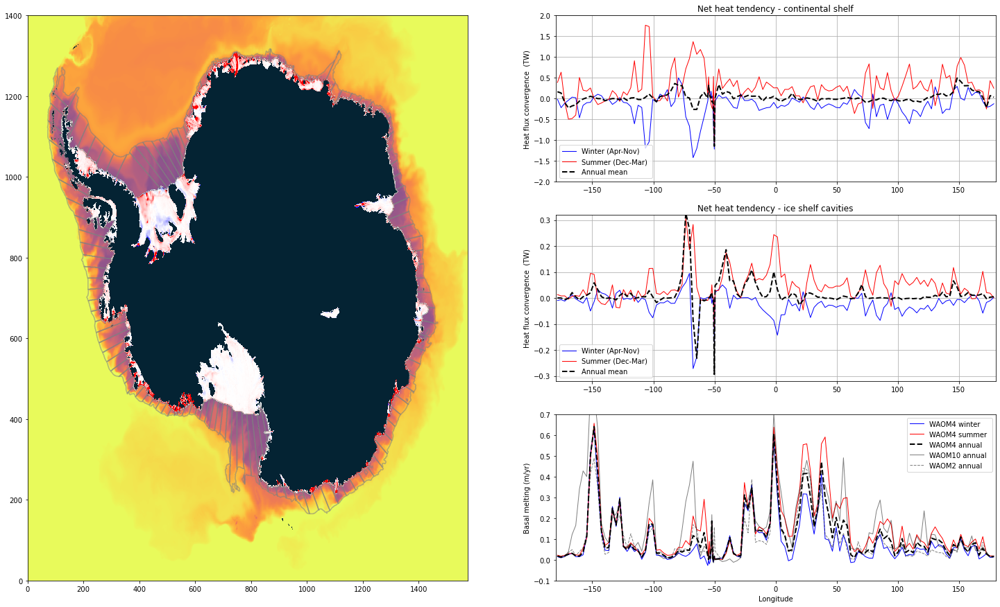

In [144]:
# V2 of Figure 1 withb map centred in the south pole!

#test with just contours between long-bins:
fig = plt.figure(figsize=(25,15))

ax1 = fig.add_subplot(1,2,1)

ct1=ax1.pcolormesh(temp3d_vint_4km_annual*1e-9, cmap=cmocean.cm.thermal, vmin=tmin, vmax=tmax)
cm1=ax1.pcolormesh(ma.masked_where(contour_masked_above_CF_4km == -1000, melt_4km.mean('ocean_time'))*Melt_fac,
                   vmin=-3, vmax=3, cmap='bwr') #, cmap=cmocean.cm.balance

for ii in np.arange(0,127):
    tmp = mask_LonBins_4km[ii,:]*w4_mask_zice*w4_mask_land*w4_mask_shelf
    tmp_filled = np.nan_to_num(tmp, nan=0)
    ax1=plt.contour(tmp_filled, levels=[0.5], colors='gray', linewidth=0.5, alpha=0.55)

# ax1.title('Basal melt and OHC (vert-integ.), WAOM4')

ax1 = fig.add_subplot(3,2,2)
ax1.plot(lon_bins,w4_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'-',color='b',linewidth=1,label='Winter (Apr-Nov) ')
ax1.plot(lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
ax1.plot(lon_bins,w4_net.mean('ocean_time')*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.set_title('Net heat tendency - continental shelf')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-2.,2.)
ax1.grid('on')
ax1.set_ylabel('Heat flux convergence  (TW)')


ax1 = fig.add_subplot(3,2,4)
ax1.plot(lon_bins,w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,color='b',linewidth=1,label='Winter (Apr-Nov) ')
ax1.plot(lon_bins,w4_net_is_summer.mean('ocean_time')*1e-12,'-',color='r',linewidth=1,label='Summer (Dec-Mar) ')
ax1.plot(lon_bins,w4_net_is.mean('ocean_time')*2*1e-12,'--',color='k',label='Annual mean',linewidth=2)
ax1.set_title('Net heat tendency - ice shelf cavities')
ax1.legend(loc='lower left')
ax1.set_xlim(-180,180)
ax1.set_ylim(-.32,.32)
ax1.grid('on')
ax1.set_ylabel('Heat flux convergence  (TW)')

ax2 = fig.add_subplot(3,2,6)
# seasonal
ax2.plot(lon_bins,np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0),'-b',label='WAOM4 winter ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt_summer, axis=0),'-r',label='WAOM4 summer ',linewidth=1)
ax2.plot(lon_bins,np.nanmean(w4_bmelt, axis=0),'--k',label='WAOM4 annual', linewidth=2)
ax2.plot(lon_bins,np.nanmean(bmelt, axis=0),'-k',label='WAOM10 annual', linewidth=1, alpha=0.5)
ax2.plot(lon_bins,np.nanmean(w2_bmelt, axis=0),'--k',label='WAOM2 annual', linewidth=1, alpha=0.5)
ax2.legend()
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Basal melting (m/yr)')
# ax2.set_title('WAOM4')
# ax2.grid('on')
ax2.set_xlim(-180,180)
ax2.set_ylim(-.1,.7)

NameError: name 'bmelt_summer' is not defined

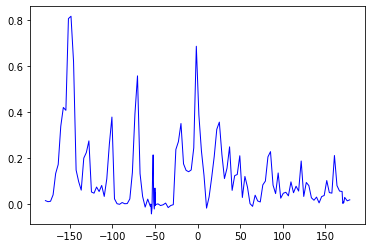

In [53]:
plt.plot(lon_bins,np.nanmean(bmelt.isel(ocean_time=slice(win1,win2)), axis=0),'-b',label='winter ',linewidth=1)
plt.plot(lon_bins,np.nanmean(bmelt_summer, axis=0),'-r',label='summer ',linewidth=1)
plt.plot(lon_bins,np.nanmean(bmelt, axis=0),'--k',label='annual', linewidth=2)
plt.title('WAOM10')

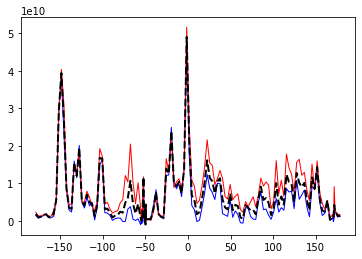

In [54]:
plt.plot(lon_bins,np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0),'-b',label='winter ',linewidth=1)
plt.plot(lon_bins,np.nanmean(w4_bmelt_summer, axis=0),'-r',label='summer ',linewidth=1)
plt.plot(lon_bins,np.nanmean(w4_bmelt, axis=0),'--k',label='annual', linewidth=2)


ValueError: x and y must have same first dimension, but have shapes (141,) and (127,)

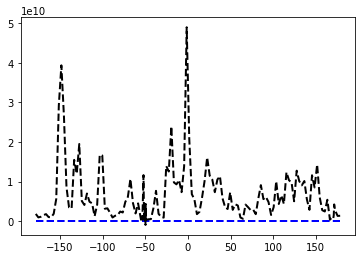

In [55]:
plt.plot(lon_bins,np.nanmean(bmelt, axis=0),'--b',label='WAOM10', linewidth=2)
plt.plot(lon_bins,np.nanmean(w4_bmelt, axis=0),'--k',label='WAOM4', linewidth=2)
plt.plot(lon_bins,np.nanmean(w2_bmelt, axis=0),'--r',label='WAOM2', linewidth=2)
plt.show()

In [45]:
### for WAOM2: (waiting daily outputs)

# # Fig. 1: 3 rows
# # row 1) Map with lonlat_bins
# # row 2) OHCt (net tend.) for WAOM4 both ice shelf and cont. shelf
# # row 3) Basal melting

# fig = plt.figure(figsize=(12,10))

# ax1 = fig.add_subplot(4,1,2)
# ax1.plot(lon_bins,w2_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='b')
# ax1.plot(lon_bins,w2_net_summer.mean('ocean_time')*1e-12,'--',color='r')
# ax1.plot(lon_bins,w2_net.mean('ocean_time')*1e-12,'--',color='k',label='Continental shelf',linewidth=2)
# ax1.set_title('WAOM2 - continental shelf')
# ax1.legend(loc='lower left')
# ax1.set_xlim(-180,180)
# ax1.set_ylim(-2.5,2.5)
# ax1.grid('on')
# ax1.set_ylabel('Heat flux convergence  (TW)')


# ax1 = fig.add_subplot(4,1,3)
# ax1.plot(lon_bins,w2_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='b')
# ax1.plot(lon_bins,w2_net_is_summer.mean('ocean_time')*1e-12,'--',color='r')
# ax1.plot(lon_bins,w2_net_is.mean('ocean_time')*2*1e-12,'-',color='k',label='Ice Shelf Cavity',linewidth=2)
# ax1.set_title('WAOM2 - ice shelf cavities')
# ax1.legend(loc='lower left')
# ax1.set_xlim(-180,180)
# ax1.set_ylim(-1.,1.)
# ax1.grid('on')
# ax1.set_ylabel('Heat flux convergence  (TW)')
# ax2 = fig.add_subplot(4,1,4)
# # seasonal
# ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt.isel(ocean_time=slice(win1,win2)), axis=0),area_sum.values)*1000,'-b',label='winter ')
# ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt_summer, axis=0),area_sum.values)*1000,'-r',label='summer ')
# ax2.plot(lon_bins,np.divide(np.nanmean(w2_bmelt, axis=0),area_sum.values)*1000,'--k',label='annual', linewidth=2)

# ax2.legend()
# # ax2.set_xlabel('Longitude')
# ax2.set_ylabel('Basal melting (m/yr)')
# ax2.set_title('WAOM2')
# ax2.grid('on')
# ax2.set_xlim(-180,180)
# ax2.set_ylim(-.5,1.5)

### Figure 2: OHB with processes - cont. shelf x ice shelf cavities, summer x winter

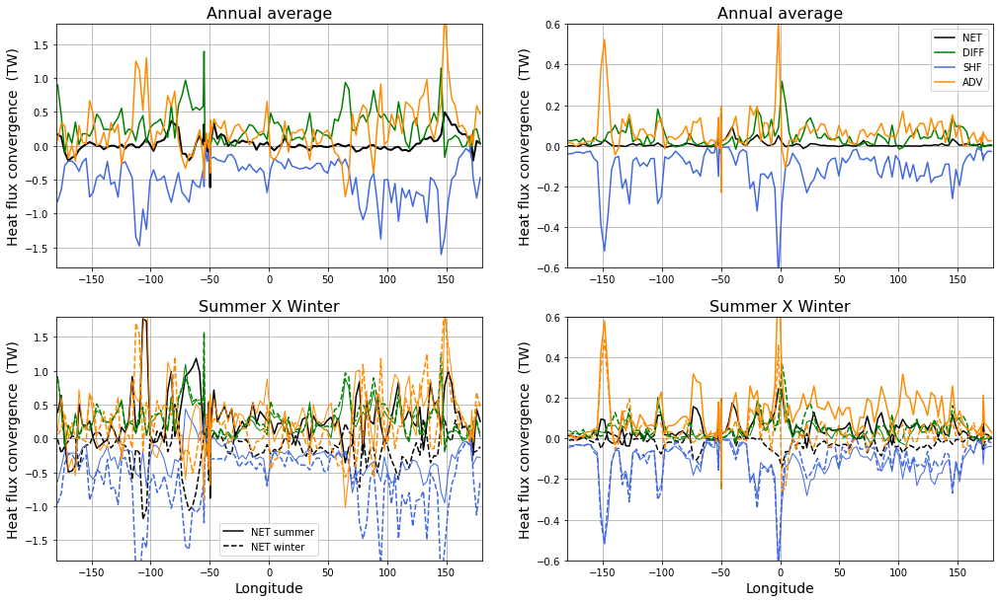

In [44]:

fig = plt.figure(figsize=(17,10))

ax1 = fig.add_subplot(2,2,1)
ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*0,'--',color='gray',linewidth=0.5)

# ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'-k',label='Continental shelf',linewidth=2, alpha=1)
# ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*1e-12,'--k',label='Ice shelf cavities',linewidth=2)
# ax1.legend(loc='lower right')
ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=2, alpha=1)
ax1.plot(w4_lon_bins,w4_hdiff.mean('ocean_time')*1e-12,color='green',label='DIFF', alpha=1)
ax1.plot(w4_lon_bins,w4_vdiff.mean('ocean_time')*1e-12,color='royalblue',label='SHF', alpha=1)
ax1.plot(w4_lon_bins,w4_hadv.mean('ocean_time')*1e-12,color='darkorange',label='ADV', alpha=1)
# ax1.set_title('Continental shelf \n Annual average', fontsize=16)
ax1.set_title('Annual average', fontsize=16)
ax1.set_xlim(-180,180)
ax1.set_ylim(-1.8,1.8)
ax1.grid('off')
ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)

ax1 = fig.add_subplot(2,2,2)

ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=1.5,)
ax1.plot(w4_lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='green',label='DIFF')
ax1.plot(w4_lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='royalblue',label='SHF')
ax1.plot(w4_lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'-',alpha=1,color='darkorange',label='ADV')
# ax1.set_title('Ice shelf cavity \n Annual average', fontsize=16)
ax1.set_title('Annual average', fontsize=16)
ax1.legend(loc='upper right')
ax1.set_xlim(-180,180)
ax1.set_ylim(-.6,.6)
ax1.grid('off')
ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)

ax1 = fig.add_subplot(2,2,3)
ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--k',label='NET winter',linewidth=1.5)
ax1.legend()#loc='lower left')

ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*0,'--',color='gray',linewidth=0.5)
ax1.plot(w4_lon_bins,w4_hdiff_summer.mean('ocean_time')*1e-12,linewidth=1,color='green',label='DIFF summer', alpha=1)
ax1.plot(w4_lon_bins,w4_hdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='green',label='DIFF winter', alpha=1)

ax1.plot(w4_lon_bins,w4_vdiff_summer.mean('ocean_time')*1e-12,linewidth=1,color='royalblue',label='SHF summer', alpha=1)
ax1.plot(w4_lon_bins,w4_vdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='royalblue',label='SHF winter', alpha=1)

ax1.plot(w4_lon_bins,w4_hadv_summer.mean('ocean_time')*1e-12,linewidth=1,color='darkorange',label='ADV summer', alpha=1)
# ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_hadv.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='darkorange',label='ADV winter', alpha=1)

ax1.set_title('Summer X Winter', fontsize=16)
ax1.set_xlim(-180,180)
ax1.set_ylim(-1.8,1.8)
ax1.grid('off')
ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)
ax1.set_xlabel('Longitude', fontsize=14)

ax1 = fig.add_subplot(2,2,4)
ax1.plot(w4_lon_bins,w4_net_is_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--k',label='NET winter',linewidth=1.5)

ax1.plot(w4_lon_bins,w4_hdiff_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1,alpha=1,color='green',label='DIFF summer')
ax1.plot(w4_lon_bins,w4_hdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',alpha=1,color='green',label='DIFF winter')

ax1.plot(w4_lon_bins,w4_vdiff_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1,alpha=1,color='royalblue',label='SHF summer')
ax1.plot(w4_lon_bins,w4_vdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',alpha=1,color='royalblue',label='SHF winter')

ax1.plot(w4_lon_bins,w4_hadv_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1.5,alpha=1,color='darkorange',label='ADV summer')
ax1.plot(w4_lon_bins,w4_hadv_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',linewidth=1.5,alpha=1,color='darkorange',label='ADV winter')
ax1.set_title('Summer X Winter', fontsize=16)
ax1.set_xlim(-180,180)
ax1.set_ylim(-.6,.6)
ax1.grid('off')
ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)
ax1.set_xlabel('Longitude', fontsize=14)


name_fig='waom4_lonbin_regional_OHB_wholeshelf_Figure2.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

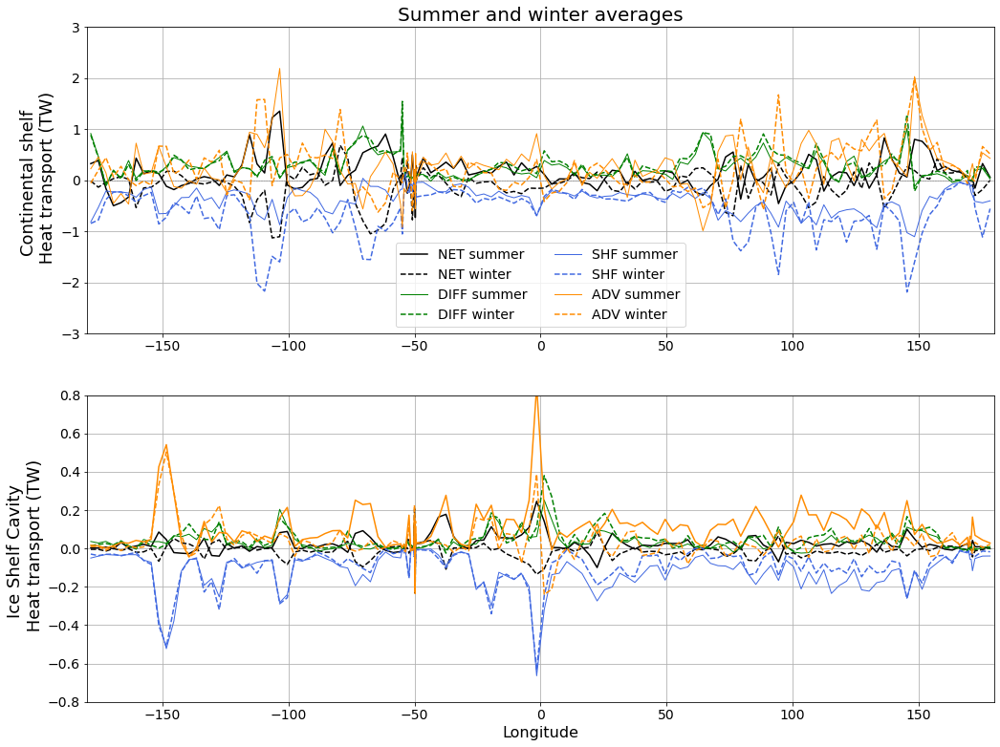

In [95]:

fig = plt.figure(figsize=(17,13))

# ax1 = fig.add_subplot(2,2,1)
# ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*0,'--',color='gray',linewidth=0.5)

# # ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'-k',label='Continental shelf',linewidth=2, alpha=1)
# # ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*1e-12,'--k',label='Ice shelf cavities',linewidth=2)
# # ax1.legend(loc='lower right')
# ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=2, alpha=1)
# ax1.plot(w4_lon_bins,w4_hdiff.mean('ocean_time')*1e-12,color='green',label='DIFF', alpha=1)
# ax1.plot(w4_lon_bins,w4_vdiff.mean('ocean_time')*1e-12,color='royalblue',label='SHF', alpha=1)
# ax1.plot(w4_lon_bins,w4_hadv.mean('ocean_time')*1e-12,color='darkorange',label='ADV', alpha=1)
# # ax1.set_title('Continental shelf \n Annual average', fontsize=16)
# ax1.set_title('Annual average', fontsize=16)
# ax1.set_xlim(-180,180)
# ax1.set_ylim(-1.8,1.8)
# ax1.grid('off')
# ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)

# ax1 = fig.add_subplot(2,2,2)

# ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=1.5,)
# ax1.plot(w4_lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='green',label='DIFF')
# ax1.plot(w4_lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='royalblue',label='SHF')
# ax1.plot(w4_lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'-',alpha=1,color='darkorange',label='ADV')
# # ax1.set_title('Ice shelf cavity \n Annual average', fontsize=16)
# ax1.set_title('Annual average', fontsize=16)
# ax1.legend(loc='upper right')
# ax1.set_xlim(-180,180)
# ax1.set_ylim(-.6,.6)
# ax1.grid('off')
# ax1.set_ylabel('Heat flux convergence  (TW)', fontsize=14)

ax1 = fig.add_subplot(2,1,1)
ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_net.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--k',label='NET winter',linewidth=1.5)

ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*0,'--',color='gray',linewidth=0.5)
ax1.plot(w4_lon_bins,w4_hdiff_summer.mean('ocean_time')*1e-12,linewidth=1,color='green',label='DIFF summer', alpha=1)
ax1.plot(w4_lon_bins,w4_hdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='green',label='DIFF winter', alpha=1)

ax1.plot(w4_lon_bins,w4_vdiff_summer.mean('ocean_time')*1e-12,linewidth=1,color='royalblue',label='SHF summer', alpha=1)
ax1.plot(w4_lon_bins,w4_vdiff.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='royalblue',label='SHF winter', alpha=1)

ax1.plot(w4_lon_bins,w4_hadv_summer.mean('ocean_time')*1e-12,linewidth=1,color='darkorange',label='ADV summer', alpha=1)
# ax1.plot(w4_lon_bins,w4_net_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_hadv.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',color='darkorange',label='ADV winter', alpha=1)

ax1.set_title('Summer and winter averages', fontsize=20)
ax1.set_xlim(-180,180)
ax1.set_ylim(-3,3)
ax1.grid('off')
ax1.set_ylabel('Continental shelf \n Heat transport (TW)',fontsize=18)
# ax1.set_xlabel('Longitude', fontsize=14)
ax1.legend(ncol=2,loc='lower center',fontsize=14)
ax1.tick_params(axis='x',labelsize=14)
ax1.tick_params(axis='y',labelsize=14)

ax1 = fig.add_subplot(2,1,2)
ax1.plot(w4_lon_bins,w4_net_is_summer.mean('ocean_time')*1e-12,'-k',label='NET summer',linewidth=1.5)
ax1.plot(w4_lon_bins,w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--k',label='NET winter',linewidth=1.5)

ax1.plot(w4_lon_bins,w4_hdiff_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1,alpha=1,color='green',label='DIFF summer')
ax1.plot(w4_lon_bins,w4_hdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',alpha=1,color='green',label='DIFF winter')

ax1.plot(w4_lon_bins,w4_vdiff_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1,alpha=1,color='royalblue',label='SHF summer')
ax1.plot(w4_lon_bins,w4_vdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',alpha=1,color='royalblue',label='SHF winter')

ax1.plot(w4_lon_bins,w4_hadv_is_summer.mean('ocean_time')*1e-12,'-',linewidth=1.5,alpha=1,color='darkorange',label='ADV summer')
ax1.plot(w4_lon_bins,w4_hadv_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time')*1e-12,'--',linewidth=1.5,alpha=1,color='darkorange',label='ADV winter')
# ax1.set_title('Summer and winter averages', fontsize=16)
ax1.set_xlim(-180,180)
ax1.set_ylim(-.8,.8)
ax1.grid('off')
ax1.set_ylabel('Ice Shelf Cavity \n Heat transport (TW)',fontsize=18)
ax1.set_xlabel('Longitude', fontsize=16)
ax1.tick_params(axis='x',labelsize=14)
ax1.tick_params(axis='y',labelsize=14)

name_fig='waom4_lonbin_regional_OHB_wholeshelf_Figure2new.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

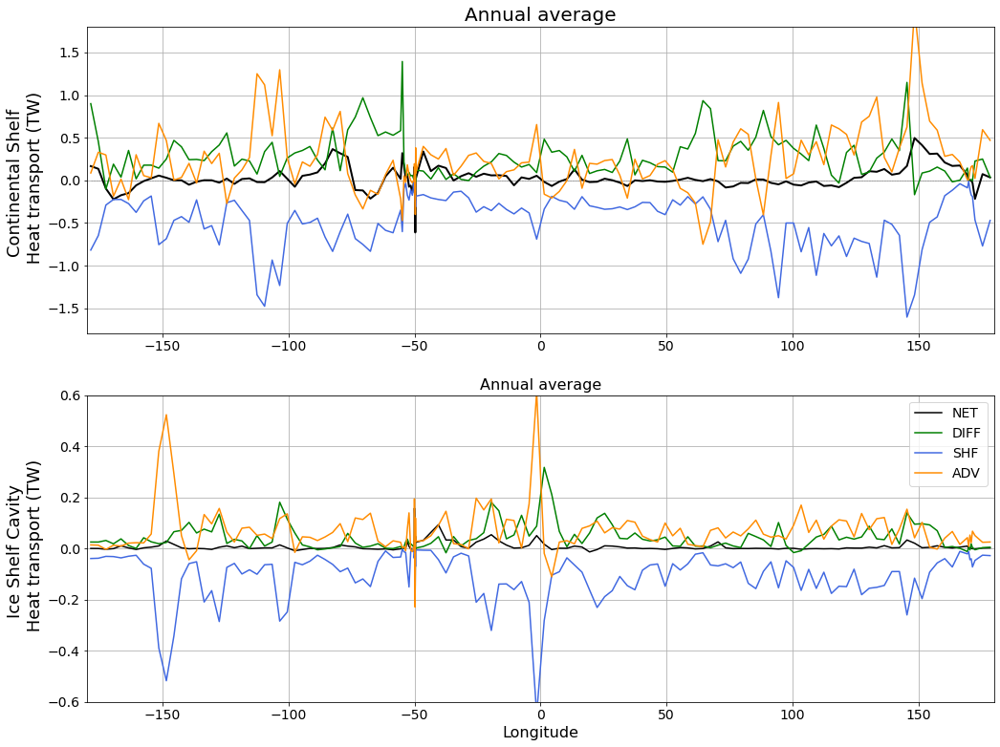

In [96]:
fig = plt.figure(figsize=(17,13))

ax1 = fig.add_subplot(2,1,1)
ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*0,'--',color='gray',linewidth=0.5)

ax1.plot(w4_lon_bins,w4_net.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=2, alpha=1)
ax1.plot(w4_lon_bins,w4_hdiff.mean('ocean_time')*1e-12,color='green',label='DIFF', alpha=1)
ax1.plot(w4_lon_bins,w4_vdiff.mean('ocean_time')*1e-12,color='royalblue',label='SHF', alpha=1)
ax1.plot(w4_lon_bins,w4_hadv.mean('ocean_time')*1e-12,color='darkorange',label='ADV', alpha=1)
ax1.set_title('Annual average', fontsize=20)
ax1.set_xlim(-180,180)
ax1.set_ylim(-1.8,1.8)
ax1.grid('off')
ax1.set_ylabel('Continental Shelf \n Heat transport (TW)',fontsize=18)
ax1.tick_params(axis='x',labelsize=14)
ax1.tick_params(axis='y',labelsize=14)


ax1 = fig.add_subplot(2,1,2)

ax1.plot(w4_lon_bins,w4_net_is.mean('ocean_time')*1e-12,'-k',label='NET',linewidth=1.5,)
ax1.plot(w4_lon_bins,w4_hdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='green',label='DIFF')
ax1.plot(w4_lon_bins,w4_vdiff_is.mean('ocean_time')*1e-12,'-',alpha=1,color='royalblue',label='SHF')
ax1.plot(w4_lon_bins,w4_hadv_is.mean('ocean_time')*1e-12,'-',alpha=1,color='darkorange',label='ADV')
# ax1.set_title('Ice shelf cavity \n Annual average', fontsize=16)
ax1.set_title('Annual average', fontsize=16)
ax1.legend(loc='upper right', fontsize=14)
ax1.set_xlim(-180,180)
ax1.set_ylim(-.6,.6)
ax1.grid('off')
ax1.set_ylabel('Ice Shelf Cavity \n Heat transport (TW)',fontsize=18)
ax1.set_xlabel('Longitude', fontsize=16)
ax1.tick_params(axis='x',labelsize=14)
ax1.tick_params(axis='y',labelsize=14)


name_fig='waom4_lonbin_regional_OHB_wholeshelf_Figure2_SM.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight')

### Read Wind stress:


In [31]:

# # sustr/svstr # waom4

# Ustr = sustr.rename({'eta_u': 'eta','xi_u': 'xi'})*w4_mask_shelf[:,:-1]
# Vstr = svstr.rename({'eta_v': 'eta','xi_v': 'xi'})*w4_mask_shelf[:-1,:]

# Usqr = (Ustr*Ustr)
# Vsqr = (Vstr*Vstr)
# print(Usqr[:,:-1,:].shape, Vsqr[:,:,:-1].shape)
# WSmgn = np.sqrt(Usqr[:,:-1,:]+Vsqr[:,:,:-1])
# WSmgn

# # mask_LonBins_4km.rename({'eta_rho': 'eta','xi_rho': 'xi'})

# lon_bin_midpts = np.arange(-178.5,180,3)
# # define lat bin mid-points:
# lat_bin_midpts = np.arange(lon_bin_midpts[41],lon_bin_midpts[43],0.6667)
# # define lonlat
# lonlat_bin_midpts = np.empty((127))
# lonlat_bin_midpts[0:41] = lon_bin_midpts[0:41]
# lonlat_bin_midpts[41:50] = lat_bin_midpts
# lonlat_bin_midpts[50:] = lon_bin_midpts[43:]

# ## convert mask_LonBins_4km to dataArray:
# coordinatesC=dict(lon_bins=lonlat_bin_midpts, eta=temp_hdiff_4km.eta_rho, xi=temp_hdiff_4km.xi_rho)
# mask_LonBins_4km_xr = xr.DataArray(mask_LonBins_4km, coords = coordinatesC, dims = ['lon_bins','eta_rho','xi_rho'])

# mask_LonBins_4km_xr=mask_LonBins_4km_xr.rename({'eta_rho': 'eta','xi_rho': 'xi'})

# # define Wind Stress x mask_LonLat_Bins
# WS_masked = (mask_LonBins_4km_xr.isel(eta=slice(0,-1),xi=slice(0,-1))*WSmgn)

# files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/WindStress/'
# WS_masked.to_netcdf(files_path + 'waom4_WS_masked_daily_lonlatBins.nc', mode='w', format="NETCDF4")

### read sea ice data:

In [137]:
files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
dsi = xr.open_mfdataset(paths=files_path+'WAOM4_OHB_lonlatbins_seaicec_daily_v2.nc', chunks={'eta_rho': '200MB'}, parallel=bool)
SIC_bin = dsi.__xarray_dataarray_variable__
dsi.close()

### Figure 3: OHB for some regions daily timeseries

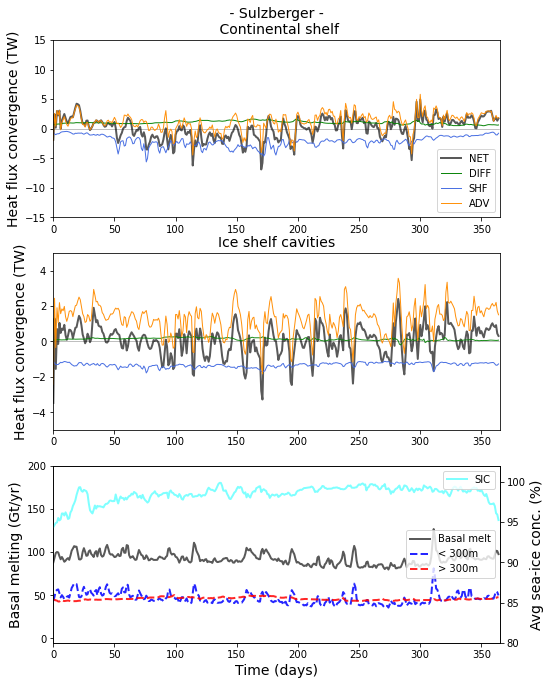

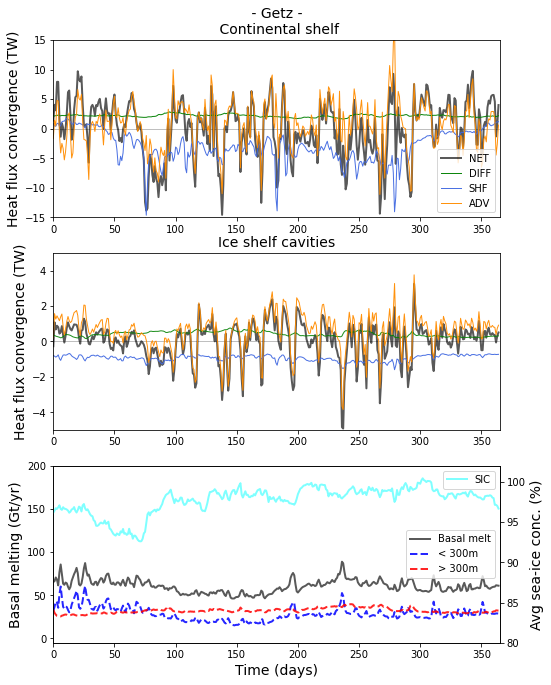

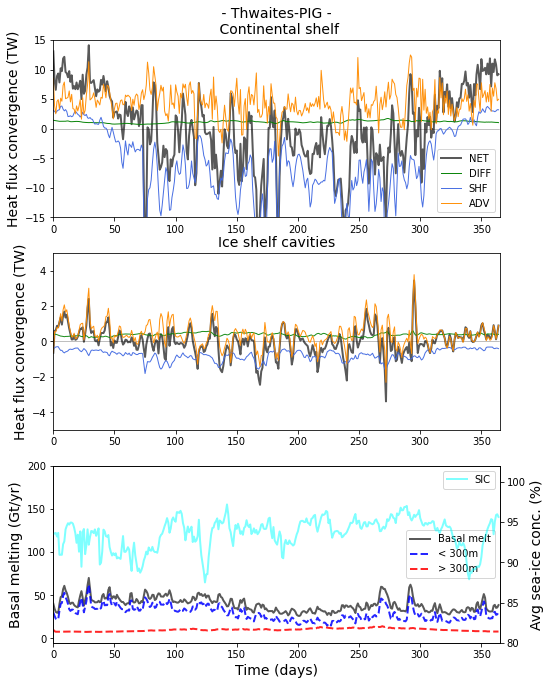

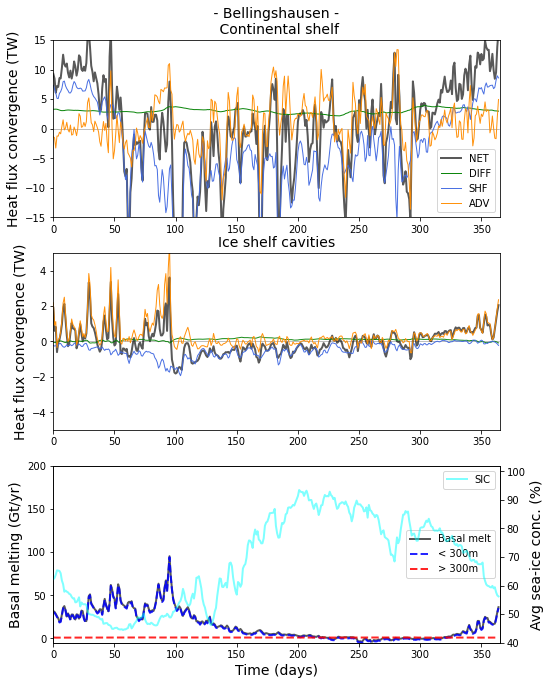

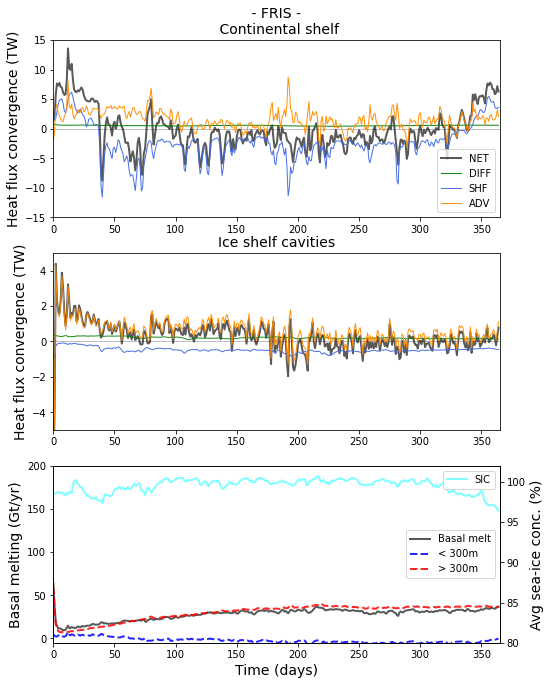

...

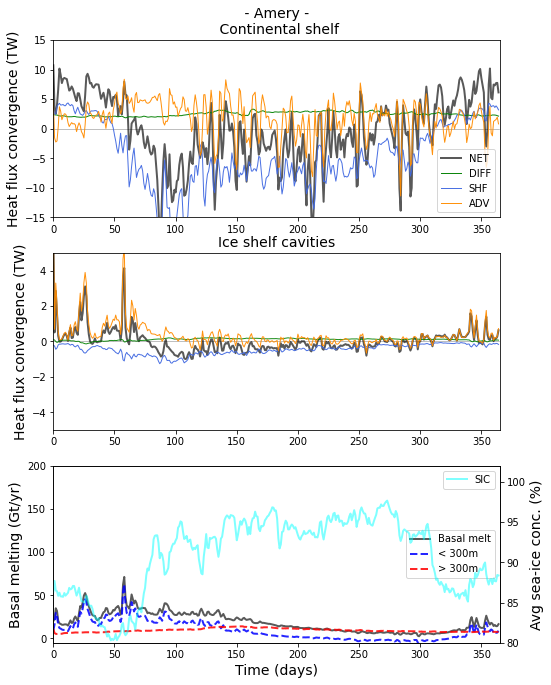

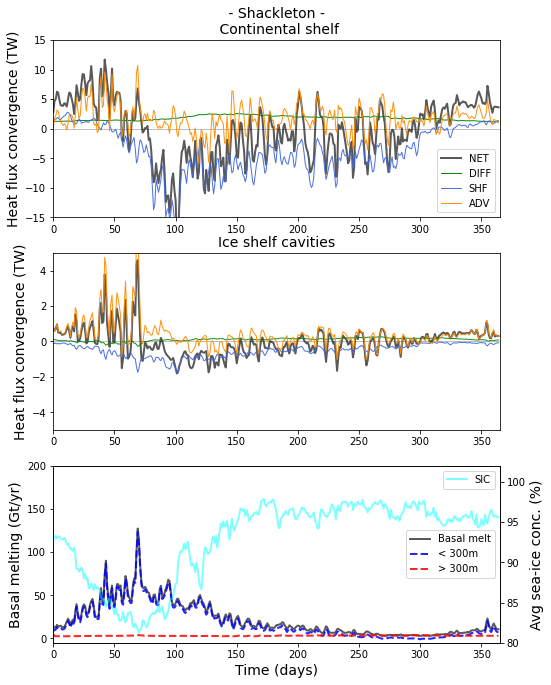

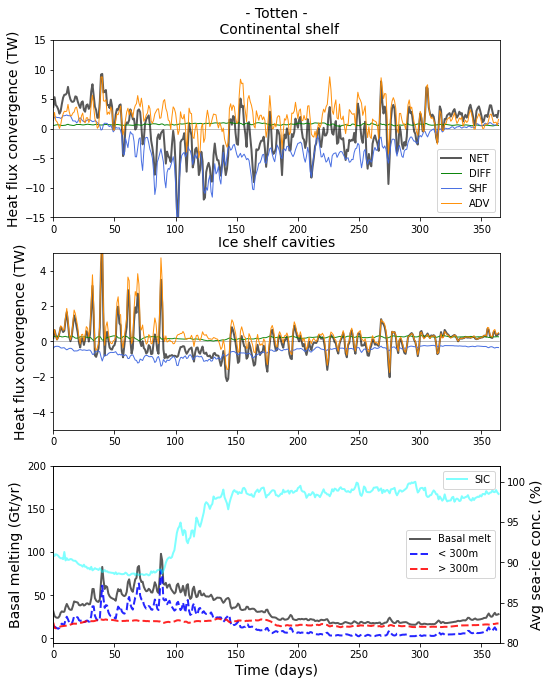

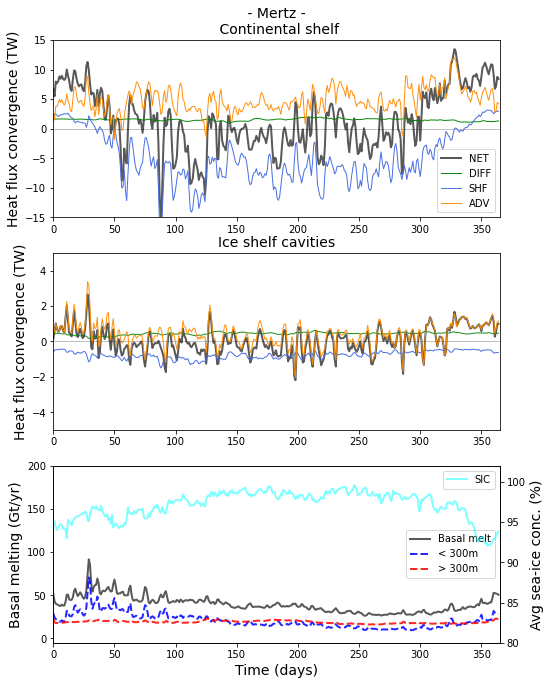

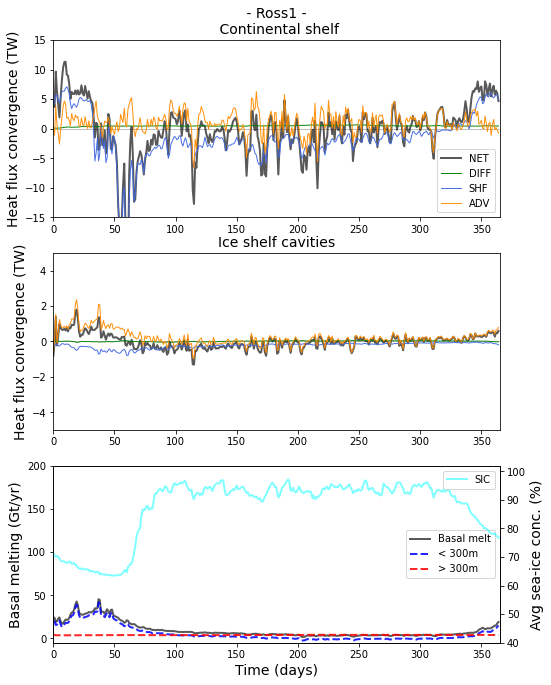

In [142]:
rho_ice=916
Melt_fac=rho_ice*1e-12 # convert to Gigatonne (=1e12 kg)


## loop through sub-regions:

for ii in range(0,11):
# ii=0

    sind = sind_subreg[ii]
    eind = eind_subreg[ii]
    
    fig = plt.figure(figsize=(8,15))
    # fig = plt.figure(figsize=(5,15))

    ax1 = fig.add_subplot(4,1,1, frameon=True)
    ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*0,'-0',color='gray',linewidth=0.5)
    ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='k',label='NET', alpha=0.65, linewidth=2)   
    ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='green',label='DIFF', alpha=0.95, linewidth=1)
    ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='royalblue',label='SHF', alpha=0.95, linewidth=1)
    ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='darkorange',label='ADV', alpha=0.95, linewidth=1)
    ax1.legend(loc='lower right')
    ax1.set_title(' - ' + names_subreg[ii] + ' - \n Continental shelf',fontsize=14)
    ax1.set_ylim(-15,15)
    ax1.set_ylabel('Heat flux convergence (TW)',fontsize=14)
    ax1.set_xlim(0,365)
    
    ax1 = fig.add_subplot(4,1,2, frameon=True)
    ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*0,'-0',color='gray',linewidth=0.5)
    ax1.plot(np.arange(0,365,1),w4_net_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='k',label='NET', alpha=0.65, linewidth=2)
    ax1.plot(np.arange(0,365,1),w4_hdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='green',label='DIFF', alpha=0.89, linewidth=1)
    ax1.plot(np.arange(0,365,1),w4_vdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='royalblue',label='SHF', alpha=0.95, linewidth=1)
    ax1.plot(np.arange(0,365,1),w4_hadv_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='darkorange',label='ADV', alpha=0.95, linewidth=1)
    ax1.set_title('Ice shelf cavities',fontsize=14)
    ax1.set_ylim(-5,5)
    ax1.set_ylabel('Heat flux convergence (TW)',fontsize=14)
    ax1.set_xlim(0,365)
    
    ax2 = fig.add_subplot(4,1,3, frameon=True)
    ax2.plot(np.arange(0,365,1),w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*Melt_fac,'-',color='k',label='Basal melt', alpha=0.65, linewidth=2)
    ax2.plot(np.arange(0,365,1),w4_bmelt_shallow300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*Melt_fac,'--',color='b',label='< 300m', alpha=0.85, linewidth=2)
    ax2.plot(np.arange(0,365,1),w4_bmelt_deep300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*Melt_fac,'--',color='r',label='> 300m', alpha=0.85, linewidth=2)
    ax2.set_ylabel('Basal melting (Gt/yr)',fontsize=14)
    # ax2.set_ylim(0,max_BM[ii])
    ax2.set_ylim(-5,200)
    ax2.legend(loc='center right')
    
    ax2b = ax2.twinx()
    ax2b.plot(np.arange(0,365,1),SIC_bin.isel(lon_bins=slice(sind,eind)).mean('lon_bins')*100,'-',color='cyan',label='SIC',alpha=0.5, linewidth=2) #*100 to convert to %
    ax2b.set_ylabel('Avg sea-ice conc. (%)',fontsize=14)
    ax2b.legend(loc='upper right')
    ax2.set_xlabel('Time (days)',fontsize=14)
    ax2.set_xlim(0,365)
    if ii==3 or ii==10 or ii==11:
        ax2b.set_ylim(40,102)
    else:
        ax2b.set_ylim(80,102)
    
    ## TWIN axis with basal melt? or maybe (Basal melt + SIC) and (Wind stress + SAT)?
# WSmgn[0,:,:]*mask_LonBins_4km[ii,:]
    # ax3 = fig.add_subplot(4,1,4, frameon=True)
    # # ax3.plot(np.arange(0,365,1),WS_masked.mean('eta').mean('xi').isel(slice(sind,eind)),
    #          '-',color='b', linewidth=2)
    # ax3.set_ylabel('Wind stress magnitude (m/yr)')
    # ax3.set_ylim(0,max_BM[ii])
    # # figure out units basal melting is wrong ->>> need to divided by area_sum masked for each 3deg-sector!!!!
    # ax3.set_xlabel('Time (days)')
    # ax3.set_xlim(0,365)

    # name_fig='waom4_lonbin_'+ names_subreg[ii]+'_300m_b.png'
    name_fig='waom4_lonbin_'+ names_subreg[ii]+'_300m.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')
# plt.show()

In [72]:
sind_subreg

[8, 14, 22, 32, 49, 75, 99, 108, 114, 124, 135, 0]

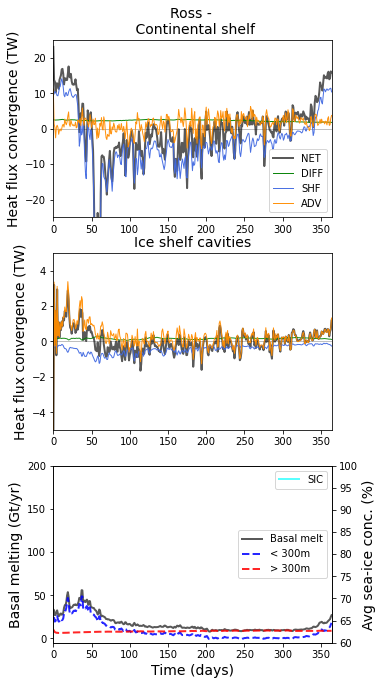

In [141]:
## Plot Ross1 + Ross2:

rho_ice=916
Melt_fac=rho_ice*1e-12 # convert to Gigatonne (=1e12 kg)


## define Ross = ross1 + ross2 sections:

ii=10
sind = sind_subreg[ii]
eind = eind_subreg[ii]
Net_1 = w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Adv_1 = w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Diff_1 = w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Sfc_1 = w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')

Net_is_1 = w4_net_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Adv_is_1 = w4_hadv_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Diff_is_1 = w4_hdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Sfc_is_1 = w4_vdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_1 = w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_1s = w4_bmelt_shallow300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_1d = w4_bmelt_deep300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
SIC_1 = SIC_bin.isel(lon_bins=slice(sind,eind)).mean('lon_bins')

ii=11
sind = sind_subreg[ii]
eind = eind_subreg[ii]
Net_2 = w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Adv_2 = w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Diff_2 = w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Sfc_2 = w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')

Net_is_2 = w4_net_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Adv_is_2 = w4_hadv_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Diff_is_2 = w4_hdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Sfc_is_2 = w4_vdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_2 = w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_2s = w4_bmelt_shallow300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
Melt_2d = w4_bmelt_deep300.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
SIC_2 = SIC_bin.isel(lon_bins=slice(sind,eind)).mean('lon_bins')

Net = Net_1+Net_2
Adv = Adv_1+Adv_2
Diff = Diff_1+Diff_2
Sfc = Sfc_1+Sfc_2

Net_is = Net_is_1+Net_is_2
Adv_is = Adv_is_1+Adv_is_2
Diff_is = Diff_is_1+Diff_is_2
Sfc_is = Sfc_is_1+Sfc_is_2
Melt = Melt_1 + Melt_2
Melt_shallow = Melt_1s + Melt_2s
Melt_deep = Melt_1d + Melt_2d
SIC = SIC_1 + SIC_2

## loop through sub-regions:
    
# fig = plt.figure(figsize=(8,15))
fig = plt.figure(figsize=(5,15))

ax1 = fig.add_subplot(4,1,1, frameon=True)
ax1.plot(np.arange(0,365,1),Net*0,'-0',color='gray',linewidth=0.5)
ax1.plot(np.arange(0,365,1),Net*1e-12,'-',color='k',label='NET', alpha=0.65, linewidth=2)   
ax1.plot(np.arange(0,365,1),Diff*1e-12,'-',color='green',label='DIFF', alpha=0.95, linewidth=1)
ax1.plot(np.arange(0,365,1),Sfc*1e-12,'-',color='royalblue',label='SHF', alpha=0.95, linewidth=1)
ax1.plot(np.arange(0,365,1),Adv*1e-12,'-',color='darkorange',label='ADV', alpha=0.95, linewidth=1)
ax1.legend(loc='lower right')
ax1.set_title('Ross - \n Continental shelf',fontsize=14)
ax1.set_ylim(-25,25)
ax1.set_ylabel('Heat flux convergence (TW)',fontsize=14)
ax1.set_xlim(0,365)

ax1 = fig.add_subplot(4,1,2, frameon=True)
ax1.plot(np.arange(0,365,1),Net*0,'-0',color='gray',linewidth=0.5)
ax1.plot(np.arange(0,365,1),Net_is*1e-12,'-',color='k',label='NET', alpha=0.65, linewidth=2)
ax1.plot(np.arange(0,365,1),Diff_is*1e-12,'-',color='green',label='DIFF', alpha=0.89, linewidth=1)
ax1.plot(np.arange(0,365,1),Sfc_is*1e-12,'-',color='royalblue',label='SHF', alpha=0.95, linewidth=1)
ax1.plot(np.arange(0,365,1),Adv_is*1e-12,'-',color='darkorange',label='ADV', alpha=0.95, linewidth=1)
ax1.set_title('Ice shelf cavities',fontsize=14)
ax1.set_ylim(-5,5)
ax1.set_ylabel('Heat flux convergence (TW)',fontsize=14)
ax1.set_xlim(0,365)

ax2 = fig.add_subplot(4,1,3, frameon=True)
ax2.plot(np.arange(0,365,1),Melt*Melt_fac,'-',color='k',label='Basal melt', alpha=0.65, linewidth=2)
ax2.plot(np.arange(0,365,1),Melt_shallow*Melt_fac,'--',color='b',label='< 300m', alpha=0.85, linewidth=2)
ax2.plot(np.arange(0,365,1),Melt_deep*Melt_fac,'--',color='r',label='> 300m', alpha=0.85, linewidth=2)
ax2.set_ylabel('Basal melting (Gt/yr)',fontsize=14)
# ax2.set_ylim(0,max_BM[ii])
ax2.set_ylim(-5,200)
ax2.legend(loc='center right')

ax2b = ax2.twinx()
ax2b.plot(np.arange(0,365,1),SIC*100,'-',color='cyan',label='SIC',alpha=0.65, linewidth=2) #*100 to convert to %
ax2b.set_ylabel('Avg sea-ice conc. (%)',fontsize=14)
ax2b.legend(loc='upper right')
ax2.set_xlabel('Time (days)',fontsize=14)
ax2.set_xlim(0,365)
# if ii==3 or ii==5 or ii==10 or ii==11:
ax2b.set_ylim(60,100)
# else:
    # ax2b.set_ylim(80,100)

## TWIN axis with basal melt? or maybe (Basal melt + SIC) and (Wind stress + SAT)?
# WSmgn[0,:,:]*mask_LonBins_4km[ii,:]
# ax3 = fig.add_subplot(4,1,4, frameon=True)
# # ax3.plot(np.arange(0,365,1),WS_masked.mean('eta').mean('xi').isel(slice(sind,eind)),
#          '-',color='b', linewidth=2)
# ax3.set_ylabel('Wind stress magnitude (m/yr)')
# ax3.set_ylim(0,max_BM[ii])
# # figure out units basal melting is wrong ->>> need to divided by area_sum masked for each 3deg-sector!!!!
# ax3.set_xlabel('Time (days)')
# ax3.set_xlim(0,365)

name_fig='waom4_lonbin_Ross_unif_300m_b.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')
# plt.show()

In [ ]:
plt.plot(np.arange(0,365,1),SIC*100,'-',color='cyan',label='SIC',alpha=0.65, linewidth=2) #*100 to convert to %


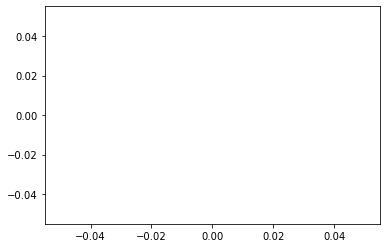

In [123]:
plt.plot(np.arange(0,365,1),SIC_bin.isel(lon_bins=slice(135,140)).mean('lon_bins')*100,'-',color='cyan',label='SIC',alpha=0.65, linewidth=2) #*100 to convert to %
# plt.colorbar()

In [122]:
SIC_bin.shape


(365, 127)

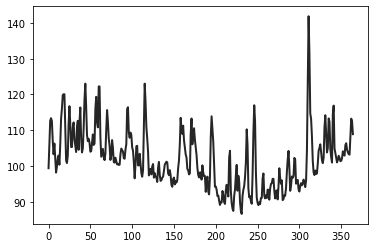

In [103]:
plt.plot(np.arange(0,365,1),w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*Melt_fac,'-',color='k',label='Basal melt', alpha=0.85, linewidth=2)


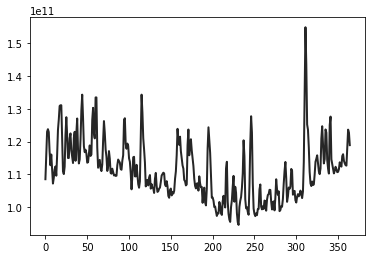

In [104]:
plt.plot(np.arange(0,365,1),w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins'),'-',color='k',label='Basal melt', alpha=0.85, linewidth=2)


### calculate correlations r$^2$:

In [139]:
## calculating correlation between the variables in the figure 3 (above):

def r_square(timeseries1, timeseries2):
    # Calculate the correlation coefficient matrix
    correlation_matrix = np.corrcoef(timeseries1, timeseries2)
    # Extract the correlation coefficient (r)
    r = correlation_matrix[0, 1]
    # Calculate the coefficient of determination (r²)
    r_squared = r ** 2

    return r_squared

In [140]:
win1,win2

(121, 335)

NET x Melt 0.016819419606896785
SHF x Melt 0.9258228065328219
total transp x Melt 0.7821712275713354
ADV x Melt 0.4822700458503251
DIFF x Melt 0.17284375232945665


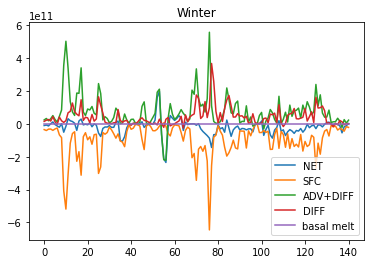

In [141]:
# Correlation between annual/seasonal averages from Fig1: OHCt Versus Basal-melt


var1 = (w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
var1a = (w4_vdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
var1b = (w4_hadv_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))
var1c = (w4_hdiff_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))

var2 = (np.nanmean(w4_bmelt.isel(ocean_time=slice(win1,win2)), axis=0)*Melt_fac*1e-6)

plt.plot(var1,label='NET')
plt.plot(var1a,label='SFC')
plt.plot(var1b+var1c,label='ADV+DIFF')
plt.plot(var1c, label='DIFF')
plt.plot(var2,label='basal melt')
plt.legend()
plt.title('Winter')

# Basal Melt x OHB terms
r2 = r_square(var1, var2)
print('NET x Melt', r2)
r2 = r_square(var1a, var2)
print('SHF x Melt', r2)
r2 = r_square(var1b+var1c, var2)
print('total transp x Melt', r2)
r2 = r_square(var1b, var2)
print('ADV x Melt', r2)
r2 = r_square(var1c, var2)
print('DIFF x Melt', r2)

NET x Melt 0.2587823357263145
SHF x Melt 0.9635213098825729
total transp x Melt 0.2474786621404985
ADV x Melt 0.23083659190617148
DIFF x Melt 0.22962719432534148


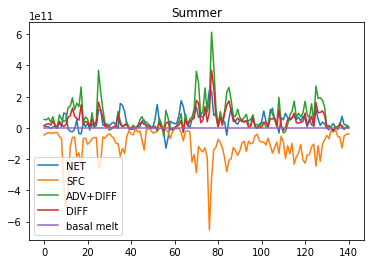

In [142]:
# # WAOM4:
# w4_net_sumA=w4_net.isel(ocean_time=slice(0,sum2))
# w4_net_sumB=w4_net.isel(ocean_time=slice(sum1,-1))
# w4_net_SUM_A=xr.DataArray(w4_net_sumA)
# w4_net_SUM_B=xr.DataArray(w4_net_sumB)
# w4_net_summer = xr.concat((w4_net_SUM_A,w4_net_SUM_B), 'ocean_time')

# Correlation between annual/seasonal averages from Fig1: OHCt Versus Basal-melt

var1_A = (w4_net_is.isel(ocean_time=slice(0,sum2))) #  .mean('ocean_time')*1e-11)
var1_B = (w4_net_is.isel(ocean_time=slice(sum1,-1))) #  .mean('ocean_time')*1e-11)
var1A = xr.DataArray(var1_A)
var1B = xr.DataArray(var1_B)
var1 = xr.concat((var1A,var1B), 'ocean_time').mean('ocean_time')

var1a_A = (w4_vdiff_is.isel(ocean_time=slice(0,sum2))) #  .mean('ocean_time')*1e-11)
var1a_B = (w4_vdiff_is.isel(ocean_time=slice(sum1,-1))) #  .mean('ocean_time')*1e-11)
var1aA = xr.DataArray(var1a_A)
var1aB = xr.DataArray(var1a_B)
var1a = xr.concat((var1aA,var1aB), 'ocean_time').mean('ocean_time')

var1b_A = (w4_hadv_is.isel(ocean_time=slice(0,sum2))) #  .mean('ocean_time')*1e-11)
var1b_B = (w4_hadv_is.isel(ocean_time=slice(sum1,-1))) #  .mean('ocean_time')*1e-11)
var1bA = xr.DataArray(var1b_A)
var1bB = xr.DataArray(var1b_B)
var1b = xr.concat((var1bA,var1bB), 'ocean_time').mean('ocean_time')

var1b_A = (w4_hdiff_is.isel(ocean_time=slice(0,sum2))) #  .mean('ocean_time')*1e-11)
var1b_B = (w4_hdiff_is.isel(ocean_time=slice(sum1,-1))) #  .mean('ocean_time')*1e-11)
var1bA = xr.DataArray(var1b_A)
var1bB = xr.DataArray(var1b_B)
var1b = xr.concat((var1bA,var1bB), 'ocean_time').mean('ocean_time')

var2_A = (w4_bmelt.isel(ocean_time=slice(0,sum2)))*Melt_fac*1e-6#  .mean('ocean_time')*1e-11
var2_B = (w4_bmelt.isel(ocean_time=slice(sum1,-1)))*Melt_fac*1e-6#  .mean('ocean_time')*1e-11)
var2A = xr.DataArray(var2_A)
var2B = xr.DataArray(var2_B)
var2 = xr.concat((var2A,var2B), 'ocean_time').mean('ocean_time')

plt.plot(var1,label='NET')
plt.plot(var1a,label='SFC')
plt.plot(var1b+var1c,label='ADV+DIFF')
plt.plot(var1c, label='DIFF')
plt.plot(var2,label='basal melt')
plt.legend()
plt.title('Summer')

# Basal Melt x OHB terms
r2 = r_square(var1, var2)
print('NET x Melt', r2)
r2 = r_square(var1a, var2)
print('SHF x Melt', r2)
r2 = r_square(var1b+var1c, var2)
print('total transp x Melt', r2)
r2 = r_square(var1b, var2)
print('ADV x Melt', r2)
r2 = r_square(var1c, var2)
print('DIFF x Melt', r2)

NET x Melt 0.03289093856580037
SHF x Melt 0.9599298941658775
total transp x Melt 0.8952266769905581
ADV x Melt 0.692354741605503
DIFF x Melt 0.23986177882716891


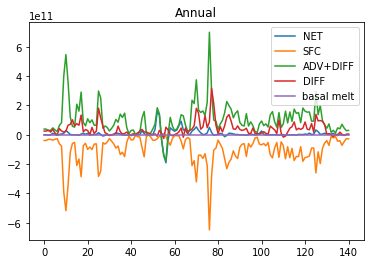

In [143]:
# Correlation between annual/seasonal averages from Fig1: OHCt Versus Basal-melt


var1 = (w4_net_is.mean('ocean_time'))
var1a = (w4_vdiff_is.mean('ocean_time'))
var1b = (w4_hadv_is.mean('ocean_time'))
var1c = (w4_hdiff_is.mean('ocean_time'))

var2 = (np.nanmean(w4_bmelt, axis=0)*Melt_fac*1e-6)

plt.plot(var1,label='NET')
plt.plot(var1a,label='SFC')
plt.plot(var1b+var1c,label='ADV+DIFF')
plt.plot(var1c, label='DIFF')
plt.plot(var2,label='basal melt')
plt.legend()
plt.title('Annual')

# Basal Melt x OHB terms
r2 = r_square(var1, var2)
print('NET x Melt', r2)
r2 = r_square(var1a, var2)
print('SHF x Melt', r2)
r2 = r_square(var1b+var1c, var2)
print('total transp x Melt', r2)
r2 = r_square(var1b, var2)
print('ADV x Melt', r2)
r2 = r_square(var1c, var2)
print('DIFF x Melt', r2)

shelf x cavity (total heat transport) 0.11530723147400573


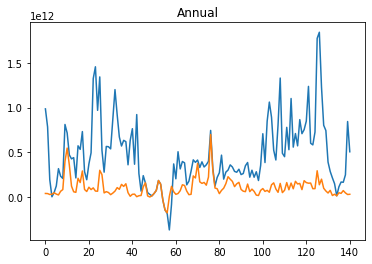

In [145]:
## correlation transp (adv+diff) between IS and SHELF:

var1 = (w4_hadv.mean('ocean_time'))+(w4_hdiff.mean('ocean_time'))
var2 = (w4_hadv_is.mean('ocean_time'))+(w4_hdiff_is.mean('ocean_time'))

plt.plot(var1,label='HT shelf')
plt.plot(var2,label='HT cavity')
plt.title('Annual')

# Basal Melt x OHB terms
r2 = r_square(var1, var2)
print('shelf x cavity (total heat transport)', r2)

In [67]:
# correlation  between time-series for the 11 sub-regions selected
for ii in range(0,11):
# ii=0

    sind = sind_subreg[ii]
    eind = eind_subreg[ii]
    
    Hdiff = w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Vdiff = w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Hadv = w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Net = w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Hdiff_is = w4_hdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Vdiff_is = w4_vdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Hadv_is = w4_hadv_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    Net_is = w4_net_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12
    
    BM = w4_bmelt.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
    BM_Shallow = w4_bmelt_shallow.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
    BM_Deep = w4_bmelt_deep.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
    
    seaice = SIC_bin.isel(lon_bins=slice(sind,eind)).mean('lon_bins')

    # Basal Melt x OHB terms
    r2_BMxNet = r_square(BM, Net)
    r2_BMxNet_is = r_square(BM, Net_is)
    r2_BMxHadv_is = r_square(BM, Hadv_is)
    r2_BMxHdiff_is = r_square(BM, Hdiff_is)
    r2_BMxVdiff_is = r_square(BM, Vdiff_is)
    r2_BMxBMs = r_square(BM, BM_Shallow)

    # Basal melt x SIC
    r2_BMxSIC = r_square(BM, seaice)

    # OHC shelf vs OHB cavity
    r2_NetxNet_is = r_square(Net, Net_is)
    r2_HadvxHadv_is = r_square(Hadv, Hadv_is)
    r2_HdiffxHdiff_is = r_square(Hdiff, Hdiff_is)
    r2_VdiffxVdiff_is = r_square(Vdiff, Vdiff_is)

    # Net x OHB terms: which term dominates more the budget variab.
    r2_NetxHadv = r_square(Net, Hadv)
    r2_NetxHdiff = r_square(Net, Hdiff)
    r2_NetxVdiff = r_square(Net, Vdiff)
    r2_Net_isxHadv_is = r_square(Net_is, Hadv_is)
    r2_Net_isxHdiff_is = r_square(Net_is, Hdiff_is)
    r2_Net_isxVdiff_is = r_square(Net_is, Vdiff_is)


    print('- - - ' + names_subreg[ii])
    # print('a) BM x Net','BM x Net_is','BM x BM shallow','BM x SIC')
    # print(r2_BMxNet, r2_BMxNet_is, r2_BMxBMs, r2_BMxSIC)
    print('b) BM x Hadv_is','BM x Hdiff_is','BM x Vdiff_is','Net x Net_is','Hadv x Hadv_is','Hdiff x Hdiff_is','Vdiff x Vdiff_is')
    print(r2_BMxHadv_is, r2_BMxHdiff_is, r2_BMxVdiff_is, r2_NetxNet_is, r2_HadvxHadv_is, r2_HdiffxHdiff_is, r2_VdiffxVdiff_is)
    print('c) Net x Hadv,  Net x Hdiff, Net x Vdiff (shelf)')
    print(r2_NetxHadv, r2_NetxHdiff, r2_NetxVdiff)
    print('d) Net x Hadv,  Net x Hdiff, Net x Vdiff (ice shelf)')
    print(r2_Net_isxHadv_is, r2_Net_isxHdiff_is, r2_Net_isxVdiff_is)

- - - Sulzberger
b) BM x Hadv_is BM x Hdiff_is BM x Vdiff_is Net x Net_is Hadv x Hadv_is Hdiff x Hdiff_is Vdiff x Vdiff_is
0.008340642160604303 0.02305405765265792 0.20469952404233221 0.4710317513298468 0.4335928086795821 0.421467356912784 0.5552978756563717
c) Net x Hadv,  Net x Hdiff, Net x Vdiff (shelf)
0.7635065243824647 0.11909554561456816 0.42262670237860245
d) Net x Hadv,  Net x Hdiff, Net x Vdiff (ice shelf)
0.981194599638636 0.056743509077807175 0.1634508312517002
- - - Getz
b) BM x Hadv_is BM x Hdiff_is BM x Vdiff_is Net x Net_is Hadv x Hadv_is Hdiff x Hdiff_is Vdiff x Vdiff_is
0.05857388110957309 0.11851221454194918 0.4216653933064251 0.18443417185467226 0.10743067809984437 0.2881630746195671 0.6853939277277366
c) Net x Hadv,  Net x Hdiff, Net x Vdiff (shelf)
0.8109607225070615 0.00038440364844532897 0.1812134288247019
d) Net x Hadv,  Net x Hdiff, Net x Vdiff (ice shelf)
0.9593117937741282 0.01813146405922148 0.23275216828924666
- - - Thwaites-PIG
b) BM x Hadv_is BM x Hdiff_

### Temporal analyses: welch & FFT methods

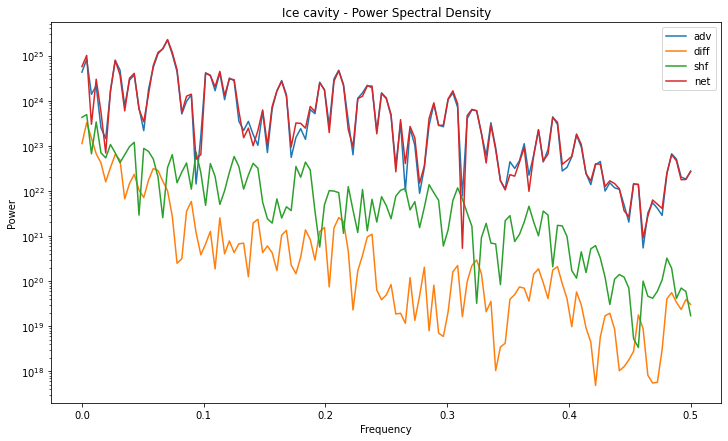

In [78]:
## Temporal analyses:

# 1) spectrum analysis

from scipy.signal import welch

# for ii in range(0,10):
#     sind = sind_subreg[ii]
#     eind = eind_subreg[ii]    
#     ax1.plot(np.arange(0,365,1),w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='green',label='DIFF', alpha=0.55, linewidth=1)
#     ax1.plot(np.arange(0,365,1),w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='royalblue',label='SHF', alpha=0.55, linewidth=1)
#     ax1.plot(np.arange(0,365,1),w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='darkorange',label='ADV', alpha=0.55, linewidth=1)
#     ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*1e-12,'-',color='k',label='NET', alpha=0.55, linewidth=2)

ii=0
sind = sind_subreg[ii]
eind = eind_subreg[ii]   
data_adv=w4_hadv_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_diff=w4_hdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_shf=w4_vdiff_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_net=w4_net_is.isel(lon_bins=slice(sind,eind)).sum('lon_bins')

frequencies_adv, psd_adv = welch(data_adv, fs=1.0)  # fs is the sampling frequency
frequencies_diff, psd_diff = welch(data_diff, fs=1.0)  # fs is the sampling frequency
frequencies_shf, psd_shf = welch(data_shf, fs=1.0)  # fs is the sampling frequency
frequencies_net, psd_net = welch(data_net, fs=1.0)  # fs is the sampling frequency

fig = plt.figure(figsize=(12,7))
plt.semilogy(frequencies_adv, psd_adv, label='adv')
plt.semilogy(frequencies_diff, psd_diff, label='diff')
plt.semilogy(frequencies_shf, psd_shf, label='shf')
plt.semilogy(frequencies_net, psd_net, label='net')
plt.title('Ice cavity - Power Spectral Density')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

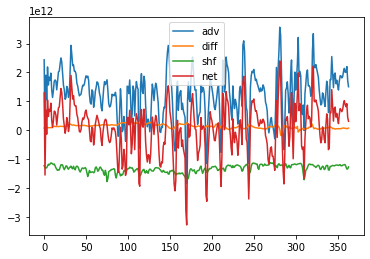

In [79]:
plt.plot(data_adv[1:], label='adv')
plt.plot(data_diff[1:], label='diff')
plt.plot(data_shf[1:], label='shf')
plt.plot(data_net[1:], label='net')
plt.legend()


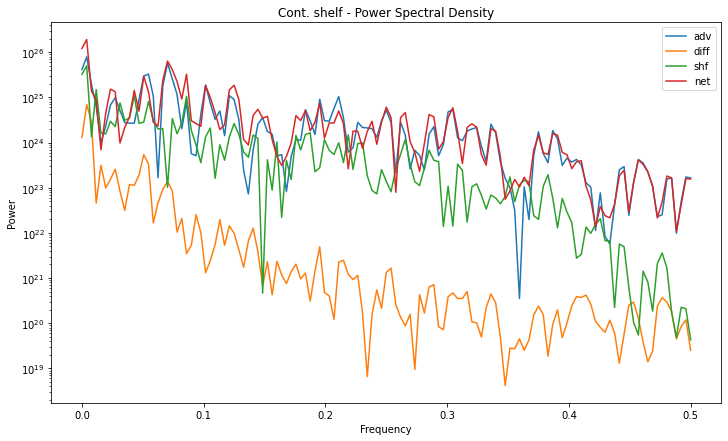

In [80]:
ii=0
sind = sind_subreg[ii]
eind = eind_subreg[ii]   
data_adv=w4_hadv.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_diff=w4_hdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_shf=w4_vdiff.isel(lon_bins=slice(sind,eind)).sum('lon_bins')
data_net=w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')

frequencies_adv, psd_adv = welch(data_adv, fs=1.0)  # fs is the sampling frequency
frequencies_diff, psd_diff = welch(data_diff, fs=1.0)  # fs is the sampling frequency
frequencies_shf, psd_shf = welch(data_shf, fs=1.0)  # fs is the sampling frequency
frequencies_net, psd_net = welch(data_net, fs=1.0)  # fs is the sampling frequency

fig = plt.figure(figsize=(12,7))
plt.semilogy(frequencies_adv, psd_adv, label='adv')
plt.semilogy(frequencies_diff, psd_diff, label='diff')
plt.semilogy(frequencies_shf, psd_shf, label='shf')
plt.semilogy(frequencies_net, psd_net, label='net')
plt.title('Cont. shelf - Power Spectral Density')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.legend()
plt.show()

In [81]:
# 2 attempt) FFT: convert from time to frequency domain

fft_result_adv = np.fft.fft(data_adv)
frequencies_adv = np.fft.fftfreq(len(data_adv))

fft_result_diff = np.fft.fft(data_diff)
frequencies_diff = np.fft.fftfreq(len(data_diff))

fft_result_shf = np.fft.fft(data_shf)
frequencies_shf = np.fft.fftfreq(len(data_shf))

fft_result_net = np.fft.fft(data_net)
frequencies_net = np.fft.fftfreq(len(data_net))

In [71]:
frequencies_adv

array([ 0.        ,  0.00273973,  0.00547945,  0.00821918,  0.0109589 ,
        0.01369863,  0.01643836,  0.01917808,  0.02191781,  0.02465753,
        0.02739726,  0.03013699,  0.03287671,  0.03561644,  0.03835616,
        0.04109589,  0.04383562,  0.04657534,  0.04931507,  0.05205479,
        0.05479452,  0.05753425,  0.06027397,  0.0630137 ,  0.06575342,
        0.06849315,  0.07123288,  0.0739726 ,  0.07671233,  0.07945205,
        0.08219178,  0.08493151,  0.08767123,  0.09041096,  0.09315068,
        0.09589041,  0.09863014,  0.10136986,  0.10410959,  0.10684932,
        0.10958904,  0.11232877,  0.11506849,  0.11780822,  0.12054795,
        0.12328767,  0.1260274 ,  0.12876712,  0.13150685,  0.13424658,
        0.1369863 ,  0.13972603,  0.14246575,  0.14520548,  0.14794521,
        0.15068493,  0.15342466,  0.15616438,  0.15890411,  0.16164384,
        0.16438356,  0.16712329,  0.16986301,  0.17260274,  0.17534247,
        0.17808219,  0.18082192,  0.18356164,  0.18630137,  0.18

In [72]:
# frequencies_adv[10]*86400

# print(1/1, 1/365)


plt.plot(frequencies_adv)}

SyntaxError: unmatched '}' (66827480.py, line 6)

In [ ]:
fig = plt.figure(figsize=(12,7))
plt.plot(frequencies_adv, np.abs(fft_result_adv),'.', label='adv')
plt.plot(frequencies_diff, np.abs(fft_result_diff),'.', label='diff')
plt.plot(frequencies_shf, np.abs(fft_result_shf),'.', label='shf')
plt.plot(frequencies_net, np.abs(fft_result_net),'.', label='net')
plt.title('Spectrum Analysis (FFT')
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.legend()
plt.ylim(0,1e14)
# plt.xlim(0,.5)

plt.show()

### TS-diagrams

In [93]:
# # for ii in range(0,10):

#     sind = sind_subreg[ii]
#     eind = eind_subreg[ii]
    
#     fig = plt.figure(figsize=(12,10))
#     ax1 = fig.add_subplot(2,1,1, frameon=True)
#     ax1.plot(np.arange(0,365,1),w4_net.isel(lon_bins=slice(sind,eind)).sum('lon_bins')*0,'-0',color='gray',linewidth=0.5)

print(temp_4km_CF.shape,salt_4km_CF.shape, z_rho_4km_CF.shape)
print(lon_along_4km_CF.shape, lat_along_4km_CF.shape)

(365, 31, 9018) (365, 31, 9018) (365, 31, 9018)
(9018,) (9018,)


In [94]:
%%time 
# Now I need to get the T,S values for each subregion and make a TSdiagram:

salt_4km_CF.load()
temp_4km_CF.load()
z_rho_4km_CF.load()

CPU times: user 693 ms, sys: 2.45 s, total: 3.14 s
Wall time: 5.66 s


<xarray.Variable (ocean_time: 365, s_rho: 31, contour_index_array: 9018)>
array([[[ -264.86822578,  -266.87704394,  -216.09016005, ...,
         -1862.878163  , -1730.9784054 , -1587.08869116],
        [ -260.37740488,  -262.40654356,  -212.10334024, ...,
         -1852.3190415 , -1720.83442054, -1577.38571136],
        [ -255.23911573,  -257.2962218 ,  -207.64036157, ...,
         -1835.16352522, -1704.70555481, -1562.32583581],
        ...,
        [  -12.32483742,   -16.40019681,   -11.20809361, ...,
          -275.38257322,  -274.86573043,  -266.30897832],
        [   -7.97426487,   -12.06828838,    -7.32441475, ...,
          -266.25229933,  -266.01813293,  -257.76635778],
        [   -3.73194183,    -7.84335099,    -3.52034437, ...,
          -258.22486939,  -258.17114105,  -250.11935071]],

       [[ -264.86775121,  -266.87657163,  -216.08963161, ...,
         -1862.87818789, -1730.9784399 , -1587.08873048],
        [ -260.37593059,  -262.40507667,  -212.10170867, ...,
         -1852.31913014, -1720.83454206, -1577.38584822],
        [ -255.23649758,  -257.29361797,  -207.63749512, ...,
         -1835.16371743, -1704.70581469, -1562.32612406],
...
        [  -12.27188746,   -16.34769575,   -11.15473237, ...,
          -275.36385128,  -274.84295383,  -266.28092753],
        [   -7.92041038,   -12.01488697,    -7.27005136, ...,
          -266.23347   ,  -265.99521832,  -257.7381261 ],
        [   -3.67720531,    -7.78907145,    -3.46499935, ...,
          -258.20594564,  -258.14810402,  -250.0909571 ]],

       [[ -264.86780247,  -266.87662167,  -216.08969306, ...,
         -1862.87812635, -1730.97835451, -1587.08862412],
        [ -260.37608984,  -262.40523207,  -212.10189839, ...,
         -1852.31891095, -1720.83424129, -1577.38547798],
        [ -255.23678037,  -257.29389381,  -207.63782843, ...,
         -1835.16324211, -1704.70517146, -1562.32534427],
        ...,
        [  -12.27426657,   -16.34995241,   -11.15752894, ...,
          -275.36841983,  -274.84725365,  -266.28627011],
        [   -7.92283014,   -12.01718234,    -7.27290045, ...,
          -266.23806476,  -265.9995442 ,  -257.74350313],
        [   -3.6796647 ,    -7.79140457,    -3.46789989, ...,
          -258.21056343,  -258.15245301,  -250.09636497]]])

In [95]:
## TS diagram to choose isoypcnals:
# print(sigma_2_10km.shape, temp_10km.shape, salt_10km.shape)


# make grid for density contours
smin = 30 - (0.01 * 30)    #salt_ctrl_subregR.min - (0.01 * salt_ctrl_subregR.min)
smax = 36. + (0.01 * 36.)    #salt_ctrl_subregR.max + (0.01 * salt_ctrl_subregR.max)
tmin = -4. + (0.1 * -4.)       #temp_ctrl_subregR.min - (0.1 * temp_ctrl_subregR.max)
tmax = 5 + (0.1 * 5.)       #temp_ctrl_subregR.max + (0.1 * temp_ctrl_subregR.max)
print('tmin, tmax, smin, smax sizes=,', tmin, tmax, smin, smax)
# Calculate how many gridcells we need in the x and y dimensions
xdim = 30
ydim = 20
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(-4,5,ydim)
si = np.linspace(30,36,xdim)

Si, Ti = np.meshgrid(si, ti, sparse=False, indexing='ij')
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.rho(si[i],ti[j],2000) # sigma-2000
# Substract 1000 to convert to sigma-2
dens = dens - 1000

tmin, tmax, smin, smax sizes=, -4.4 5.5 29.7 36.36


### Daily TS-diagrams (take time!)

0
0 0
1
1 0
2
2 0
3
3 0
4
4 0
5
0 1
6
1 1
7
2 1
8
3 1
9
4 1


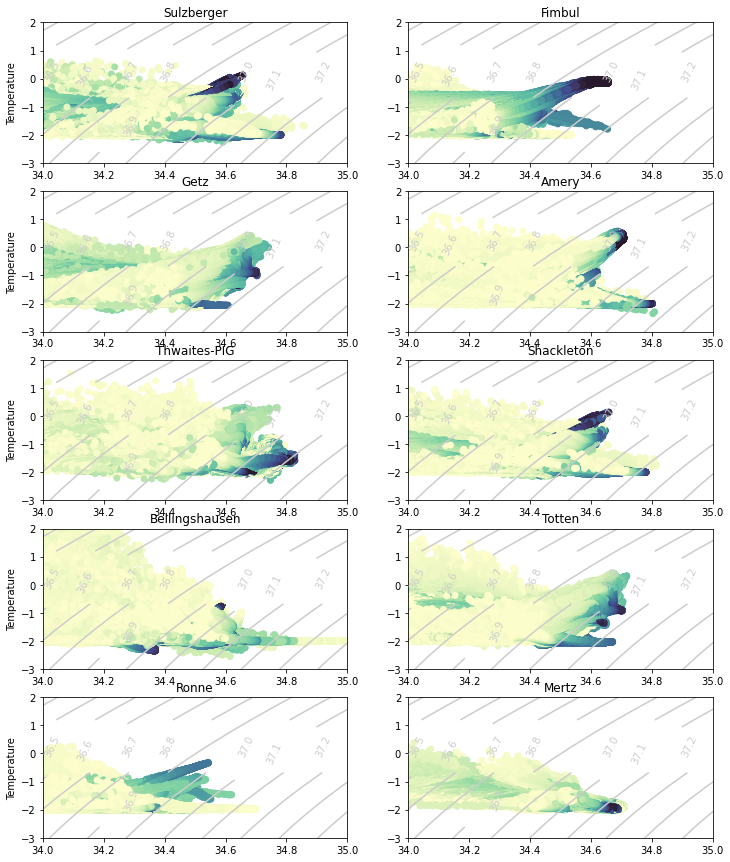

In [225]:
# array with x,y subplot position

fig, ax = plt.subplots(nrows=5, ncols=2, figsize = (12, 15))
for aa in range(0,5):
    for bb in range(0,2):
        CS1 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
        ax[aa,bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
        ax[aa,bb].set_xlim([34,35])
        ax[aa,bb].set_ylim([-3,2])
        if bb==0:
            ax[aa,bb].set_ylabel('Temperature')
        if aa==5:
            ax[aa,bb].set_xlabel('Salinity')

for rr in range(10):
    if rr==9:
        Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1])))#.mean('ocean_time')
        Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1])))#.mean('ocean_time')
        Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1])))#.mean('ocean_time')
    else:
        Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1])))#.mean('ocean_time')
        Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1])))#.mean('ocean_time')
        Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1])))#.mean('ocean_time')
    print(rr)
    if rr<=4:
        bb=0
        aa=rr
    else:
        bb=1
        aa=rr-5

    print(aa,bb)
    c = ax[aa,bb].scatter(Stmp,Ttmp,c=Ztmp, #,marker=".", #s=(72/fig.dpi)**2, 
                 label=names_subreg[rr], cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax[aa,bb].set_title(names_subreg[rr])
#names_subreg[rr]

name_fig='waom4_TSiag_lonbin_subreg_daily.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')

### TS-diag annual:

0
0 0
1
1 0
2
2 0
3
3 0
4
4 0
5
0 1
6
1 1
7
2 1
8
3 1
9
4 1


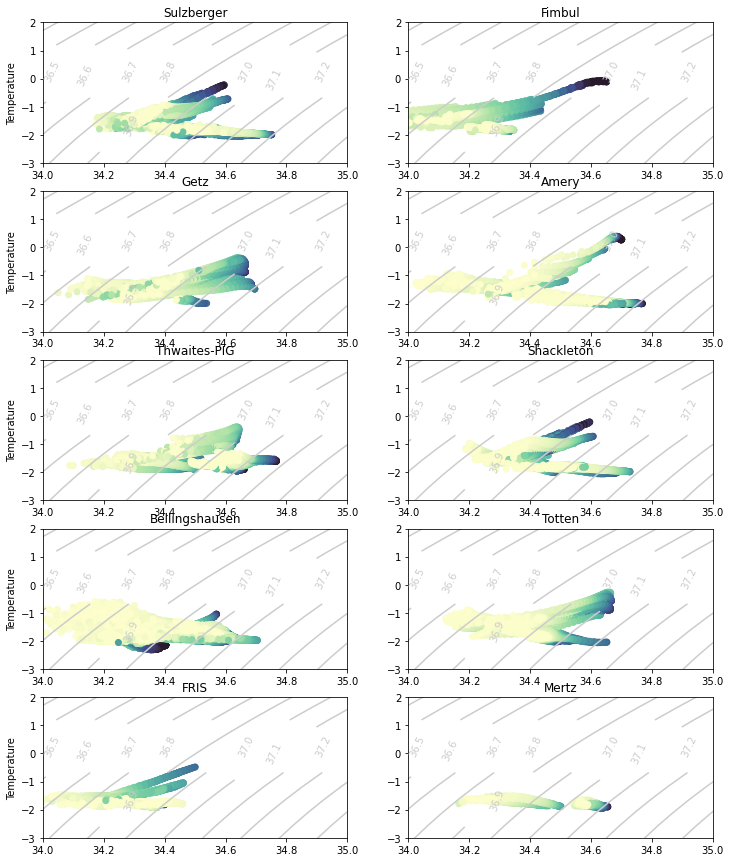

In [116]:
# Annual

fig, ax = plt.subplots(nrows=5, ncols=2, figsize = (12, 15))
for aa in range(0,5):
    for bb in range(0,2):
        CS1 = ax[aa,bb].contour(Si,Ti,dens.transpose(), levels=np.arange(35.5,38,.1),linestyles='solid', colors=[(.8,0.8,0.8)], linewidth=0.1)
        ax[aa,bb].clabel(CS1, CS1.levels, inline=True, fontsize=10)
        ax[aa,bb].set_xlim([34,35])
        ax[aa,bb].set_ylim([-3,2])
        if bb==0:
            ax[aa,bb].set_ylabel('Temperature')
        if aa==5:
            ax[aa,bb].set_xlabel('Salinity')

for rr in range(10):
    if rr==9:
        Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
        Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
        Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
    else:
        Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).mean('ocean_time')
        Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).mean('ocean_time')
        Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),int(indexes_subr[rr,1]))).mean('ocean_time')
    print(rr)
    if rr<=4:
        bb=0
        aa=rr
    else:
        bb=1
        aa=rr-5

    print(aa,bb)
    c = ax[aa,bb].scatter(Stmp,Ttmp,c=Ztmp, #,marker=".", #s=(72/fig.dpi)**2, 
                 label=names_subreg[rr], cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax[aa,bb].set_title(names_subreg[rr])

name_fig='waom4_TSiag_lonbin_subreg_annual.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')

In [52]:


var1 = (w4_net_is.isel(ocean_time=slice(win1,win2)).mean('ocean_time'))

(-3.0, 2.0)

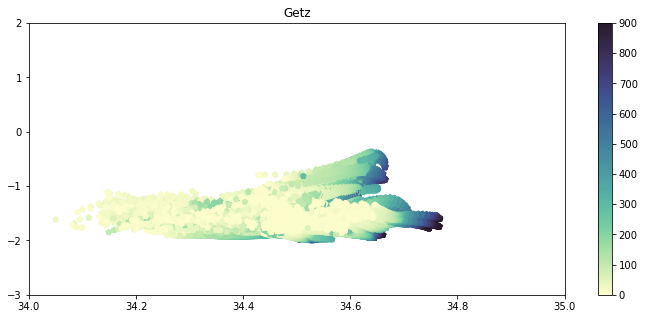

In [54]:
rr=1

Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (12, 5))
c = ax.scatter(Stmp,Ttmp,c=Ztmp,marker="p", #s=(72/fig.dpi)**2, 
             label=names_subreg[rr], cmap=cmocean.cm.deep, vmin=0, vmax=900)
ax.set_title(names_subreg[rr])
plt.colorbar(c)
plt.xlim([34,35])
plt.ylim([-3,2])

In [51]:
### TS diag seasonal (summer vs winter):
temp_4km_CF.shape

(365, 31, 9018)

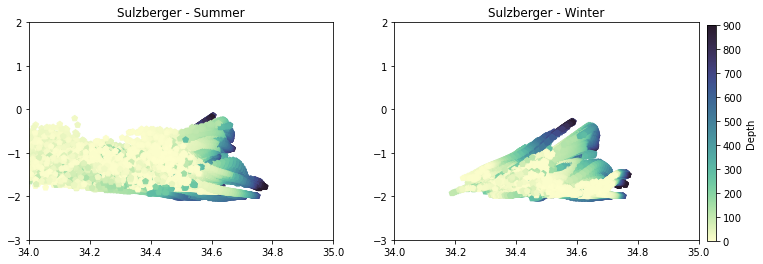

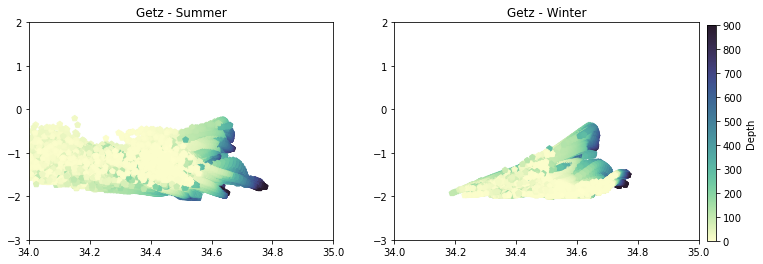

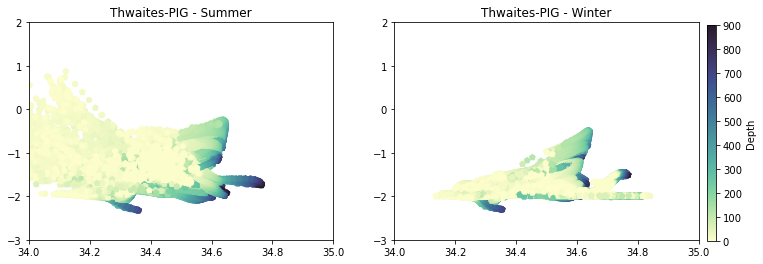

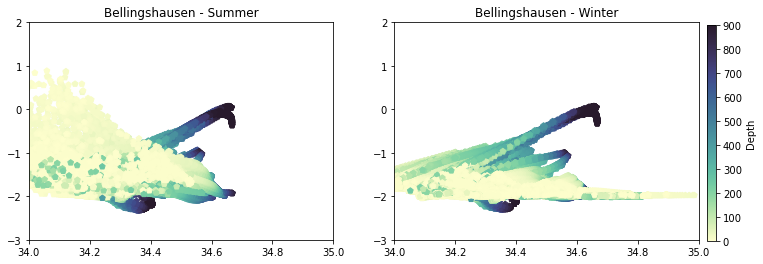

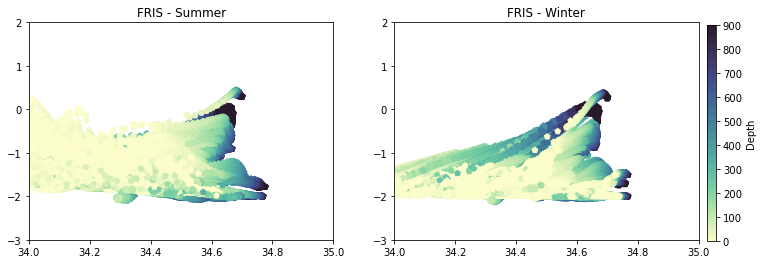

...

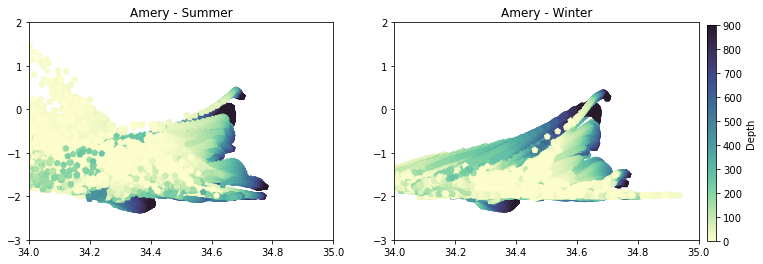

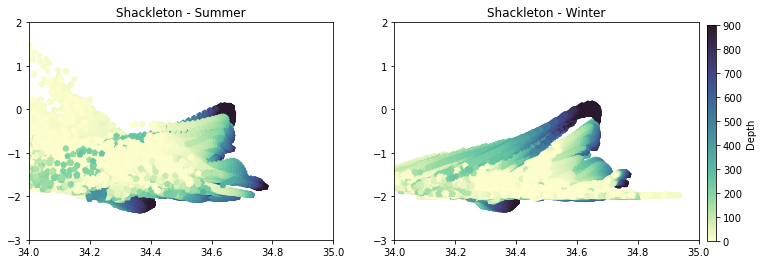

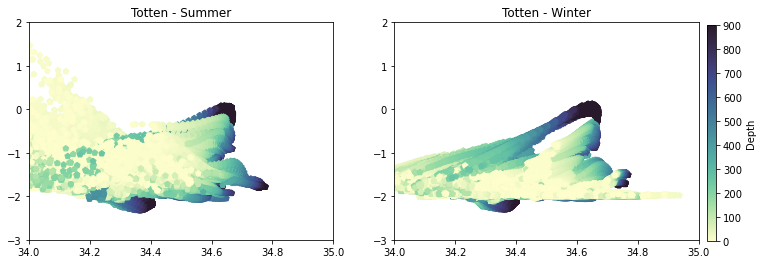

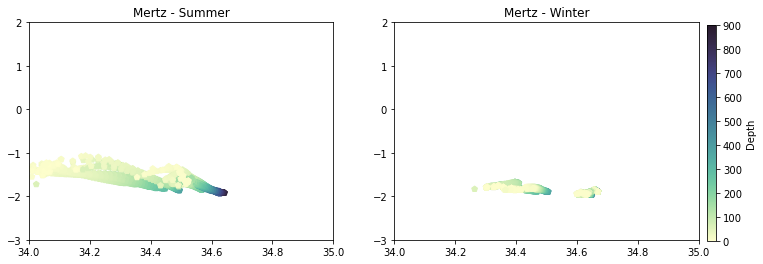

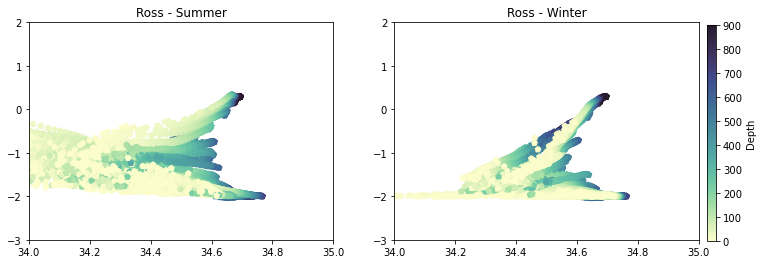

In [147]:
# plot Summer Vs Winter

for rr in range(11):  # give a region from 0-11
    
    # Stmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
    # Ttmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
    # Ztmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).mean('ocean_time')
    
    # define winter average:
    S_win = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    T_win = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    Z_win = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    
    # define summer average:
    S_sum_A = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    S_sum_B = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    S_sum_A = xr.DataArray(S_sum_A)
    S_sum_B = xr.DataArray(S_sum_B)
    S_sum = xr.concat((S_sum_A,S_sum_B), 'ocean_time').mean('ocean_time')
    # -
    T_sum_A = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    T_sum_B = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    T_sum_A = xr.DataArray(T_sum_A)
    T_sum_B = xr.DataArray(T_sum_B)
    T_sum = xr.concat((T_sum_A,T_sum_B), 'ocean_time').mean('ocean_time')
    # -
    Z_sum_A = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    Z_sum_B = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    Z_sum_A = xr.DataArray(Z_sum_A)
    Z_sum_B = xr.DataArray(Z_sum_B)
    Z_sum = xr.concat((Z_sum_A,Z_sum_B), 'ocean_time').mean('ocean_time')
    
    
    # PLOT TS-DIAG SUMMER X WINTER
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (12, 4))
    c = ax[1].scatter(S_win,T_win,c=Z_win,marker="p", #s=(72/fig.dpi)**2, 
                 label=names_subreg[rr], cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax[1].set_title(names_subreg[rr] + ' - Winter')
    ax[1].set_xlim([34,35])
    ax[1].set_ylim([-3,2])
    
    c = ax[0].scatter(S_sum,T_sum,c=Z_sum,marker="p", #s=(72/fig.dpi)**2, 
                 label=names_subreg[rr], cmap=cmocean.cm.deep, vmin=0, vmax=900)
    ax[0].set_title(names_subreg[rr] + ' - Summer')
    ax[0].set_xlim([34,35])
    ax[0].set_ylim([-3,2])

    cbar_ax1 = fig.add_axes([0.91, 0.12,  0.01, 0.75])
    fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    cbar_ax1.set_ylabel('Depth')#, labelpad=-35)



In [70]:
# print(len(dayofmonth))
dayofmonth[0]

slice(0, 32, None)

In [84]:
fig_path

'/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/figs/OHB_shelf/'

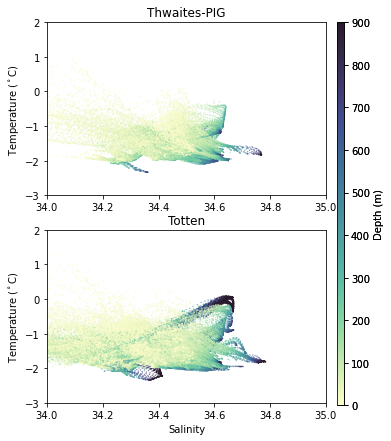

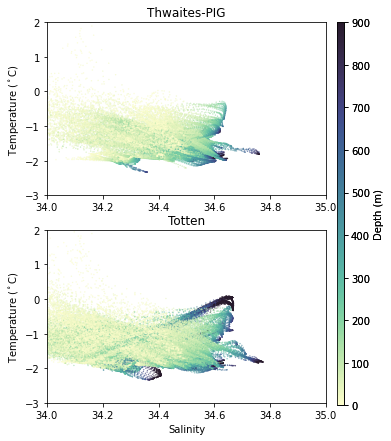

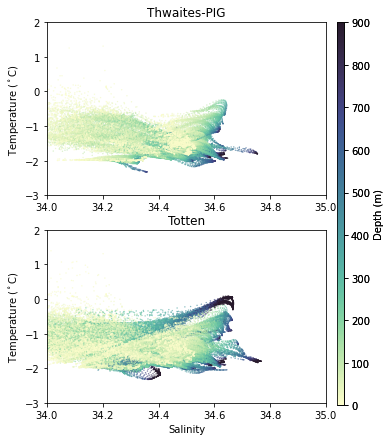

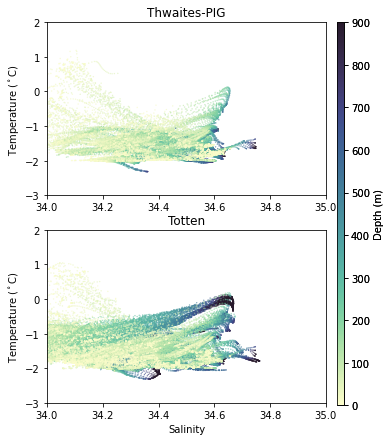

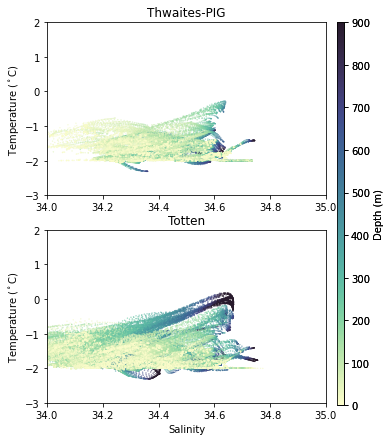

...

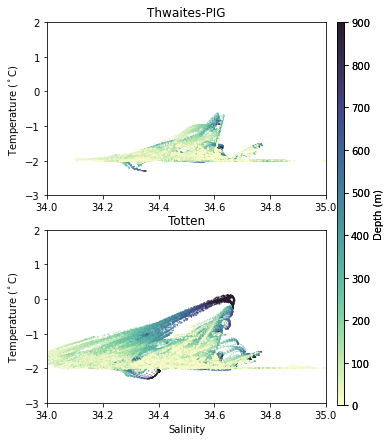

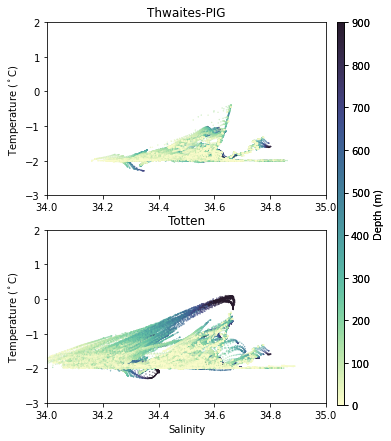

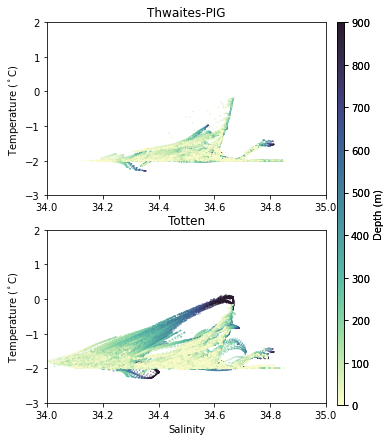

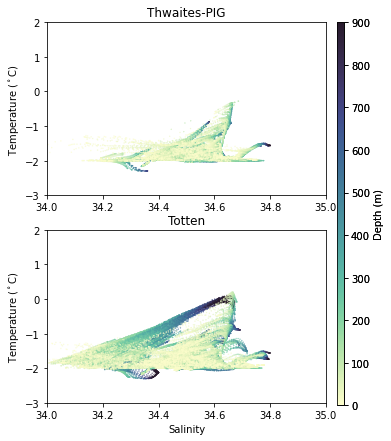

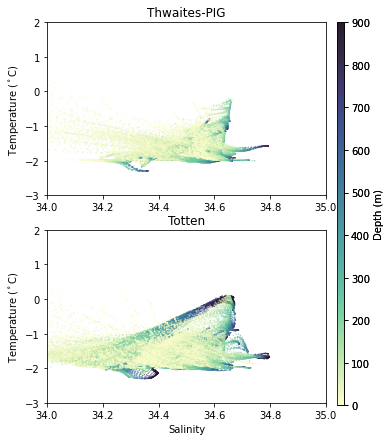

In [85]:
## Monthly TS with depth cbar for movies:

for mm in range(12):
    for rr in [2,8]:  # give a region from 0-11
    
        # define monthly average:
        S_tmp = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
        T_tmp = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
        Z_tmp = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=dayofmonth[mm]).mean('ocean_time')
        
        if rr==2:
            # PLOT TS-DIAG SUMMER X WINTER
            fig, ax = plt.subplots(nrows=2, ncols=1, figsize = (5, 7))
        
            c = ax[0].scatter(S_tmp,T_tmp,c=Z_tmp, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
            ax[0].set_title(names_subreg[rr])
            ax[0].set_xlim([34,35])
            ax[0].set_ylim([-3,2])
            # ax[0].legend()
            ax[0].set_ylabel('Temperature ($^\circ$C)')

        
        else:
            c = ax[1].scatter(S_tmp,T_tmp,c=Z_tmp, s=(22/fig.dpi)**2, 
                            marker="o", cmap=cmocean.cm.deep, vmin=0, vmax=900)
            ax[1].set_title(names_subreg[rr])
            ax[1].set_xlim([34,35])
            ax[1].set_ylim([-3,2])
            ax[1].set_xlabel('Salinity')
            ax[1].set_ylabel('Temperature ($^\circ$C)')
    
        cbar_ax1 = fig.add_axes([0.93, 0.12,  0.02, 0.76])
        fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
        cbar_ax1.set_ylabel('Depth (m)')#, labelpad=-35)
    
    name_fig='waom4_TSiag_TottenXPIG_month=' + str(mm) + '.png'
    plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')

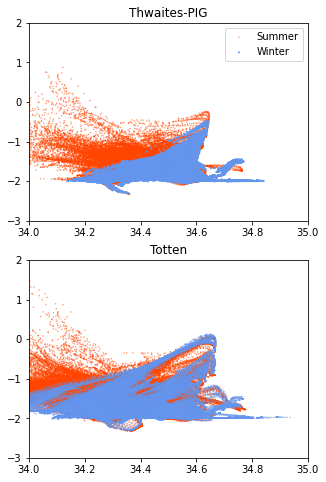

In [57]:
## Figure for paper: Totten x Thwaites, Summer (blue dots) vs summer (red crosses):

for rr in [2,8]:  # give a region from 0-11
    
    # define winter average:
    S_win = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    T_win = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    Z_win = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(win1,win2)).mean('ocean_time')
    
    # define summer average:
    S_sum_A = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    S_sum_B = salt_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    S_sum_A = xr.DataArray(S_sum_A)
    S_sum_B = xr.DataArray(S_sum_B)
    S_sum = xr.concat((S_sum_A,S_sum_B), 'ocean_time').mean('ocean_time')
    # -
    T_sum_A = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    T_sum_B = temp_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    T_sum_A = xr.DataArray(T_sum_A)
    T_sum_B = xr.DataArray(T_sum_B)
    T_sum = xr.concat((T_sum_A,T_sum_B), 'ocean_time').mean('ocean_time')
    # -
    Z_sum_A = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(0,sum2))
    Z_sum_B = -z_rho_4km_CF.isel(contour_index_array=slice(int(indexes_subr[rr,0]),-1)).isel(contour_index_array=slice(0,int(indexes_subr[rr,1]))).isel(ocean_time=slice(sum1,-1))
    Z_sum_A = xr.DataArray(Z_sum_A)
    Z_sum_B = xr.DataArray(Z_sum_B)
    Z_sum = xr.concat((Z_sum_A,Z_sum_B), 'ocean_time').mean('ocean_time')
    
    if rr==2:
        # PLOT TS-DIAG SUMMER X WINTER
        fig, ax = plt.subplots(nrows=2, ncols=1, figsize = (5, 8))
    
        c = ax[0].scatter(S_sum,T_sum,marker="o", s=(22/fig.dpi)**2, 
                     facecolors='none', edgecolors='orangered', label='Summer') 
        c = ax[0].scatter(S_win,T_win,marker="o", s=(72/fig.dpi)**2, 
                     facecolors='none', edgecolor='cornflowerblue', label='Winter')
        ax[0].set_title(names_subreg[rr])
        ax[0].set_xlim([34,35])
        ax[0].set_ylim([-3,2])
        ax[0].legend()
    
    else:
        c = ax[1].scatter(S_sum,T_sum,marker="o", s=(22/fig.dpi)**2, 
                     facecolors='none', edgecolors='orangered') # cmap=cmocean.cm.deep, vmin=0, vmax=900)
        c = ax[1].scatter(S_win,T_win,marker="o", s=(22/fig.dpi)**2, 
                     facecolors='none', edgecolor='cornflowerblue')#cmap=cmocean.cm.deep, vmin=0, vmax=900)
        ax[1].set_title(names_subreg[rr])
        ax[1].set_xlim([34,35])
        ax[1].set_ylim([-3,2])

    # cbar_ax1 = fig.add_axes([0.91, 0.12,  0.01, 0.75])
    # fig.colorbar(c, cax=cbar_ax1, orientation='vertical')
    # cbar_ax1.set_ylabel('Depth')#, labelpad=-35)
    
name_fig='waom4_TSiag_TottenXPIG.png'
plt.savefig(fig_path + name_fig, dpi=600, bbox_inches='tight', facecolor='white')

In [ ]:
plt.pcolormesh(shflux_4km[7,:,:])
plt.colorbar()

#### section to test volume-integrating and save in a netcdf file

In [80]:
files_path + "WAOM10_OHB_lonbins_temp_hadv_vint_daily"

'/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/WAOM10_OHB_lonbins_temp_hadv_vint_daily'

In [81]:
%%time

tlen=365
# heat tendency due to horizontal advection:
temp_hadv_int = np.empty((tlen))
temp_hadv_vol = np.empty(np.squeeze(temp_hadv[:,0,:,:]).shape)
for mm in np.arange(0,tlen):
# - multplying by dz:
    temp_hadv_dz = temp_hadv[mm,:]*dz[mm,:]
    temp_hadv_vint = np.nansum(temp_hadv_dz, axis=0)
    temp_hadv_vint_masked =  ma.masked_where(condition1, temp_hadv_vint)
    temp_hadv_vol[mm,:] = temp_hadv_vint_masked*area
    temp_hadv_int[mm] = np.nansum(np.nansum(temp_hadv_vol[mm,:],axis=1), axis=0)*Cp*rho0


CPU times: user 3min 14s, sys: 2min 23s, total: 5min 38s
Wall time: 8min 48s


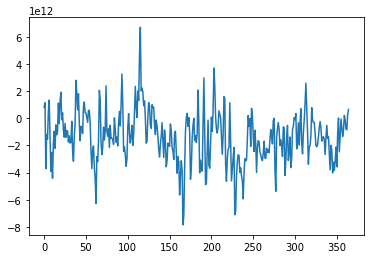

In [82]:
plt.plot(temp_hadv_int)

In [83]:
lon_bin_midpts = np.arange(-178.5,180,3)


In [84]:
temp_hadv_int.shape

(365,)

In [85]:
# saving into a netcdf file:
months=np.arange(0,365)*(1/30.41667)

coordinatesC=dict(ocean_time=months)
temp_hadv_int_xr = xr.DataArray(temp_hadv_int, coords = coordinatesC, dims = ['ocean_time'])

# for py file:
# lon_bin_limits = np.arange(-177,180,3)
# lon_bin_midpts = np.arange(-178.5,180,3)
# coordinatesC=dict(ocean_time=months, lon_bins=lon_bin_midpts)
# temp_hadv_int_xr = xr.DataArray(temp_hadv_int, coords = coordinatesC, dims = ['ocean_time','lon_bins'])

files_path = '/g/data/hh5/tmp/access-om/fbd581/ROMS/postprocessing/cross_contour_tmp/'
temp_hadv_int_xr.to_netcdf(files_path + 'WAOM10_OHB_1lonbin_temp_hadv_vint_daily', mode='w', format="NETCDF4")


In [86]:
temp_hadv

<xarray.DataArray 'temp_hadv' (ocean_time: 365, s_rho: 31, eta_rho: 560,
                               xi_rho: 630)>
dask.array<concatenate, shape=(365, 31, 560, 630), dtype=float32, chunksize=(5, 31, 280, 630), chunktype=numpy.ndarray>
Coordinates:
  * s_rho       (s_rho) float64 -0.9839 -0.9516 -0.9194 ... -0.04839 -0.01613
    x_rho       (eta_rho, xi_rho) float64 dask.array<chunksize=(560, 630), meta=np.ndarray>
    y_rho       (eta_rho, xi_rho) float64 dask.array<chunksize=(560, 630), meta=np.ndarray>
  * ocean_time  (ocean_time) float64 5.992e+08 5.993e+08 ... 6.306e+08 6.307e+08
Dimensions without coordinates: eta_rho, xi_rho
Attributes:
    long_name:  potential temperature, horizontal advection term
    units:      Celsius second-1
    time:       ocean_time
    field:      temp_hadv, scalar, series

In [87]:
mask_LonBins

<xarray.Variable (time: 120, y: 560, x: 630)>
[42336000 values with dtype=float64]

In [88]:
## example for vert.+horz. integral:

# %%time
# # 4. heat tendency due to horizontal advection:
# temp_hadv_int = np.empty((tlen))
# temp_hadv_vol = np.empty(np.squeeze(temp_hadv[:,0,:,:]).shape)
# for mm in np.arange(0,tlen):
# # - multplying by dz:
#     temp_hadv_dz = temp_hadv[mm,:]*dz[mm,:]
#     temp_hadv_vint = np.nansum(temp_hadv_dz, axis=0)
#     temp_hadv_vint_masked =  ma.masked_where(combined_condition, temp_hadv_vint)
#     temp_hadv_vol[mm,:] = temp_hadv_vint_masked*area
#     temp_hadv_int[mm] = np.nansum(np.nansum(temp_hadv_vol[mm,:],axis=1), axis=0)*Cp*rho0
